In [1]:
# Import packages and libraries
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from datetime import date
from datetime import datetime

from sklearn.model_selection import train_test_split
from sklearn.model_selection import PredefinedSplit

from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

import pickle
import math
from scipy.stats import norm
import statsmodels.api as sm
from scipy import stats
from statsmodels.formula.api import ols


In [2]:
pd.set_option('display.max_columns', None)

input_file_path='/kaggle/input/taxi-fareamount-prediction-eda/'

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

### Imports and data loading

In [3]:
#Load dataset (after cleaning)
df_clean=pd.read_csv(input_file_path+"taxi_trip_clean.csv")

In [4]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 80 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   ID                                                      21923 non-null  int64  
 1   VendorID                                                21923 non-null  int64  
 2   tpep_pickup_datetime                                    21923 non-null  object 
 3   tpep_dropoff_datetime                                   21923 non-null  object 
 4   passenger_count                                         21923 non-null  int64  
 5   trip_distance                                           21923 non-null  float64
 6   RatecodeID                                              21923 non-null  int64  
 7   store_and_fwd_flag                                      21923 non-null  object 
 8   PULocationID                        

In [5]:
########################################
#convert string object to datetime
########################################
df_clean['tpep_pickup_datetime'] = pd.to_datetime(df_clean['tpep_pickup_datetime'])
df_clean['tpep_dropoff_datetime'] = pd.to_datetime(df_clean['tpep_dropoff_datetime'])

#confirm after transform
df_clean[['tpep_pickup_datetime','tpep_dropoff_datetime']].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 2 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   tpep_pickup_datetime   21923 non-null  datetime64[ns]
 1   tpep_dropoff_datetime  21923 non-null  datetime64[ns]
dtypes: datetime64[ns](2)
memory usage: 342.7 KB


In [6]:
df_clean.head()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_weekday,DO_weekday,PU_year,PU_weeknum,PU_year_weeknum,PU_nextMonday,PU_date_hour,Borough_PU,Zone_PU,service_zone_PU,Borough_DO,Zone_DO,service_zone_DO,Date,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,time,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),PU_DO_Borough,JFK,Newark,OutsideNYC,nighttime,rushhour,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,holiday,PU_date,fare_amount_log,am_rush,daytime,pm_rush,PU_hour_class,rush_hour,PU_season
0,24870114,2,2017-03-25 08:55:43,2017-03-25 09:09:47,6,3.34,1,N,100,231,1,13.0,0.0,0.5,2.76,0.0,0.3,16.56,8,9,25,25,3,3,Saturday,Saturday,2017,12,2017-12,2017-03-27,2017-03-25-8,Manhattan,Garment District,Yellow Zone,Manhattan,TriBeCa/Civic Center,Yellow Zone,2017-03-27,2.476,2017,2017-03-25 08:00:00,10.6,73,6.0,8.5,0.0,0.0,0.0,0.04,1021.3,1015.1,100,0,79,100,7.4,13.8,309,298,13.3,Manhattan_Manhattan,False,False,False,0,False,14.067,844.0,14.246445,0.924171,3.892216,True,2017-03-25,2.564949,1,0,0,am_rush,0,spring
1,35634249,1,2017-04-11 14:53:28,2017-04-11 15:19:58,1,1.80,1,N,186,43,1,16.0,0.0,0.5,4.00,0.0,0.3,20.80,14,15,11,11,4,4,Tuesday,Tuesday,2017,15,2017-15,2017-04-17,2017-04-11-14,Manhattan,Penn Station/Madison Sq West,Yellow Zone,Manhattan,Central Park,Yellow Zone,2017-04-17,2.585,2017,2017-04-11 14:00:00,22.3,59,13.8,22.3,0.0,0.0,0.0,0.00,1018.9,1012.9,96,0,0,96,16.8,21.6,149,154,33.1,Manhattan_Manhattan,False,False,False,0,False,26.500,1590.0,4.075472,0.603774,8.888889,False,2017-04-11,2.772589,0,1,0,daytime,0,spring
2,106203690,1,2017-12-15 07:26:56,2017-12-15 07:34:08,1,1.00,1,N,262,236,1,6.5,0.0,0.5,1.45,0.0,0.3,8.75,7,7,15,15,12,12,Friday,Friday,2017,50,2017-50,2017-12-18,2017-12-15-7,Manhattan,Yorkville East,Yellow Zone,Manhattan,Upper East Side North,Yellow Zone,2017-12-18,2.660,2017,2017-12-15 07:00:00,-5.7,51,-14.3,-9.6,0.0,0.0,0.0,0.05,1020.1,1013.5,87,0,75,86,2.9,4.3,263,265,6.8,Manhattan_Manhattan,False,False,False,0,False,7.200,432.0,8.333333,0.902778,6.500000,False,2017-12-15,1.871802,1,0,0,am_rush,1,winter
3,38942136,2,2017-05-07 13:17:59,2017-05-07 13:48:14,1,3.70,1,N,188,97,1,20.5,0.0,0.5,6.39,0.0,0.3,27.69,13,13,7,7,5,5,Sunday,Sunday,2017,18,2017-18,2017-05-08,2017-05-07-13,Brooklyn,Prospect-Lefferts Gardens,Boro Zone,Brooklyn,Fort Greene,Boro Zone,2017-05-08,2.561,2017,2017-05-07 13:00:00,13.3,52,3.6,9.1,0.0,0.0,0.0,0.00,1004.2,998.1,94,11,94,0,18.4,23.8,242,245,35.3,Brooklyn_Brooklyn,False,False,False,0,False,30.250,1815.0,7.338843,0.677686,5.540541,True,2017-05-07,3.020425,0,1,0,daytime,0,spring
4,30841670,2,2017-04-15 23:32:20,2017-04-15 23:49:03,1,4.37,1,N,4,112,2,16.5,0.5,0.5,0.00,0.0,0.3,17.80,23,23,15,15,4,4,Saturday,Saturday,2017,15,2017-15,2017-04-17,2017-04-15-23,Manhattan,Alphabet City,Yellow Zone,Brooklyn,Greenpoint,Boro Zone,2017-04-17,2.585,2017,2017-04-15 23:00:00,14.1,91,12.7,12.0,0.0,0.0,0.0,0.00,1018.9,1012.7,27,0,2,26,19.8,35.3,217,220,33.1,Manhattan_Brooklyn,False,False,False,1,False,16.717,1003.0,15.684945,0.987039,3.775744,True,2017-04-15,2.803360,0,0,0,nighttime,0,spring


### Define common variable

In [7]:
#define valid RatecodeID
RateCodeIDList=[1,2,3,4,5,6]

#define valid PULocationID and DOLocationID(exclude 264 Unknown)
LocationIDList=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 265]

#define locationid list without JFK airport, Newark airport, Unknown, Outside of NYC
LocationID_InsideNYC_Standard=[2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29,
 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81,
 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105,
 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126,
 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148,
 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190,
 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211,
 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232,
 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253,
 254, 255, 256, 257, 258, 259, 260, 261, 262, 263]

#taxi zone LocationID of JFK airport
CONST_JFK_LocationID=132

#taxi zone LocationID of LaGuardia Airport
CONST_LaGuardia_LocationID=138

#taxi zone LocationID of Newark airport
CONST_Newark_LocationID=1

#taxi zone LocationID of Unknown
CONST_Unknown_LocationID=264


#Outside of NYC
CONST_Outside_NYC_LocationID=265


#Max work time
MAX_WORK_TIME_MINUTES=720

#Max speed 
MAX_SPEED=70

#rush hour surcharge for Standard Metered Fare
CONST_RUSH_HOUR_SURCHARGE_STANDARD=1

#rush hour surcharge for Manhattan<->JFK
CONST_RUSH_HOUR_SURCHARGE_JFK=4.5

#night time surcharge
CONST_NIGHT_TIME_SURCHARGE=0.5

#standard unit fare: $.50 per One-fifth of a mile 
#or $.50 per minute(60 seconds) traveling at less than 12 miles an hour
STANDARD_UNIT_FARE=0.5

#Standard Metered Fare initial charge
STANDARD_INITIAL_CHARGE=2.5

#define payment type that passenger could use
#1= Credit card 
#2= Cash 
Passenger_Payment=[1,2]




########################################
# Order
########################################
Weekday_Order = ["Sunday","Monday", "Tuesday", "Wednesday", "Thursday", "Friday","Saturday"]


########################################
# Visualization
########################################
#Singal bar color
BAR_COLOR_BLUE='#1f77b4'

In [8]:
df_clean.describe()

,ID,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,PU_hour,DO_hour,PU_day,DO_day,PU_month,DO_month,PU_year,PU_weeknum,NYC_All_Grades_All_Formulations_Retail_Gasoline_Prices,Year,temperature_2m (°C),relative_humidity_2m (%),dew_point_2m (°C),apparent_temperature (°C),precipitation (mm),rain (mm),snowfall (cm),snow_depth (m),pressure_msl (hPa),surface_pressure (hPa),cloud_cover (%),cloud_cover_low (%),cloud_cover_mid (%),cloud_cover_high (%),wind_speed_10m (km/h),wind_speed_100m (km/h),wind_direction_10m (°),wind_direction_100m (°),wind_gusts_10m (km/h),nighttime,duration,duration_sec,avg_speed,fare_per_minute,fare_per_mile,fare_amount_log,am_rush,daytime,pm_rush,rush_hour
count,2.192300e+04,21923.000000,21923,21923,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,2.192300e+04,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.0,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000,21923.000000
mean,5.677166e+07,1.562104,2017-06-29 09:58:01.511015680,2017-06-29 10:12:27.778543104,1.645258,2.913895,1.027049,160.917894,160.246225,1.321124,12.788291,0.332094,0.499019,1.820202,0.297332,3.000000e-01,16.036938,13.723487,13.753455,15.612462,15.616932,6.425216,6.425352,2017.0,26.099849,2.606419,2017.014870,12.528440,68.866898,6.476144,10.391643,0.122105,0.113493,0.006028,0.012432,1016.607545,1010.423026,59.740911,24.437486,31.381061,39.935821,14.295106,22.603877,201.670802,202.602564,27.259773,0.316243,14.437791,866.267527,11.290014,0.977853,6.140901,2.329067,0.153583,0.298636,0.231538,0.286275
min,1.212700e+04,1.000000,2017-01-01 00:08:25,2017-01-01 00:17:20,0.000000,0.010000,1.000000,4.000000,1.000000,1.000000,2.500000,0.000000,0.000000,0.000000,0.000000,3.000000e-01,3.300000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,2017.0,1.000000,2.476000,2017.000000,-16.200000,14.000000,-25.500000,-21.600000,0.000000,0.000000,0.000000,0.000000,980.900000,975.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.400000,1.000000,1.000000,2.200000,0.000000,0.083000,5.000000,0.582996,0.052183,1.714474,0.916291,0.000000,0.000000,0.000000,0.000000
25%,2.861271e+07,1.000000,2017-03-30 09:03:20,2017-03-30 09:17:00,1.000000,1.000000,1.000000,113.000000,107.000000,1.000000,6.500000,0.000000,0.500000,0.000000,0.000000,3.000000e-01,8.750000,9.000000,9.000000,8.000000,8.000000,3.000000,3.000000,2017.0,13.000000,2.530000,2017.000000,4.800000,55.000000,-0.600000,0.500000,0.000000,0.000000,0.000000,0.000000,1012.100000,1006.000000,11.000000,0.000000,0.000000,0.000000,8.900000,15.000000,130.500000,129.000000,18.000000,0.000000,6.733000,404.000000,7.315649,0.767442,4.326923,1.871802,0.000000,0.000000,0.000000,0.000000
50%,5.677814e+07,2.000000,2017-06-23 15:12:43,2017-06-23 15:29:30,1.000000,1.630000,1.000000,161.000000,162.000000,1.000000,9.500000,0.000000,0.500000,1.360000,0.000000,3.000000e-01,11.800000,14.000000,14.000000,16.000000,16.000000,6.000000,6.000000,2017.0,25.000000,2.573000,2017.000000,13.100000,70.000000,7.700000,10.300000,0.000000,0.000000,0.000000,0.000000,1016.100000,1010.000000,79.000000,1.000000,10.000000,12.000000,13.300000,22.100000,222.000000,223.000000,25.600000,0.000000,11.200000,672.000000,9.869822,0.894040,5.504587,2.251292,0.000000,0.000000,0.000000,0.000000
75%,8.536476e+07,2.000000,2017-10-02 09:51:57.500000,2017-10-02 10:01:09.500000,2.000000,3.060000,1.000000,23

In [9]:
#create PU_DO_LocationID
df_clean['PU_DO_LocationID']=df_clean['PULocationID'].astype(str)+'_'+df_clean['DOLocationID'].astype(str)
df_clean[['PULocationID','DOLocationID','PU_DO_LocationID']].head()

,PULocationID,DOLocationID,PU_DO_LocationID
0,100,231,100_231
1,186,43,186_43
2,262,236,262_236
3,188,97,188_97
4,4,112,4_112


### Feature selection

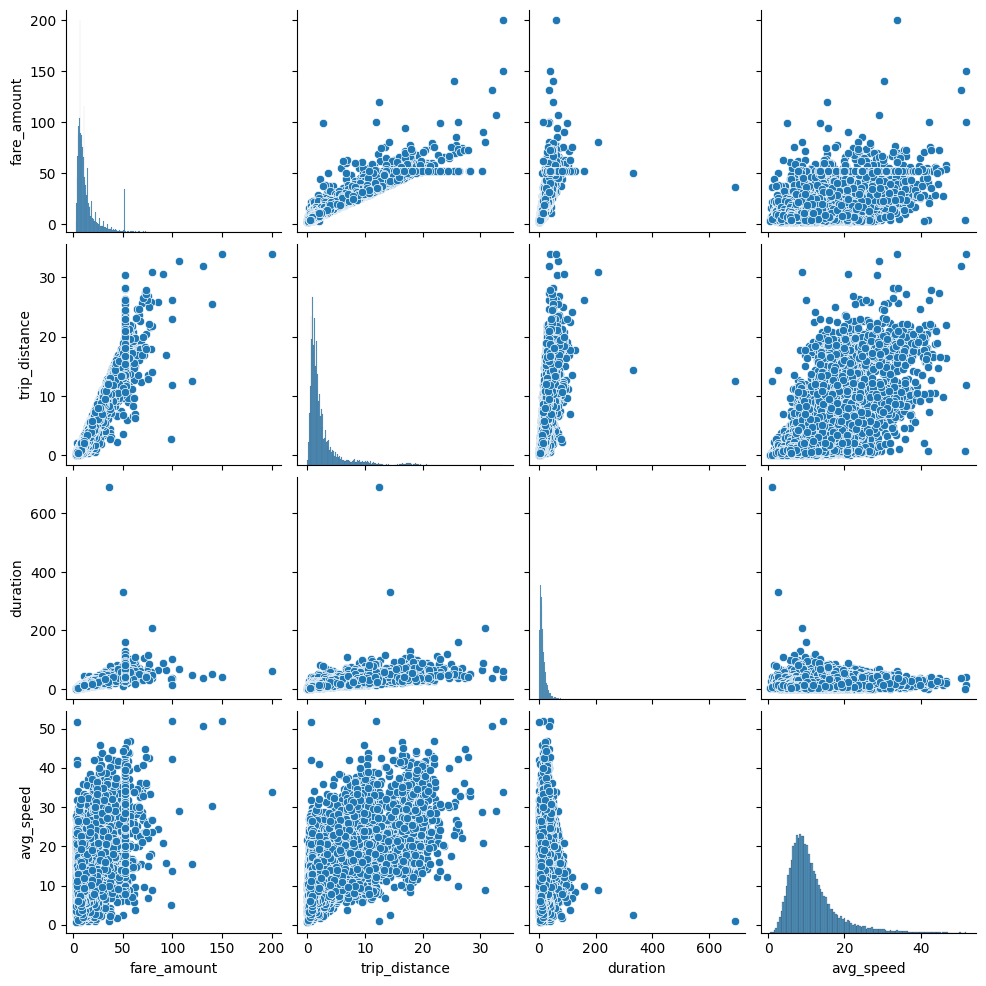

In [10]:
sns.pairplot(df_clean[['fare_amount','trip_distance','duration','avg_speed']])
plt.show()

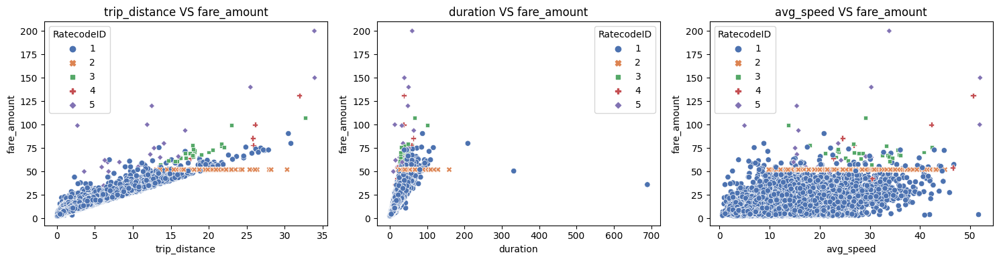

In [11]:
##################################################################################
#visualize the relationship between trip_distance,duration,avg_speed and fare_amount.
##################################################################################
fig,axs=plt.subplots(1,3,figsize=(15,4))

independent_var_list=['trip_distance','duration','avg_speed']

for var,ax in zip(independent_var_list,axs.ravel()):
    sns.scatterplot(data=df_clean, x=var, y="fare_amount",
                    hue='RatecodeID', style="RatecodeID",palette="deep",ax=ax)
    ax.set_title(f"{var} VS fare_amount")
plt.tight_layout()
plt.show()
#For some RatecodeID trip_distance,duration and fare_amount have linear relationship, 
#for some doesn't(e.g. RateCodeID=2 is always 52)

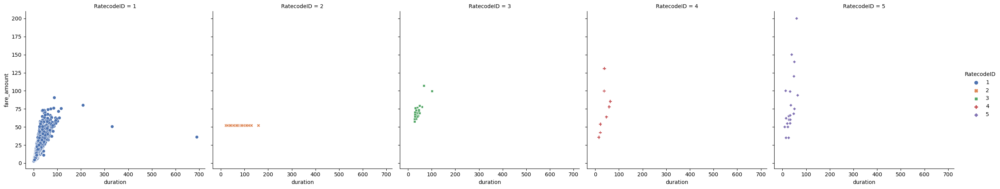

In [12]:
sns.relplot(
    data=df_clean, x="duration", y="fare_amount",
    col="RatecodeID", hue="RatecodeID", style="RatecodeID",
    kind="scatter",palette="deep"
)
plt.show()

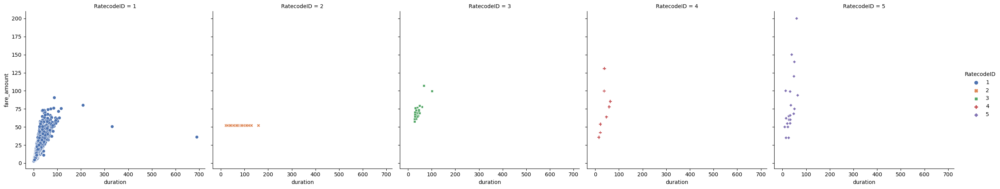

In [13]:
sns.relplot(
    data=df_clean, x="duration", y="fare_amount",
    col="RatecodeID", hue="RatecodeID", style="RatecodeID",
    kind="scatter",palette="deep"
)
plt.show()

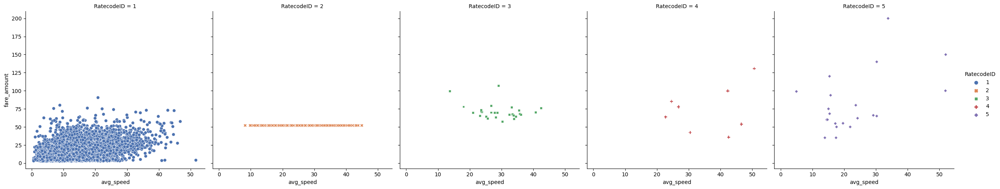

In [14]:
sns.relplot(
    data=df_clean, x="avg_speed", y="fare_amount",
    col="RatecodeID", hue="RatecodeID", style="RatecodeID",
    kind="scatter",palette="deep"
)
plt.show()

In [15]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 81 columns):
 #   Column                                                  Non-Null Count  Dtype         
---  ------                                                  --------------  -----         
 0   ID                                                      21923 non-null  int64         
 1   VendorID                                                21923 non-null  int64         
 2   tpep_pickup_datetime                                    21923 non-null  datetime64[ns]
 3   tpep_dropoff_datetime                                   21923 non-null  datetime64[ns]
 4   passenger_count                                         21923 non-null  int64         
 5   trip_distance                                           21923 non-null  float64       
 6   RatecodeID                                              21923 non-null  int64         
 7   store_and_fwd_flag                                      21



|Feature|Use or not|Reason|
|:-|:-|:-|
|ID|Not Use|It's a trip identification number, unique value which could not be used to learn patterns|
|VendorID|Not Use|* This feature is not obtainable in the production environment.<BR/> * May introduce bias, leading to inequity. |
|tpep_pickup_datetime|$\text{Use}^{*1}$|* Observed difference in this feature.<BR/> * Obtainable in the production environment|
|nighttime|Use|* Observed difference in this feature.<BR/> * Obtainable in the production environment(Extract from tpep_pickup_datetime)|
|rush_hour|Use|* Observed difference in this feature.<BR/> * Obtainable in the production environment(Extract from tpep_pickup_datetime)<BR/>* Limitation: Not robust when NYC traffic condition change|
|holiday|Use|* Observed difference in this feature.<BR/> * Obtainable in the production environment(Extract from tpep_pickup_datetime)|
|PU_season|Not Use|* Not observed difference in this feature.|
|PU_month|Not Use|* Not observed difference in this feature.|
|PU_day|Not Use|* Not observed difference in this feature.|
|PU_weekday|Use|* Observed difference in this feature.<BR/> * Obtainable in the production environment(Extract from tpep_pickup_datetime)|
|PU_hour|Use|* Observed difference in this feature but not linear relationship|
|PU_hour_class|Use|* Observed difference in this feature but not linear relationship|
|tpep_dropoff_datetime|Not Use|* This feature is not obtainable in the production environment.<BR/>|
|passenger_count|Not Use|* Driver-entered value, may unreliable.<BR/>* May introduce bias, leading to inequity.|
|trip_distance|$\text{Use}^{*2}$|* Observed difference in this feature.<BR/> * Not obtainable in the production environment, can be replaced by average value|
|RatecodeID|$\text{Use}^{*3}$|* Observed difference in this feature.<BR/> * Not obtainable in the production environment, could be calculated through PULocationID and DOLocationID, <BR/>however RatecodeID=4(Nassau or Westchester),5(Negotiated fare, used in out of NYC trip, change payment type) are the exception <BR/>because Taxi zone 265(Out of NYC) is huge, could not distinguish one from another, and Negotiated fare are used in multiple conditions |
|store_and_fwd_flag|Not Use|* This feature is not obtainable in the production environment.<BR/> * May introduce bias, leading to inequity.|
|PULocationID|$\text{Use}^{*4}$|* Obtainable in the production environment<BR/>* Use PULocationID and DOLocationID to calculate TarecodeID, mean distance, mean duration and mean speed|
|DOLocationID|$\text{Use}^{*4}$|* Obtainable in the production environment<BR/>* Use PULocationID and DOLocationID to calculate TarecodeID, mean distance, mean duration and mean speed|
|payment_type|Not Use|* May introduce bias, leading to inequity.|
|fare_amount|Use|* Dependent variable|
|extra|Not Use| * Not associated with our dependent variable|
|mta_tax|Not Use|* Not associated with our dependent variable|
|tip_amount|Not Use|* Not associated with our dependent variable|
|tolls_amount|Not Use|* Not associated with our dependent variable|
|improvement_surcharge|Not Use|* Not associated with our dependent variable|
|total_amount|Not Use|* Not associated with our dependent variable|

* 1: Will not use directly, use after transformation(e.g. extract year, season, hour, weekday)
* 2: Will not use directly, use average value after aggregation
* 3: Not obtainable directly, can be calculated through other features
* 4: Will not use directly, used for calculate other features

**[TLC Taxi Fare](https://www.nyc.gov/site/tlc/passengers/taxi-fare.page)**
* > There is no charge for extra passengers, luggage or bags, or paying by credit card.

**[TLC FAQ](https://www.nyc.gov/site/tlc/passengers/passenger-frequently-asked-questions.page)**
*   > What should I do if I want to pay by credit card, but the driver informs me he/she has already pressed the “Cash” button?<BR/>
    > Inform the driver that you wish to pay by credit card. He/she will be able to reset the PIM or enter the amount as a negotiated fare (rate code 5).
  



In [16]:

# some features(e.g. PU_DO_LocationID) are used for aggregation to calculate mean distance, mean speed, mean duration
target_columns=['PU_DO_LocationID','trip_distance','duration','avg_speed',
                'fare_amount','RatecodeID','holiday',
                'PU_hour','PU_weekday','PU_hour_class','rush_hour','nighttime']
df_sample=df_clean[target_columns]
df_sample.info()
df_sample.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   PU_DO_LocationID  21923 non-null  object 
 1   trip_distance     21923 non-null  float64
 2   duration          21923 non-null  float64
 3   avg_speed         21923 non-null  float64
 4   fare_amount       21923 non-null  float64
 5   RatecodeID        21923 non-null  int64  
 6   holiday           21923 non-null  bool   
 7   PU_hour           21923 non-null  int64  
 8   PU_weekday        21923 non-null  object 
 9   PU_hour_class     21923 non-null  object 
 10  rush_hour         21923 non-null  int64  
 11  nighttime         21923 non-null  int64  
dtypes: bool(1), float64(4), int64(4), object(3)
memory usage: 1.9+ MB


,PU_DO_LocationID,trip_distance,duration,avg_speed,fare_amount,RatecodeID,holiday,PU_hour,PU_weekday,PU_hour_class,rush_hour,nighttime
0,100_231,3.34,14.067,14.246445,13.0,1,True,8,Saturday,am_rush,0,0
1,186_43,1.80,26.500,4.075472,16.0,1,False,14,Tuesday,daytime,0,0
2,262_236,1.00,7.200,8.333333,6.5,1,False,7,Friday,am_rush,1,0
3,188_97,3.70,30.250,7.338843,20.5,1,True,13,Sunday,daytime,0,0
4,4_112,4.37,16.717,15.684945,16.5,1,True,23,Saturday,nighttime,0,1


## Build Linear Regression Models

* Plan A: build linear regression model with all RatecodeID
* Plan B: build linear regression model with RatecodeID=1(Standard rate) or RatecodeID=3(Newark)
    * Reason:
      * RatecodeID=2(JFK) is a flat fare($52)
      * RatecodeID=4(Nassau or Westchester) is incomputable since taxi zone 265 represents 'Out of NYC'(includes Nassau or Westchester and other areas)
      * RatecodeID=5(Negotiated fare) is incomputable since taxi zone 265 represents 'Out of NYC'(includes Nassau or Westchester and other areas), besides that RatecodeID=5 also used in change payment type

### Pre-process data

In [17]:
#encode holiday
holiday_map={
    True: 1,
    False: 0
}
df_sample['holiday']=df_sample['holiday'].map(holiday_map)


#encode nighttime
nighttime_map={
    True: 1,
    False: 0
}
#df_sample['nighttime']=df_sample['nighttime'].map(nighttime_map)

#copy RatecodeID to ratecodeid to visualize
df_sample['ratecodeid']=df_sample['RatecodeID']
#encode RatecodeID
ratecodeid_map={
    1:"Standard_rate",
    2:"JFK",
    3:"Newark",
    4:"Nassau_or_Westchester",
    5:"Negotiated_fare",
    6:"Group_ride"
}
df_sample['RatecodeID']=df_sample['RatecodeID'].map(ratecodeid_map)


display(df_sample.head())


,PU_DO_LocationID,trip_distance,duration,avg_speed,fare_amount,RatecodeID,holiday,PU_hour,PU_weekday,PU_hour_class,rush_hour,nighttime,ratecodeid
0,100_231,3.34,14.067,14.246445,13.0,Standard_rate,1,8,Saturday,am_rush,0,0,1
1,186_43,1.80,26.500,4.075472,16.0,Standard_rate,0,14,Tuesday,daytime,0,0,1
2,262_236,1.00,7.200,8.333333,6.5,Standard_rate,0,7,Friday,am_rush,1,0,1
3,188_97,3.70,30.250,7.338843,20.5,Standard_rate,1,13,Sunday,daytime,0,0,1
4,4_112,4.37,16.717,15.684945,16.5,Standard_rate,1,23,Saturday,nighttime,0,1,1


In [18]:
#define group by unit to compute 'mean_distance', 'mean_duration', 'mean_avg_speed'
#unit1: PU_DO_LocationID
df_sample['gpb_unit1']=df_sample['PU_DO_LocationID']
#unit2: PU_DO_LocationID + PU_hour
df_sample['gpb_unit2']=df_sample['PU_DO_LocationID']+'_'+df_sample['PU_hour'].astype(str)
#unit3: PU_DO_LocationID + PU_weekday + PU_hour
df_sample['gpb_unit3']=df_sample['PU_DO_LocationID']+'_'+df_sample['PU_weekday'].astype(str)+'_'+df_sample['PU_hour'].astype(str)
#unit4: PU_DO_LocationID + PU_hour_class
df_sample['gpb_unit4']=df_sample['PU_DO_LocationID']+'_'+df_sample['PU_hour_class'].astype(str)
#unit4: PU_DO_LocationID + holiday + PU_hour_class
df_sample['gpb_unit5']=df_sample['PU_DO_LocationID']+'_'+df_sample['holiday'].astype(str)+'_'+df_sample['PU_hour_class'].astype(str)

df_sample=df_sample.drop(columns=['PU_DO_LocationID'])
df_sample.head()

,trip_distance,duration,avg_speed,fare_amount,RatecodeID,holiday,PU_hour,PU_weekday,PU_hour_class,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5
0,3.34,14.067,14.246445,13.0,Standard_rate,1,8,Saturday,am_rush,0,0,1,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush
1,1.80,26.500,4.075472,16.0,Standard_rate,0,14,Tuesday,daytime,0,0,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime
2,1.00,7.200,8.333333,6.5,Standard_rate,0,7,Friday,am_rush,1,0,1,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush
3,3.70,30.250,7.338843,20.5,Standard_rate,1,13,Sunday,daytime,0,0,1,188_97,188_97_13,188_97_Sunday_13,188_97_daytime,188_97_1_daytime
4,4.37,16.717,15.684945,16.5,Standard_rate,1,23,Saturday,nighttime,0,1,1,4_112,4_112_23,4_112_Saturday_23,4_112_nighttime,4_112_1_nighttime


#### Dummy encoding

In [19]:
df_dummy=df_sample.copy()
cols_to_str=['PU_hour']

# Convert each column to string
for col in cols_to_str:
    df_dummy[col]=df_dummy[col].astype(str)

df_dummy=pd.get_dummies(df_dummy, columns=['RatecodeID','PU_weekday','PU_hour','PU_hour_class'],prefix_sep='_', drop_first=True,dtype=int)
display(df_dummy.info())
df_dummy.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21923 entries, 0 to 21922
Data columns (total 49 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   trip_distance                     21923 non-null  float64
 1   duration                          21923 non-null  float64
 2   avg_speed                         21923 non-null  float64
 3   fare_amount                       21923 non-null  float64
 4   holiday                           21923 non-null  int64  
 5   rush_hour                         21923 non-null  int64  
 6   nighttime                         21923 non-null  int64  
 7   ratecodeid                        21923 non-null  int64  
 8   gpb_unit1                         21923 non-null  object 
 9   gpb_unit2                         21923 non-null  object 
 10  gpb_unit3                         21923 non-null  object 
 11  gpb_unit4                         21923 non-null  object 
 12  gpb_

None

,trip_distance,duration,avg_speed,fare_amount,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Nassau_or_Westchester,RatecodeID_Negotiated_fare,RatecodeID_Newark,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush
0,3.34,14.067,14.246445,13.0,1,0,0,1,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,1.80,26.500,4.075472,16.0,0,0,0,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1.00,7.200,8.333333,6.5,0,1,0,1,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,3.70,30.250,7.338843,20.5,1,0,0,1,188_97,188_97_13,188_97_Sunday_13,188_97_daytime,188_97_1_daytime,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,4.37,16.717,15.684945,16.5,1,0,1,1,4_112,4_112_23,4_112_Saturday_23,4_112_nighttime,4_112_1_nighttime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [20]:
df_standard_rate=df_sample[df_sample['RatecodeID'].isin(['Standard_rate','Newark'])].copy()

cols_to_str=['PU_hour']

# Convert each column to string
for col in cols_to_str:
    df_standard_rate[col]=df_standard_rate[col].astype(str)

df_standard_rate=pd.get_dummies(df_standard_rate, columns=['RatecodeID','PU_weekday','PU_hour','PU_hour_class'],prefix_sep='_', drop_first=True,dtype=int)
display(df_standard_rate.info())
df_standard_rate.head()

<class 'pandas.core.frame.DataFrame'>
Index: 21465 entries, 0 to 21922
Data columns (total 46 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   trip_distance             21465 non-null  float64
 1   duration                  21465 non-null  float64
 2   avg_speed                 21465 non-null  float64
 3   fare_amount               21465 non-null  float64
 4   holiday                   21465 non-null  int64  
 5   rush_hour                 21465 non-null  int64  
 6   nighttime                 21465 non-null  int64  
 7   ratecodeid                21465 non-null  int64  
 8   gpb_unit1                 21465 non-null  object 
 9   gpb_unit2                 21465 non-null  object 
 10  gpb_unit3                 21465 non-null  object 
 11  gpb_unit4                 21465 non-null  object 
 12  gpb_unit5                 21465 non-null  object 
 13  RatecodeID_Standard_rate  21465 non-null  int64  
 14  PU_weekday_

None

,trip_distance,duration,avg_speed,fare_amount,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush
0,3.34,14.067,14.246445,13.0,1,0,0,1,100_231,100_231_8,100_231_Saturday_8,100_231_am_rush,100_231_1_am_rush,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
1,1.80,26.500,4.075472,16.0,0,0,0,1,186_43,186_43_14,186_43_Tuesday_14,186_43_daytime,186_43_0_daytime,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1.00,7.200,8.333333,6.5,0,1,0,1,262_236,262_236_7,262_236_Friday_7,262_236_am_rush,262_236_0_am_rush,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,3.70,30.250,7.338843,20.5,1,0,0,1,188_97,188_97_13,188_97_Sunday_13,188_97_daytime,188_97_1_daytime,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,4.37,16.717,15.684945,16.5,1,0,1,1,4_112,4_112_23,4_112_Saturday_23,4_112_nighttime,4_112_1_nighttime,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


### Create the training, validation and testing data

In [21]:
RANDOM_STATE=0

################################################
#Plan A
#Use all RatecodeID
################################################
y_dummy = df_dummy['fare_amount']
X_dummy = df_dummy.copy()
X_dummy = X_dummy.drop(columns=['fare_amount'], axis = 1)

X_dummy_train_val, X_dummy_test, y_dummy_train_val, y_dummy_test = train_test_split(X_dummy, y_dummy, 
                                                    test_size=0.25,
                                                    random_state=RANDOM_STATE)

# Split train into train and validation sets
X_dummy_train, X_dummy_val, y_dummy_train, y_dummy_val = train_test_split(X_dummy_train_val, y_dummy_train_val, 
                                                  test_size=0.2, 
                                                  random_state=RANDOM_STATE)
################################################
#Plan B
#Use RatecodeID=1 or 3
################################################
y_dummyB = df_standard_rate['fare_amount']
X_dummyB = df_standard_rate.copy()
X_dummyB = X_dummyB.drop(columns=['fare_amount'], axis = 1)

X_dummyB_train_val, X_dummyB_test, y_dummyB_train_val, y_dummyB_test = train_test_split(X_dummyB, y_dummyB, 
                                                    test_size=0.25,
                                                    random_state=RANDOM_STATE)

# Split train into train and validation sets
X_dummyB_train, X_dummyB_val, y_dummyB_train, y_dummyB_val = train_test_split(X_dummyB_train_val, y_dummyB_train_val, 
                                                  test_size=0.2, 
                                                  random_state=RANDOM_STATE)

#### Create `mean_distance` column


In [22]:
################################################
#Use all RatecodeID
################################################
dummy_gpb_unit1=X_dummy_train.groupby(['gpb_unit1'])[['trip_distance']].mean()
dummy_gpb_unit2=X_dummy_train.groupby(['gpb_unit2'])[['trip_distance']].mean()
dummy_gpb_unit3=X_dummy_train.groupby(['gpb_unit3'])[['trip_distance']].mean()
dummy_gpb_unit4=X_dummy_train.groupby(['gpb_unit4'])[['trip_distance']].mean()
dummy_gpb_unit5=X_dummy_train.groupby(['gpb_unit5'])[['trip_distance']].mean()

################################################
#Use RatecodeID=1 or 3
################################################
dummyB_gpb_unit1=X_dummyB_train.groupby(['gpb_unit1'])[['trip_distance']].mean()
dummyB_gpb_unit2=X_dummyB_train.groupby(['gpb_unit2'])[['trip_distance']].mean()
dummyB_gpb_unit3=X_dummyB_train.groupby(['gpb_unit3'])[['trip_distance']].mean()
dummyB_gpb_unit4=X_dummyB_train.groupby(['gpb_unit4'])[['trip_distance']].mean()
dummyB_gpb_unit5=X_dummyB_train.groupby(['gpb_unit5'])[['trip_distance']].mean()

In [23]:
################################################
#Use all RatecodeID
################################################
# 1. Convert `grouped` to a dictionary
dummy_gpb_unit1_dict=dummy_gpb_unit1.to_dict()
dummy_gpb_unit2_dict=dummy_gpb_unit2.to_dict()
dummy_gpb_unit3_dict=dummy_gpb_unit3.to_dict()
dummy_gpb_unit4_dict=dummy_gpb_unit4.to_dict()
dummy_gpb_unit5_dict=dummy_gpb_unit5.to_dict()
# 2. Reassign to only contain the inner dictionary
dummy_gpb_unit1_dict=dummy_gpb_unit1_dict.get('trip_distance')
dummy_gpb_unit2_dict=dummy_gpb_unit2_dict.get('trip_distance')
dummy_gpb_unit3_dict=dummy_gpb_unit3_dict.get('trip_distance')
dummy_gpb_unit4_dict=dummy_gpb_unit4_dict.get('trip_distance')
dummy_gpb_unit5_dict=dummy_gpb_unit5_dict.get('trip_distance')

################################################
#Use RatecodeID=1 or 3
################################################
# 1. Convert `grouped` to a dictionary
dummyB_gpb_unit1_dict=dummyB_gpb_unit1.to_dict()
dummyB_gpb_unit2_dict=dummyB_gpb_unit2.to_dict()
dummyB_gpb_unit3_dict=dummyB_gpb_unit3.to_dict()
dummyB_gpb_unit4_dict=dummyB_gpb_unit4.to_dict()
dummyB_gpb_unit5_dict=dummyB_gpb_unit5.to_dict()
# 2. Reassign to only contain the inner dictionary
dummyB_gpb_unit1_dict=dummyB_gpb_unit1_dict.get('trip_distance')
dummyB_gpb_unit2_dict=dummyB_gpb_unit2_dict.get('trip_distance')
dummyB_gpb_unit3_dict=dummyB_gpb_unit3_dict.get('trip_distance')
dummyB_gpb_unit4_dict=dummyB_gpb_unit4_dict.get('trip_distance')
dummyB_gpb_unit5_dict=dummyB_gpb_unit5_dict.get('trip_distance')

In [24]:
################################################
#Use all RatecodeID
#training set
################################################
# 1. Create a mean_distance column that is a copy of the pickup_dropoff helper column
X_dummy_train['mean_distance_unit1']=X_dummy_train['gpb_unit1']
X_dummy_train['mean_distance_unit2']=X_dummy_train['gpb_unit2']
X_dummy_train['mean_distance_unit3']=X_dummy_train['gpb_unit3']
X_dummy_train['mean_distance_unit4']=X_dummy_train['gpb_unit4']
X_dummy_train['mean_distance_unit5']=X_dummy_train['gpb_unit5']
# 2. Map `grouped_dict` to the `mean_distance` column
X_dummy_train['mean_distance_unit1']=X_dummy_train['mean_distance_unit1'].map(dummy_gpb_unit1_dict)
X_dummy_train['mean_distance_unit2']=X_dummy_train['mean_distance_unit2'].map(dummy_gpb_unit2_dict)
X_dummy_train['mean_distance_unit3']=X_dummy_train['mean_distance_unit3'].map(dummy_gpb_unit3_dict)
X_dummy_train['mean_distance_unit4']=X_dummy_train['mean_distance_unit4'].map(dummy_gpb_unit4_dict)
X_dummy_train['mean_distance_unit5']=X_dummy_train['mean_distance_unit5'].map(dummy_gpb_unit5_dict)

################################################
#Use RatecodeID=1 or 3
#training set
################################################
# 1. Create a mean_distance column that is a copy of the pickup_dropoff helper column
X_dummyB_train['mean_distance_unit1']=X_dummyB_train['gpb_unit1']
X_dummyB_train['mean_distance_unit2']=X_dummyB_train['gpb_unit2']
X_dummyB_train['mean_distance_unit3']=X_dummyB_train['gpb_unit3']
X_dummyB_train['mean_distance_unit4']=X_dummyB_train['gpb_unit4']
X_dummyB_train['mean_distance_unit5']=X_dummyB_train['gpb_unit5']
# 2. Map `grouped_dict` to the `mean_distance` column
X_dummyB_train['mean_distance_unit1']=X_dummyB_train['mean_distance_unit1'].map(dummyB_gpb_unit1_dict)
X_dummyB_train['mean_distance_unit2']=X_dummyB_train['mean_distance_unit2'].map(dummyB_gpb_unit2_dict)
X_dummyB_train['mean_distance_unit3']=X_dummyB_train['mean_distance_unit3'].map(dummyB_gpb_unit3_dict)
X_dummyB_train['mean_distance_unit4']=X_dummyB_train['mean_distance_unit4'].map(dummyB_gpb_unit4_dict)
X_dummyB_train['mean_distance_unit5']=X_dummyB_train['mean_distance_unit5'].map(dummyB_gpb_unit5_dict)


In [25]:
################################################
#Use all RatecodeID
#training set
################################################
# Confirm that it worked
display(X_dummy_train[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].info())
display(X_dummy_train[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].head())

################################################
#Use RatecodeID=1 or 3
#training set
################################################
# Confirm that it worked
display(X_dummyB_train[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].info())
display(X_dummyB_train[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].head())


<class 'pandas.core.frame.DataFrame'>
Index: 13153 entries, 6347 to 3214
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_distance_unit1  13153 non-null  float64
 1   mean_distance_unit2  13153 non-null  float64
 2   mean_distance_unit3  13153 non-null  float64
 3   mean_distance_unit4  13153 non-null  float64
 4   mean_distance_unit5  13153 non-null  float64
dtypes: float64(5)
memory usage: 616.5 KB


None

,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5
6347,2.075000,2.0000,2.00,2.075000,2.000000
8876,1.053117,0.9625,0.88,0.963947,1.038000
279,1.048000,1.1600,1.16,1.282500,1.110000
18331,1.944000,2.1000,2.10,2.100000,2.100000
6326,1.124000,1.3100,2.13,1.231667,1.231667


<class 'pandas.core.frame.DataFrame'>
Index: 12878 entries, 13176 to 7181
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_distance_unit1  12878 non-null  float64
 1   mean_distance_unit2  12878 non-null  float64
 2   mean_distance_unit3  12878 non-null  float64
 3   mean_distance_unit4  12878 non-null  float64
 4   mean_distance_unit5  12878 non-null  float64
dtypes: float64(5)
memory usage: 603.7 KB


None

,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5
13176,5.790000,5.790,5.79,5.790000,5.79
1796,1.025833,1.100,1.10,0.990000,1.10
17673,1.201667,0.700,0.70,0.700000,0.70
11864,1.798333,1.625,2.00,1.700000,1.70
10626,0.608000,0.730,0.73,0.578182,0.64


In [26]:
################################################
#Use all RatecodeID
#validation set
################################################
# 1. Create a mean_distance column that is a copy of the pickup_dropoff helper column
X_dummy_val['mean_distance_unit1']=X_dummy_val['gpb_unit1']
X_dummy_val['mean_distance_unit2']=X_dummy_val['gpb_unit2']
X_dummy_val['mean_distance_unit3']=X_dummy_val['gpb_unit3']
X_dummy_val['mean_distance_unit4']=X_dummy_val['gpb_unit4']
X_dummy_val['mean_distance_unit5']=X_dummy_val['gpb_unit5']
# 2. Map `grouped_dict` to the `mean_distance` column
X_dummy_val['mean_distance_unit1']=X_dummy_val['mean_distance_unit1'].map(dummy_gpb_unit1_dict)
X_dummy_val['mean_distance_unit2']=X_dummy_val['mean_distance_unit2'].map(dummy_gpb_unit2_dict)
X_dummy_val['mean_distance_unit3']=X_dummy_val['mean_distance_unit3'].map(dummy_gpb_unit3_dict)
X_dummy_val['mean_distance_unit4']=X_dummy_val['mean_distance_unit4'].map(dummy_gpb_unit4_dict)
X_dummy_val['mean_distance_unit5']=X_dummy_val['mean_distance_unit5'].map(dummy_gpb_unit5_dict)

################################################
#Use RatecodeID=1 or 3
#validation set
################################################
# 1. Create a mean_distance column that is a copy of the pickup_dropoff helper column
X_dummyB_val['mean_distance_unit1']=X_dummyB_val['gpb_unit1']
X_dummyB_val['mean_distance_unit2']=X_dummyB_val['gpb_unit2']
X_dummyB_val['mean_distance_unit3']=X_dummyB_val['gpb_unit3']
X_dummyB_val['mean_distance_unit4']=X_dummyB_val['gpb_unit4']
X_dummyB_val['mean_distance_unit5']=X_dummyB_val['gpb_unit5']
# 2. Map `grouped_dict` to the `mean_distance` column
X_dummyB_val['mean_distance_unit1']=X_dummyB_val['mean_distance_unit1'].map(dummyB_gpb_unit1_dict)
X_dummyB_val['mean_distance_unit2']=X_dummyB_val['mean_distance_unit2'].map(dummyB_gpb_unit2_dict)
X_dummyB_val['mean_distance_unit3']=X_dummyB_val['mean_distance_unit3'].map(dummyB_gpb_unit3_dict)
X_dummyB_val['mean_distance_unit4']=X_dummyB_val['mean_distance_unit4'].map(dummyB_gpb_unit4_dict)
X_dummyB_val['mean_distance_unit5']=X_dummyB_val['mean_distance_unit5'].map(dummyB_gpb_unit5_dict)

In [27]:
################################################
#Use all RatecodeID
#validation set
################################################
# Confirm that it worked
print(f'Validation set count: {X_dummy_val.shape[0]}')
display(X_dummy_val[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].info())
display(X_dummy_val[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].head())

################################################
#Use RatecodeID=1 or 3
#validation set
################################################
# Confirm that it worked
print(f'Validation set count: {X_dummyB_val.shape[0]}')
display(X_dummyB_val[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].info())
display(X_dummyB_val[['mean_distance_unit1','mean_distance_unit2','mean_distance_unit3','mean_distance_unit4','mean_distance_unit5']].head())

Validation set count: 3289
<class 'pandas.core.frame.DataFrame'>
Index: 3289 entries, 7929 to 6571
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_distance_unit1  2925 non-null   float64
 1   mean_distance_unit2  1206 non-null   float64
 2   mean_distance_unit3  259 non-null    float64
 3   mean_distance_unit4  2376 non-null   float64
 4   mean_distance_unit5  1952 non-null   float64
dtypes: float64(5)
memory usage: 154.2 KB


None

,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5
7929,NaN,NaN,NaN,NaN,NaN
909,NaN,NaN,NaN,NaN,NaN
229,1.4220,NaN,NaN,1.620000,1.833333
6920,11.0255,11.216667,NaN,11.074444,12.616667
9383,3.6000,NaN,NaN,NaN,NaN


Validation set count: 3220
<class 'pandas.core.frame.DataFrame'>
Index: 3220 entries, 17936 to 2586
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_distance_unit1  2884 non-null   float64
 1   mean_distance_unit2  1204 non-null   float64
 2   mean_distance_unit3  271 non-null    float64
 3   mean_distance_unit4  2361 non-null   float64
 4   mean_distance_unit5  1921 non-null   float64
dtypes: float64(5)
memory usage: 150.9 KB


None

,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5
17936,1.506667,1.16,NaN,1.334286,1.225
10165,1.050000,NaN,NaN,NaN,NaN
11283,4.250000,NaN,NaN,NaN,NaN
2430,NaN,NaN,NaN,NaN,NaN
8013,3.105000,NaN,NaN,NaN,NaN


#### Create `mean_duration` column

In [28]:
################################################
#Use all RatecodeID
################################################
dummy_duration_gpb_unit1=X_dummy_train.groupby(['gpb_unit1'])[['duration']].mean()
dummy_duration_gpb_unit2=X_dummy_train.groupby(['gpb_unit2'])[['duration']].mean()
dummy_duration_gpb_unit3=X_dummy_train.groupby(['gpb_unit3'])[['duration']].mean()
dummy_duration_gpb_unit4=X_dummy_train.groupby(['gpb_unit4'])[['duration']].mean()
dummy_duration_gpb_unit5=X_dummy_train.groupby(['gpb_unit5'])[['duration']].mean()

################################################
#Use RatecodeID=1 or 3
################################################
dummyB_duration_gpb_unit1=X_dummyB_train.groupby(['gpb_unit1'])[['duration']].mean()
dummyB_duration_gpb_unit2=X_dummyB_train.groupby(['gpb_unit2'])[['duration']].mean()
dummyB_duration_gpb_unit3=X_dummyB_train.groupby(['gpb_unit3'])[['duration']].mean()
dummyB_duration_gpb_unit4=X_dummyB_train.groupby(['gpb_unit4'])[['duration']].mean()
dummyB_duration_gpb_unit5=X_dummyB_train.groupby(['gpb_unit5'])[['duration']].mean()


In [29]:
################################################
#Use all RatecodeID
################################################
# 1. Convert `grouped` to a dictionary
dummy_duration_gpb_unit1_dict=dummy_duration_gpb_unit1.to_dict()
dummy_duration_gpb_unit2_dict=dummy_duration_gpb_unit2.to_dict()
dummy_duration_gpb_unit3_dict=dummy_duration_gpb_unit3.to_dict()
dummy_duration_gpb_unit4_dict=dummy_duration_gpb_unit4.to_dict()
dummy_duration_gpb_unit5_dict=dummy_duration_gpb_unit5.to_dict()
# 2. Reassign to only contain the inner dictionary
dummy_duration_gpb_unit1_dict=dummy_duration_gpb_unit1_dict.get('duration')
dummy_duration_gpb_unit2_dict=dummy_duration_gpb_unit2_dict.get('duration')
dummy_duration_gpb_unit3_dict=dummy_duration_gpb_unit3_dict.get('duration')
dummy_duration_gpb_unit4_dict=dummy_duration_gpb_unit4_dict.get('duration')
dummy_duration_gpb_unit5_dict=dummy_duration_gpb_unit5_dict.get('duration')

################################################
#Use RatecodeID=1 or 3
################################################
# 1. Convert `grouped` to a dictionary
dummyB_duration_gpb_unit1_dict=dummyB_duration_gpb_unit1.to_dict()
dummyB_duration_gpb_unit2_dict=dummyB_duration_gpb_unit2.to_dict()
dummyB_duration_gpb_unit3_dict=dummyB_duration_gpb_unit3.to_dict()
dummyB_duration_gpb_unit4_dict=dummyB_duration_gpb_unit4.to_dict()
dummyB_duration_gpb_unit5_dict=dummyB_duration_gpb_unit5.to_dict()
# 2. Reassign to only contain the inner dictionary
dummyB_duration_gpb_unit1_dict=dummyB_duration_gpb_unit1_dict.get('duration')
dummyB_duration_gpb_unit2_dict=dummyB_duration_gpb_unit2_dict.get('duration')
dummyB_duration_gpb_unit3_dict=dummyB_duration_gpb_unit3_dict.get('duration')
dummyB_duration_gpb_unit4_dict=dummyB_duration_gpb_unit4_dict.get('duration')
dummyB_duration_gpb_unit5_dict=dummyB_duration_gpb_unit5_dict.get('duration')


In [30]:
################################################
#Use all RatecodeID
#training set
################################################
# 1. Create a duration column that is a copy of the pickup_dropoff helper column
X_dummy_train['mean_duration_unit1']=X_dummy_train['gpb_unit1']
X_dummy_train['mean_duration_unit2']=X_dummy_train['gpb_unit2']
X_dummy_train['mean_duration_unit3']=X_dummy_train['gpb_unit3']
X_dummy_train['mean_duration_unit4']=X_dummy_train['gpb_unit4']
X_dummy_train['mean_duration_unit5']=X_dummy_train['gpb_unit5']
# 2. Map `grouped_dict` to the `duration` column
X_dummy_train['mean_duration_unit1']=X_dummy_train['mean_duration_unit1'].map(dummy_duration_gpb_unit1_dict)
X_dummy_train['mean_duration_unit2']=X_dummy_train['mean_duration_unit2'].map(dummy_duration_gpb_unit2_dict)
X_dummy_train['mean_duration_unit3']=X_dummy_train['mean_duration_unit3'].map(dummy_duration_gpb_unit3_dict)
X_dummy_train['mean_duration_unit4']=X_dummy_train['mean_duration_unit4'].map(dummy_duration_gpb_unit4_dict)
X_dummy_train['mean_duration_unit5']=X_dummy_train['mean_duration_unit5'].map(dummy_duration_gpb_unit5_dict)


################################################
#Use RatecodeID=1 or 3
#training set
################################################
# 1. Create a duration column that is a copy of the pickup_dropoff helper column
X_dummyB_train['mean_duration_unit1']=X_dummyB_train['gpb_unit1']
X_dummyB_train['mean_duration_unit2']=X_dummyB_train['gpb_unit2']
X_dummyB_train['mean_duration_unit3']=X_dummyB_train['gpb_unit3']
X_dummyB_train['mean_duration_unit4']=X_dummyB_train['gpb_unit4']
X_dummyB_train['mean_duration_unit5']=X_dummyB_train['gpb_unit5']
# 2. Map `grouped_dict` to the `duration` column
X_dummyB_train['mean_duration_unit1']=X_dummyB_train['mean_duration_unit1'].map(dummyB_duration_gpb_unit1_dict)
X_dummyB_train['mean_duration_unit2']=X_dummyB_train['mean_duration_unit2'].map(dummyB_duration_gpb_unit2_dict)
X_dummyB_train['mean_duration_unit3']=X_dummyB_train['mean_duration_unit3'].map(dummyB_duration_gpb_unit3_dict)
X_dummyB_train['mean_duration_unit4']=X_dummyB_train['mean_duration_unit4'].map(dummyB_duration_gpb_unit4_dict)
X_dummyB_train['mean_duration_unit5']=X_dummyB_train['mean_duration_unit5'].map(dummyB_duration_gpb_unit5_dict)



In [31]:
################################################
#Use all RatecodeID
#training set
################################################
# Confirm that it worked
display(X_dummy_train[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].info())
display(X_dummy_train[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].head())

################################################
#Use RatecodeID=1 or 3
#training set
################################################
# Confirm that it worked
display(X_dummyB_train[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].info())
display(X_dummyB_train[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].head())



<class 'pandas.core.frame.DataFrame'>
Index: 13153 entries, 6347 to 3214
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_duration_unit1  13153 non-null  float64
 1   mean_duration_unit2  13153 non-null  float64
 2   mean_duration_unit3  13153 non-null  float64
 3   mean_duration_unit4  13153 non-null  float64
 4   mean_duration_unit5  13153 non-null  float64
dtypes: float64(5)
memory usage: 616.5 KB


None

,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5
6347,11.141500,10.900000,10.900,11.141500,10.900000
8876,6.871662,7.900000,5.275,7.542526,4.738300
279,9.502450,8.550000,8.550,8.408250,8.744333
18331,11.023400,12.367000,12.367,12.367000,12.367000
6326,8.751489,10.594667,12.417,7.883500,7.883500


<class 'pandas.core.frame.DataFrame'>
Index: 12878 entries, 13176 to 7181
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_duration_unit1  12878 non-null  float64
 1   mean_duration_unit2  12878 non-null  float64
 2   mean_duration_unit3  12878 non-null  float64
 3   mean_duration_unit4  12878 non-null  float64
 4   mean_duration_unit5  12878 non-null  float64
dtypes: float64(5)
memory usage: 603.7 KB


None

,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5
13176,46.983000,46.98300,46.983,46.9830,46.983000
1796,5.697167,3.58300,3.583,6.8598,3.583000
17673,10.880500,6.90000,6.900,6.9000,6.900000
11864,15.447167,17.25825,16.900,16.4900,20.222000
10626,5.183300,3.56700,3.567,5.4470,4.505667


In [32]:
################################################
#Use all RatecodeID
#validation set
################################################
# 1. Create a duration column that is a copy of the pickup_dropoff helper column
X_dummy_val['mean_duration_unit1']=X_dummy_val['gpb_unit1']
X_dummy_val['mean_duration_unit2']=X_dummy_val['gpb_unit2']
X_dummy_val['mean_duration_unit3']=X_dummy_val['gpb_unit3']
X_dummy_val['mean_duration_unit4']=X_dummy_val['gpb_unit4']
X_dummy_val['mean_duration_unit5']=X_dummy_val['gpb_unit5']
# 2. Map `grouped_dict` to the `duration` column
X_dummy_val['mean_duration_unit1']=X_dummy_val['mean_duration_unit1'].map(dummy_duration_gpb_unit1_dict)
X_dummy_val['mean_duration_unit2']=X_dummy_val['mean_duration_unit2'].map(dummy_duration_gpb_unit2_dict)
X_dummy_val['mean_duration_unit3']=X_dummy_val['mean_duration_unit3'].map(dummy_duration_gpb_unit3_dict)
X_dummy_val['mean_duration_unit4']=X_dummy_val['mean_duration_unit4'].map(dummy_duration_gpb_unit4_dict)
X_dummy_val['mean_duration_unit5']=X_dummy_val['mean_duration_unit5'].map(dummy_duration_gpb_unit5_dict)


################################################
#Use RatecodeID=1 or 3
#validation set
################################################
# 1. Create a duration column that is a copy of the pickup_dropoff helper column
X_dummyB_val['mean_duration_unit1']=X_dummyB_val['gpb_unit1']
X_dummyB_val['mean_duration_unit2']=X_dummyB_val['gpb_unit2']
X_dummyB_val['mean_duration_unit3']=X_dummyB_val['gpb_unit3']
X_dummyB_val['mean_duration_unit4']=X_dummyB_val['gpb_unit4']
X_dummyB_val['mean_duration_unit5']=X_dummyB_val['gpb_unit5']
# 2. Map `grouped_dict` to the `duration` column
X_dummyB_val['mean_duration_unit1']=X_dummyB_val['mean_duration_unit1'].map(dummyB_duration_gpb_unit1_dict)
X_dummyB_val['mean_duration_unit2']=X_dummyB_val['mean_duration_unit2'].map(dummyB_duration_gpb_unit2_dict)
X_dummyB_val['mean_duration_unit3']=X_dummyB_val['mean_duration_unit3'].map(dummyB_duration_gpb_unit3_dict)
X_dummyB_val['mean_duration_unit4']=X_dummyB_val['mean_duration_unit4'].map(dummyB_duration_gpb_unit4_dict)
X_dummyB_val['mean_duration_unit5']=X_dummyB_val['mean_duration_unit5'].map(dummyB_duration_gpb_unit5_dict)




In [33]:
################################################
#Use all RatecodeID
#validation set
################################################
# Confirm that it worked
print(f'Validation set count: {X_dummy_val.shape[0]}')
display(X_dummy_val[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].info())
display(X_dummy_val[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].head())


################################################
#Use RatecodeID=1 or 3
#validation set
################################################
# Confirm that it worked
print(f'Validation set count: {X_dummyB_val.shape[0]}')
display(X_dummyB_val[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].info())
display(X_dummyB_val[['mean_duration_unit1','mean_duration_unit2','mean_duration_unit3','mean_duration_unit4','mean_duration_unit5']].head())



Validation set count: 3289
<class 'pandas.core.frame.DataFrame'>
Index: 3289 entries, 7929 to 6571
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_duration_unit1  2925 non-null   float64
 1   mean_duration_unit2  1206 non-null   float64
 2   mean_duration_unit3  259 non-null    float64
 3   mean_duration_unit4  2376 non-null   float64
 4   mean_duration_unit5  1952 non-null   float64
dtypes: float64(5)
memory usage: 154.2 KB


None

,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5
7929,NaN,NaN,NaN,NaN,NaN
909,NaN,NaN,NaN,NaN,NaN
229,10.61335,NaN,NaN,13.220000,17.100000
6920,44.79745,59.183333,NaN,48.914889,50.044667
9383,29.70000,NaN,NaN,NaN,NaN


Validation set count: 3220
<class 'pandas.core.frame.DataFrame'>
Index: 3220 entries, 17936 to 2586
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   mean_duration_unit1  2884 non-null   float64
 1   mean_duration_unit2  1204 non-null   float64
 2   mean_duration_unit3  271 non-null    float64
 3   mean_duration_unit4  2361 non-null   float64
 4   mean_duration_unit5  1921 non-null   float64
dtypes: float64(5)
memory usage: 150.9 KB


None

,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5
17936,8.640722,5.067,NaN,6.030857,5.97075
10165,6.508500,NaN,NaN,NaN,NaN
11283,15.541500,NaN,NaN,NaN,NaN
2430,NaN,NaN,NaN,NaN,NaN
8013,24.258500,NaN,NaN,NaN,NaN


#### Create `mean_speed` column

In [34]:
################################################
#Use all RatecodeID
################################################
dummy_speed_gpb_unit1=X_dummy_train.groupby(['gpb_unit1'])[['avg_speed']].mean()
dummy_speed_gpb_unit2=X_dummy_train.groupby(['gpb_unit2'])[['avg_speed']].mean()
dummy_speed_gpb_unit3=X_dummy_train.groupby(['gpb_unit3'])[['avg_speed']].mean()
dummy_speed_gpb_unit4=X_dummy_train.groupby(['gpb_unit4'])[['avg_speed']].mean()
dummy_speed_gpb_unit5=X_dummy_train.groupby(['gpb_unit5'])[['avg_speed']].mean()

################################################
#Use RatecodeID=1 or 3
################################################
dummyB_speed_gpb_unit1=X_dummyB_train.groupby(['gpb_unit1'])[['avg_speed']].mean()
dummyB_speed_gpb_unit2=X_dummyB_train.groupby(['gpb_unit2'])[['avg_speed']].mean()
dummyB_speed_gpb_unit3=X_dummyB_train.groupby(['gpb_unit3'])[['avg_speed']].mean()
dummyB_speed_gpb_unit4=X_dummyB_train.groupby(['gpb_unit4'])[['avg_speed']].mean()
dummyB_speed_gpb_unit5=X_dummyB_train.groupby(['gpb_unit5'])[['avg_speed']].mean()



In [35]:
################################################
#Use all RatecodeID
################################################
# 1. Convert `grouped` to a dictionary
dummy_speed_gpb_unit1_dict=dummy_speed_gpb_unit1.to_dict()
dummy_speed_gpb_unit2_dict=dummy_speed_gpb_unit2.to_dict()
dummy_speed_gpb_unit3_dict=dummy_speed_gpb_unit3.to_dict()
dummy_speed_gpb_unit4_dict=dummy_speed_gpb_unit4.to_dict()
dummy_speed_gpb_unit5_dict=dummy_speed_gpb_unit5.to_dict()
# 2. Reassign to only contain the inner dictionary
dummy_speed_gpb_unit1_dict=dummy_speed_gpb_unit1_dict.get('avg_speed')
dummy_speed_gpb_unit2_dict=dummy_speed_gpb_unit2_dict.get('avg_speed')
dummy_speed_gpb_unit3_dict=dummy_speed_gpb_unit3_dict.get('avg_speed')
dummy_speed_gpb_unit4_dict=dummy_speed_gpb_unit4_dict.get('avg_speed')
dummy_speed_gpb_unit5_dict=dummy_speed_gpb_unit5_dict.get('avg_speed')

################################################
#Use RatecodeID=1 or 3
################################################
# 1. Convert `grouped` to a dictionary
dummyB_speed_gpb_unit1_dict=dummyB_speed_gpb_unit1.to_dict()
dummyB_speed_gpb_unit2_dict=dummyB_speed_gpb_unit2.to_dict()
dummyB_speed_gpb_unit3_dict=dummyB_speed_gpb_unit3.to_dict()
dummyB_speed_gpb_unit4_dict=dummyB_speed_gpb_unit4.to_dict()
dummyB_speed_gpb_unit5_dict=dummyB_speed_gpb_unit5.to_dict()
# 2. Reassign to only contain the inner dictionary
dummyB_speed_gpb_unit1_dict=dummyB_speed_gpb_unit1_dict.get('avg_speed')
dummyB_speed_gpb_unit2_dict=dummyB_speed_gpb_unit2_dict.get('avg_speed')
dummyB_speed_gpb_unit3_dict=dummyB_speed_gpb_unit3_dict.get('avg_speed')
dummyB_speed_gpb_unit4_dict=dummyB_speed_gpb_unit4_dict.get('avg_speed')
dummyB_speed_gpb_unit5_dict=dummyB_speed_gpb_unit5_dict.get('avg_speed')



In [36]:
################################################
#Use all RatecodeID
#training set
################################################
# 1. Create a speed column that is a copy of the pickup_dropoff helper column
X_dummy_train['mean_speed_unit1']=X_dummy_train['gpb_unit1']
X_dummy_train['mean_speed_unit2']=X_dummy_train['gpb_unit2']
X_dummy_train['mean_speed_unit3']=X_dummy_train['gpb_unit3']
X_dummy_train['mean_speed_unit4']=X_dummy_train['gpb_unit4']
X_dummy_train['mean_speed_unit5']=X_dummy_train['gpb_unit5']
# 2. Map `grouped_dict` to the `speed` column
X_dummy_train['mean_speed_unit1']=X_dummy_train['mean_speed_unit1'].map(dummy_speed_gpb_unit1_dict)
X_dummy_train['mean_speed_unit2']=X_dummy_train['mean_speed_unit2'].map(dummy_speed_gpb_unit2_dict)
X_dummy_train['mean_speed_unit3']=X_dummy_train['mean_speed_unit3'].map(dummy_speed_gpb_unit3_dict)
X_dummy_train['mean_speed_unit4']=X_dummy_train['mean_speed_unit4'].map(dummy_speed_gpb_unit4_dict)
X_dummy_train['mean_speed_unit5']=X_dummy_train['mean_speed_unit5'].map(dummy_speed_gpb_unit5_dict)


################################################
#Use RatecodeID=1 or 3
#training set
################################################
# 1. Create a speed column that is a copy of the pickup_dropoff helper column
X_dummyB_train['mean_speed_unit1']=X_dummyB_train['gpb_unit1']
X_dummyB_train['mean_speed_unit2']=X_dummyB_train['gpb_unit2']
X_dummyB_train['mean_speed_unit3']=X_dummyB_train['gpb_unit3']
X_dummyB_train['mean_speed_unit4']=X_dummyB_train['gpb_unit4']
X_dummyB_train['mean_speed_unit5']=X_dummyB_train['gpb_unit5']
# 2. Map `grouped_dict` to the `speed` column
X_dummyB_train['mean_speed_unit1']=X_dummyB_train['mean_speed_unit1'].map(dummyB_speed_gpb_unit1_dict)
X_dummyB_train['mean_speed_unit2']=X_dummyB_train['mean_speed_unit2'].map(dummyB_speed_gpb_unit2_dict)
X_dummyB_train['mean_speed_unit3']=X_dummyB_train['mean_speed_unit3'].map(dummyB_speed_gpb_unit3_dict)
X_dummyB_train['mean_speed_unit4']=X_dummyB_train['mean_speed_unit4'].map(dummyB_speed_gpb_unit4_dict)
X_dummyB_train['mean_speed_unit5']=X_dummyB_train['mean_speed_unit5'].map(dummyB_speed_gpb_unit5_dict)



In [37]:
################################################
#Use all RatecodeID
#training set
################################################
# Confirm that it worked
display(X_dummy_train[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].info())
display(X_dummy_train[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].head())

################################################
#Use RatecodeID=1 or 3
#training set
################################################
# Confirm that it worked
display(X_dummyB_train[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].info())
display(X_dummyB_train[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].head())



<class 'pandas.core.frame.DataFrame'>
Index: 13153 entries, 6347 to 3214
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mean_speed_unit1  13153 non-null  float64
 1   mean_speed_unit2  13153 non-null  float64
 2   mean_speed_unit3  13153 non-null  float64
 3   mean_speed_unit4  13153 non-null  float64
 4   mean_speed_unit5  13153 non-null  float64
dtypes: float64(5)
memory usage: 616.5 KB


None

,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5
6347,11.170766,11.009174,11.009174,11.170766,11.009174
8876,10.677032,8.028721,11.532715,8.867039,14.530911
279,8.278451,8.140351,8.140351,10.557092,9.211258
18331,11.381738,10.188679,10.188679,10.188679,10.188679
6326,8.589126,7.950708,10.292617,10.414092,10.414092


<class 'pandas.core.frame.DataFrame'>
Index: 12878 entries, 13176 to 7181
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mean_speed_unit1  12878 non-null  float64
 1   mean_speed_unit2  12878 non-null  float64
 2   mean_speed_unit3  12878 non-null  float64
 3   mean_speed_unit4  12878 non-null  float64
 4   mean_speed_unit5  12878 non-null  float64
dtypes: float64(5)
memory usage: 603.7 KB


None

,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5
13176,7.394111,7.394111,7.394111,7.394111,7.394111
1796,12.493078,18.418605,18.418605,9.762777,18.418605
17673,6.813140,6.086957,6.086957,6.086957,6.086957
11864,8.043221,6.472129,7.100592,6.966523,5.282892
10626,7.751064,12.280374,12.280374,6.796980,8.873815


In [38]:
################################################
#Use all RatecodeID
#validation set
################################################
# 1. Create a speed column that is a copy of the pickup_dropoff helper column
X_dummy_val['mean_speed_unit1']=X_dummy_val['gpb_unit1']
X_dummy_val['mean_speed_unit2']=X_dummy_val['gpb_unit2']
X_dummy_val['mean_speed_unit3']=X_dummy_val['gpb_unit3']
X_dummy_val['mean_speed_unit4']=X_dummy_val['gpb_unit4']
X_dummy_val['mean_speed_unit5']=X_dummy_val['gpb_unit5']
# 2. Map `grouped_dict` to the `speed` column
X_dummy_val['mean_speed_unit1']=X_dummy_val['mean_speed_unit1'].map(dummy_speed_gpb_unit1_dict)
X_dummy_val['mean_speed_unit2']=X_dummy_val['mean_speed_unit2'].map(dummy_speed_gpb_unit2_dict)
X_dummy_val['mean_speed_unit3']=X_dummy_val['mean_speed_unit3'].map(dummy_speed_gpb_unit3_dict)
X_dummy_val['mean_speed_unit4']=X_dummy_val['mean_speed_unit4'].map(dummy_speed_gpb_unit4_dict)
X_dummy_val['mean_speed_unit5']=X_dummy_val['mean_speed_unit5'].map(dummy_speed_gpb_unit5_dict)

################################################
#Use RatecodeID=1 or 3
#validation set
################################################
# 1. Create a speed column that is a copy of the pickup_dropoff helper column
X_dummyB_val['mean_speed_unit1']=X_dummyB_val['gpb_unit1']
X_dummyB_val['mean_speed_unit2']=X_dummyB_val['gpb_unit2']
X_dummyB_val['mean_speed_unit3']=X_dummyB_val['gpb_unit3']
X_dummyB_val['mean_speed_unit4']=X_dummyB_val['gpb_unit4']
X_dummyB_val['mean_speed_unit5']=X_dummyB_val['gpb_unit5']
# 2. Map `grouped_dict` to the `speed` column
X_dummyB_val['mean_speed_unit1']=X_dummyB_val['mean_speed_unit1'].map(dummyB_speed_gpb_unit1_dict)
X_dummyB_val['mean_speed_unit2']=X_dummyB_val['mean_speed_unit2'].map(dummyB_speed_gpb_unit2_dict)
X_dummyB_val['mean_speed_unit3']=X_dummyB_val['mean_speed_unit3'].map(dummyB_speed_gpb_unit3_dict)
X_dummyB_val['mean_speed_unit4']=X_dummyB_val['mean_speed_unit4'].map(dummyB_speed_gpb_unit4_dict)
X_dummyB_val['mean_speed_unit5']=X_dummyB_val['mean_speed_unit5'].map(dummyB_speed_gpb_unit5_dict)



In [39]:
################################################
#Use all RatecodeID
#validation set
################################################
# Confirm that it worked
print(f'Validation set count: {X_dummy_val.shape[0]}')
display(X_dummy_val[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].info())
display(X_dummy_val[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].head())

################################################
#Use RatecodeID=1 or 3
#validation set
################################################
# Confirm that it worked
print(f'Validation set count: {X_dummyB_val.shape[0]}')
display(X_dummyB_val[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].info())
display(X_dummyB_val[['mean_speed_unit1','mean_speed_unit2','mean_speed_unit3','mean_speed_unit4','mean_speed_unit5']].head())



Validation set count: 3289
<class 'pandas.core.frame.DataFrame'>
Index: 3289 entries, 7929 to 6571
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mean_speed_unit1  2925 non-null   float64
 1   mean_speed_unit2  1206 non-null   float64
 2   mean_speed_unit3  259 non-null    float64
 3   mean_speed_unit4  2376 non-null   float64
 4   mean_speed_unit5  1952 non-null   float64
dtypes: float64(5)
memory usage: 154.2 KB


None

,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5
7929,NaN,NaN,NaN,NaN,NaN
909,NaN,NaN,NaN,NaN,NaN
229,9.420058,NaN,NaN,8.074745,6.448980
6920,16.626248,12.041017,NaN,14.187606,15.211949
9383,7.272727,NaN,NaN,NaN,NaN


Validation set count: 3220
<class 'pandas.core.frame.DataFrame'>
Index: 3220 entries, 17936 to 2586
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mean_speed_unit1  2884 non-null   float64
 1   mean_speed_unit2  1204 non-null   float64
 2   mean_speed_unit3  271 non-null    float64
 3   mean_speed_unit4  2361 non-null   float64
 4   mean_speed_unit5  1921 non-null   float64
dtypes: float64(5)
memory usage: 150.9 KB


None

,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5
17936,11.793125,13.736842,NaN,13.593927,12.553921
10165,9.889701,NaN,NaN,NaN,NaN
11283,16.411195,NaN,NaN,NaN,NaN
2430,NaN,NaN,NaN,NaN,NaN
8013,7.964585,NaN,NaN,NaN,NaN


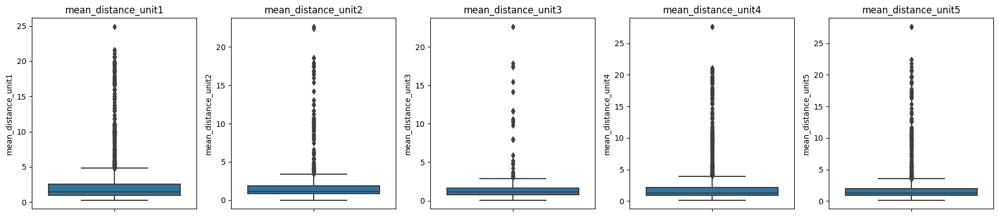

In [40]:
###############################################################
#box plot of mean trip_distance
#all RatecodeID
###############################################################
target_data=X_dummy_val
cols_list=['mean_distance_unit1',
       'mean_distance_unit2', 'mean_distance_unit3', 'mean_distance_unit4',
       'mean_distance_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

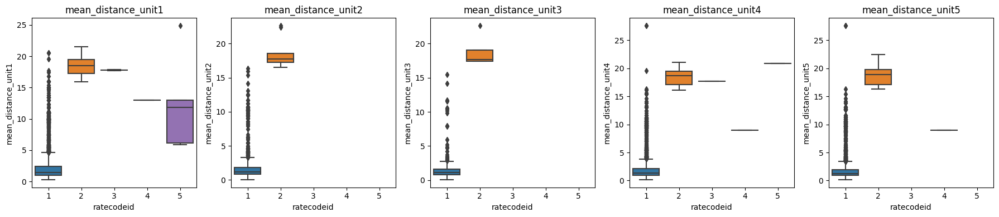

In [41]:
###############################################################
#box plot of mean trip_distance by RatecodeID
#all RatecodeID
###############################################################
target_data=X_dummy_val
cols_list=['mean_distance_unit1',
       'mean_distance_unit2', 'mean_distance_unit3', 'mean_distance_unit4',
       'mean_distance_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,x='ratecodeid',ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

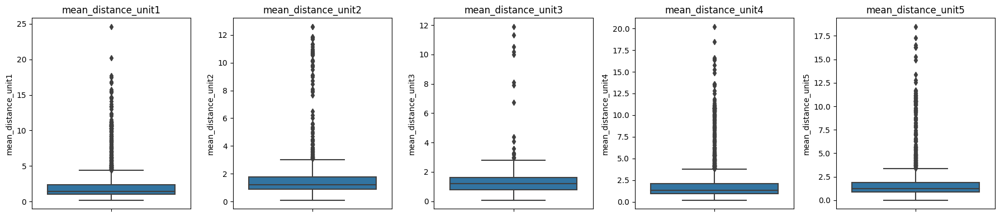

In [42]:
###############################################################
#box plot of mean trip_distance
#RatecodeID=1 or 3
###############################################################
target_data=X_dummyB_val
cols_list=['mean_distance_unit1',
       'mean_distance_unit2', 'mean_distance_unit3', 'mean_distance_unit4',
       'mean_distance_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

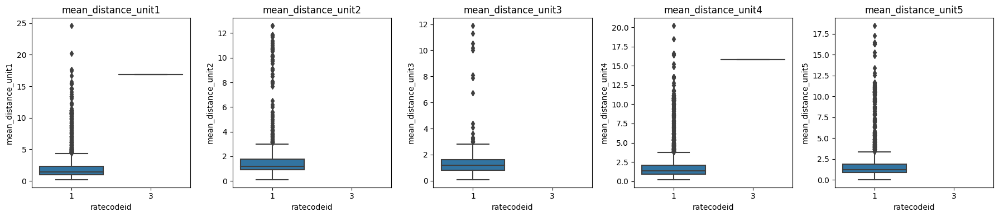

In [43]:
###############################################################
#box plot of mean trip_distance by RatecodeID
#RatecodeID=1 or 3
###############################################################
target_data=X_dummyB_val
cols_list=['mean_distance_unit1',
       'mean_distance_unit2', 'mean_distance_unit3', 'mean_distance_unit4',
       'mean_distance_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,x='ratecodeid',ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

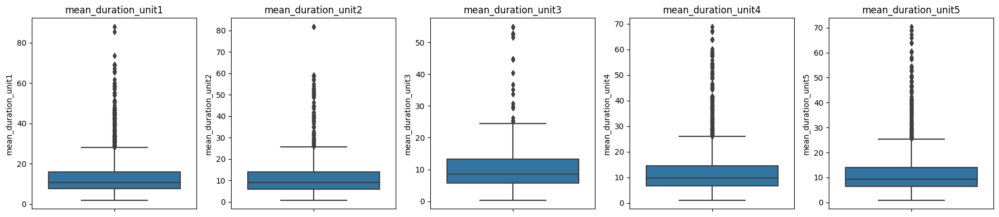

In [44]:
###############################################################
#box plot of mean trip_distance
#all RatecodeID
###############################################################
target_data=X_dummy_val
cols_list=['mean_duration_unit1', 'mean_duration_unit2',
       'mean_duration_unit3', 'mean_duration_unit4', 'mean_duration_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

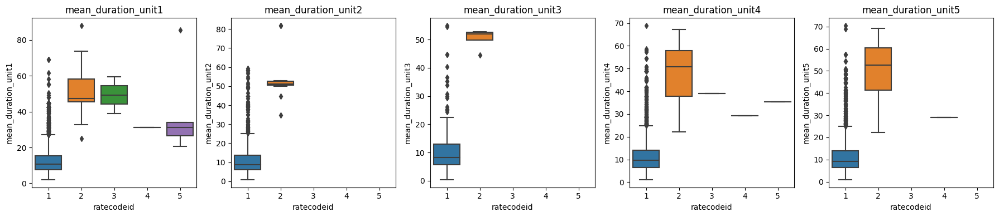

In [45]:
###############################################################
#box plot of mean trip_distance by RatecodeID
#all RatecodeID
###############################################################
target_data=X_dummy_val
cols_list=['mean_duration_unit1', 'mean_duration_unit2',
       'mean_duration_unit3', 'mean_duration_unit4', 'mean_duration_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,x='ratecodeid',ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

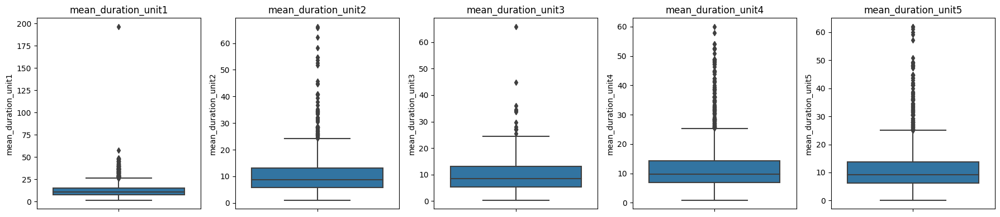

In [46]:
###############################################################
#box plot of mean trip_distance
#RatecodeID=1 or 3
###############################################################
target_data=X_dummyB_val
cols_list=['mean_duration_unit1', 'mean_duration_unit2',
       'mean_duration_unit3', 'mean_duration_unit4', 'mean_duration_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

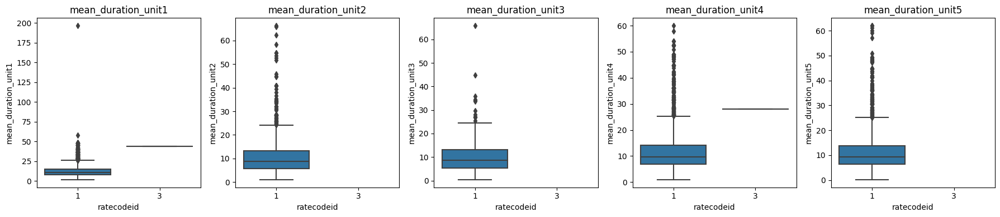

In [47]:
###############################################################
#box plot of mean trip_distance by RatecodeID
#RatecodeID=1 or 3
###############################################################
target_data=X_dummyB_val
cols_list=['mean_duration_unit1', 'mean_duration_unit2',
       'mean_duration_unit3', 'mean_duration_unit4', 'mean_duration_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,x='ratecodeid',ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

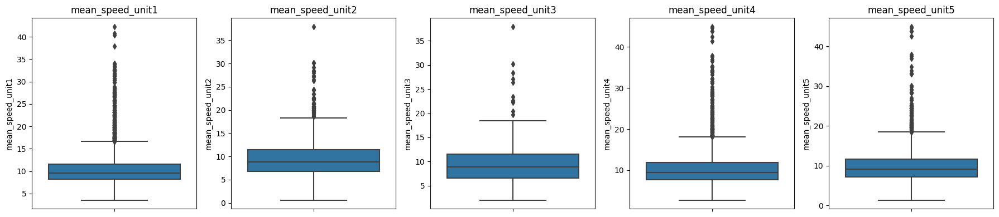

In [48]:
###############################################################
#box plot of mean trip_distance
#all RatecodeID
###############################################################
target_data=X_dummy_val
cols_list=['mean_speed_unit1', 'mean_speed_unit2', 'mean_speed_unit3',
       'mean_speed_unit4', 'mean_speed_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

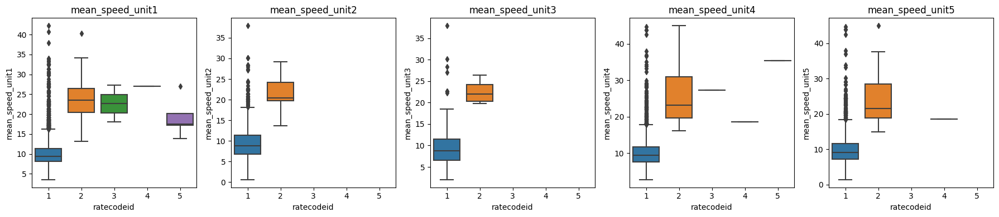

In [49]:
###############################################################
#box plot of mean trip_distance by RatecodeID
#all RatecodeID
###############################################################
target_data=X_dummy_val
cols_list=['mean_speed_unit1', 'mean_speed_unit2', 'mean_speed_unit3',
       'mean_speed_unit4', 'mean_speed_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,x='ratecodeid',ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

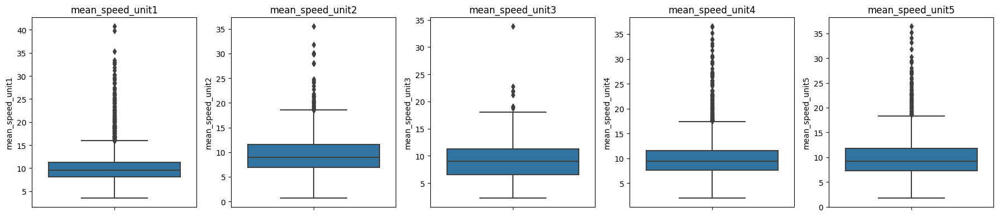

In [50]:
###############################################################
#box plot of mean trip_distance
#RatecodeID=1 or 3
###############################################################
target_data=X_dummyB_val
cols_list=['mean_speed_unit1', 'mean_speed_unit2', 'mean_speed_unit3',
       'mean_speed_unit4', 'mean_speed_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

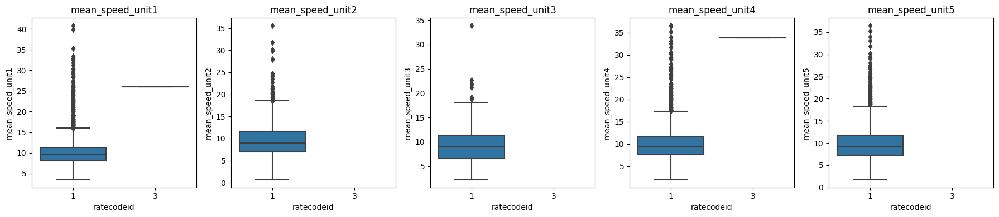

In [51]:
###############################################################
#box plot of mean trip_distance by RatecodeID
#RatecodeID=1 or 3
###############################################################
target_data=X_dummyB_val
cols_list=['mean_speed_unit1', 'mean_speed_unit2', 'mean_speed_unit3',
       'mean_speed_unit4', 'mean_speed_unit5']
fig,axs=plt.subplots(1,5,figsize=(18,4))

for col,ax in zip(cols_list,axs.ravel()):
    sns.boxplot(data=target_data, y=col,x='ratecodeid',ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show()

### Standardize the data

* [feature-scaling](https://mkang32.github.io/python/2020/12/27/feature-scaling.html#why)

In [52]:
X_dummy_train.head()

,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Nassau_or_Westchester,RatecodeID_Negotiated_fare,RatecodeID_Newark,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5
6347,2.00,10.900,11.009174,0,0,1,1,261_232,261_232_23,261_232_Monday_23,261_232_nighttime,261_232_0_nighttime,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,2.075000,2.0000,2.00,2.075000,2.000000,11.141500,10.900000,10.900,11.141500,10.900000,11.170766,11.009174,11.009174,11.170766,11.009174
8876,0.70,2.833,14.823529,1,0,0,1,237_236,237_236_13,237_236_Saturday_13,237_236_daytime,237_236_1_daytime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.053117,0.9625,0.88,0.963947,1.038000,6.871662,7.900000,5.275,7.542526,4.738300,10.677032,8.028721,11.532715,8.867039,14.530911
279,1.16,8.550,8.140351,1,0,1,1,164_161,164_161_21,164_161_Sunday_21,164_161_nighttime,164_161_1_nighttime,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1.048000,1.1600,1.16,1.282500,1.110000,9.502450,8.550000,8.550,8.408250,8.744333,8.278451,8.140351,8.140351,10.557092,9.211258
18331,2.10,12.367,10.188679,0,1,0,1,79_233,79_233_9,79_233_Tuesday_9,79_233_am_rush,79_233_0_am_rush,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1.944000,2.1000,2.10,2.100000,2.100000,11.023400,12.367000,12.367,12.367000,12.367000,11.381738,10.188679,10.188679,10.188679,10.188679
6326,2.13,12.417,10.292617,0,0,1,1,237_162,237_162_20,237_162_Wednesday_20,237_162_nighttime,237_162_0_nighttime,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1.124000,1.3100,2.13,1.231667,1.231667,8.751489,10.594667,12.417,7.883500,7.883500,8.589126,7.950708,10.292617,10.414092,10.414092


In [53]:
# Standardize the X variables
from sklearn.preprocessing import StandardScaler

#columns needs to standardize
transform_cols =['mean_distance_unit1','mean_duration_unit1','mean_speed_unit1',
                'mean_distance_unit2','mean_duration_unit2','mean_speed_unit2',
                'mean_distance_unit3','mean_duration_unit3','mean_speed_unit3',
                'mean_distance_unit4','mean_duration_unit4','mean_speed_unit4',
                'mean_distance_unit5','mean_duration_unit5','mean_speed_unit5',]
#standardized column names, add '_scaled' to original column name
scaled_cols=[x + '_scaled' for x in transform_cols]

##########################################
#all RatecodeID
##########################################
# Create a StandardScaler object
scaler = StandardScaler()

# Fit the scaler to the data and transform it
scaler.fit(X_dummy_train[transform_cols])
X_dummy_train_scaled_continuous =scaler.transform(X_dummy_train[transform_cols])

# Convert the scaled data back to a dataframe
X_dummy_train_scaled_continuous_df = pd.DataFrame(X_dummy_train_scaled_continuous, columns=transform_cols)
X_dummy_train_scaled=X_dummy_train.copy()
X_dummy_train_scaled.reset_index(drop=True, inplace=True)

X_dummy_train_scaled[scaled_cols]=X_dummy_train_scaled_continuous_df[transform_cols]

display(X_dummy_train_scaled.head())

##########################################
#RatecodeID=1 or 3
##########################################
# Create a StandardScaler object
scalerB = StandardScaler()

# Fit the scaler to the data and transform it
scalerB.fit(X_dummyB_train[transform_cols])
X_dummyB_train_scaled_continuous =scalerB.transform(X_dummyB_train[transform_cols])

# Convert the scaled data back to a dataframe
X_dummyB_train_scaled_continuous_df = pd.DataFrame(X_dummyB_train_scaled_continuous, columns=transform_cols)
X_dummyB_train_scaled=X_dummyB_train.copy()
X_dummyB_train_scaled.reset_index(drop=True, inplace=True)

X_dummyB_train_scaled[scaled_cols]=X_dummyB_train_scaled_continuous_df[transform_cols]

display(X_dummyB_train_scaled.head())

,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Nassau_or_Westchester,RatecodeID_Negotiated_fare,RatecodeID_Newark,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled
0,2.00,10.900,11.009174,0,0,1,1,261_232,261_232_23,261_232_Monday_23,261_232_nighttime,261_232_0_nighttime,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,2.075000,2.0000,2.00,2.075000,2.000000,11.141500,10.900000,10.900,11.141500,10.900000,11.170766,11.009174,11.009174,11.170766,11.009174,-0.228163,-0.307587,-0.013454,-0.246513,-0.295825,-0.039324,-0.245847,-0.291664,-0.038363,-0.226914,-0.289957,-0.012219,-0.247413,-0.303445,-0.040646
1,0.70,2.833,14.823529,1,0,0,1,237_236,237_236_13,237_236_Saturday_13,237_236_daytime,237_236_1_daytime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.053117,0.9625,0.88,0.963947,1.038000,6.871662,7.900000,5.275,7.542526,4.738300,10.677032,8.028721,11.532715,8.867039,14.530911,-0.514778,-0.719305,-0.113572,-0.534372,-0.554456,-0.553519,-0.555757,-0.769779,0.049751,-0.536832,-0.617096,-0.436506,-0.515298,-0.848333,0.587355
2,1.16,8.550,8.140351,1,0,1,1,164_161,164_161_21,164_161_Sunday_21,164_161_nighttime,164_161_1_nighttime,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1.048000,1.1600,1.16,1.282500,1.110000,9.502450,8.550000,8.550,8.408250,8.744333,8.278451,8.140351,8.140351,10.557092,9.211258,-0.516213,-0.465632,-0.599952,-0.479575,-0.498419,-0.534260,-0.478279,-0.491410,-0.521195,-0.447974,-0.538404,-0.125242,-0.495249,-0.494074,-0.361254
3,2.10,12.367,10.188679,0,1,0,1,79_233,79_233_9,79_233_Tuesday_9,79_233_am_rush,79_233_0_am_rush,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1.944000,2.1000,2.10,2.100000,2.100000,11.023400,12.367000,12.367,12.367000,12.367000,11.381738,10.188679,10.188679,10.188679,10.188679,-0.264906,-0.318975,0.029327,-0.218768,-0.169354,-0.180878,-0.218177,-0.166972,-0.176455,-0.219940,-0.178562,-0.193094,-0.219566,-0.173716,-0.186958
4,2.13,12.417,10.292617,0,0,1,1,237_162,237_162_20,237_162_Wednesday_20,237_162_nighttime,237_162_0_nighttime,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1.124000,1.3100,2.13,1.231667,1.231667,8.751489,10.594667,12.417,7.883500,7.883500,8.589126,7.950708,10.292617,10.414092,10.414092,-0.494897,-0.538043,-0.536954,-0.437957,-0.322148,-0.566978,-0.209876,-0.162722,-0.158962,-0.462154,-0.586102,-0.151579,-0.461369,-0.570198,-0.146762


,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled
0,5.79,46.983,7.394111,1,0,0,1,234_112,234_112_19,234_112_Sunday_19,234_112_pm_rush,234_112_1_pm_rush,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5.790000,5.790,5.79,5.790000,5.79,46.983000,46.98300,46.983,46.9830,46.983000,7.394111,7.394111,7.394111,7.394111,7.394111,1.151044,3.614279,-0.799245,1.134594,3.206001,-0.670763,1.131802,3.154118,-0.650554,1.143717,3.354064,-0.723411,1.140676,3.295284,-0.697377
1,1.10,3.583,18.418605,1,0,0,1,229_140,229_140_10,229_140_Saturday_10,229_140_daytime,229_140_1_daytime,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.025833,1.100,1.10,0.990000,1.10,5.697167,3.58300,3.583,6.8598,3.583000,12.493078,18.418605,18.418605,9.762777,18.418605,-0.566179,-0.874331,0.323592,-0.531736,-0.979453,1.366665,-0.530428,-0.963603,1.325490,-0.575408,-0.694081,-0.251301,-0.534587,-1.006730,1.420890
2,0.70,6.900,6.086957,0,0,1,1,50_100,50_100_21,50_100_Wednesday_21,50_100_nighttime,50_100_0_nighttime,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1.201667,0.700,0.70,0.700000,0.70,10.880500,6.90000,6.900,6.9000,6.900000,6.813140,6.086957,6.086957,6.086957,6.086957,-0.502800,-0.310798,-0.927180,-0.673854,-0.659565,-0.912337,-0.672196,-0.648891,-0.884850,-0.679272,-0.690026,-0.983946,-0.677466,-0.677933,-0.948536
3,2.00,16.900,7.100592,0,0,0,1,143_161,143_161_11,143_161_Friday_11,143_161_daytime,143_161_0_daytime,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.798333,1.625,2.00,1.700000,1.70,15.447167,17.25825,16.900,16.4900,20.222000,8.043221,6.472129,7.100592,6.966523,5.282892,-0.287735,0.185692,-0.656306,-0.345207,0.339375,-0.841153,-0.211450,0.299893,-0.703165,-0.321121,0.277537,-0.808636,-0.320268,0.642607,-1.103031
4,0.73,3.567,12.280374,1,0,0,1,90_234,90_234_10,90_234_Saturday_10,90_234_daytime,90_234_1_daytime,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0.608000,0.730,0.73,0.578182,0.64,5.183300,3.56700,3.567,5.4470,4.505667,7.751064,12.280374,12.280374,6.796980,8.873815,-0.716785,-0.930199,-0.720641,-0.663195,-0.980996,0.232263,-0.661563,-0.965121,0.225266,-0.722902,-0.836623,-0.842428,-0.698898,-0.915270,-0.413064


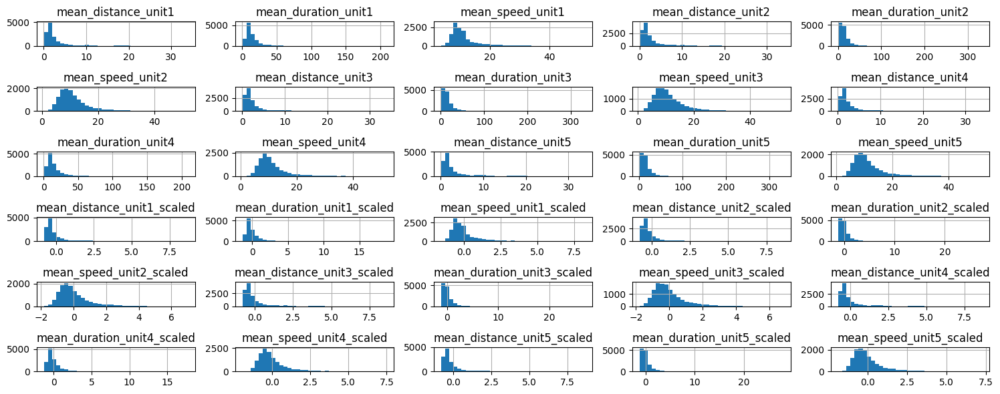

In [54]:
##########################################
#show hist after standardization
#all RatecodeID
##########################################
X_dummy_train_scaled[transform_cols+scaled_cols].hist(bins=35, figsize=(15, 6))
plt.tight_layout()
plt.show()

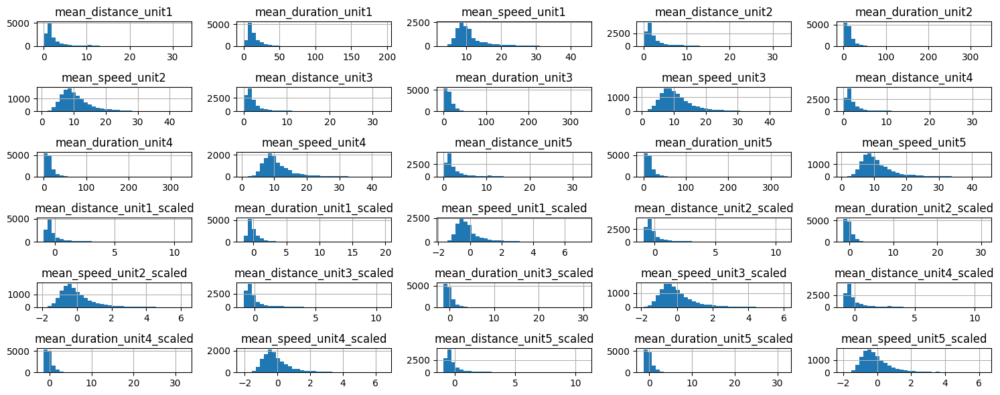

In [55]:
##########################################
#show hist after standardization
#RatecodeID=1 or 3
##########################################
X_dummyB_train_scaled[transform_cols+scaled_cols].hist(bins=35, figsize=(15, 6))
plt.tight_layout()
plt.show()

In [56]:
##########################################
#all RatecodeID
##########################################
y_dummy_train_noindex=y_dummy_train.copy()
y_dummy_train_noindex=y_dummy_train_noindex.reset_index(drop=True)
sample_train = pd.merge(X_dummy_train_scaled, y_dummy_train_noindex, how="left",left_index=True, right_index=True)
display(sample_train.head())

##########################################
#RatecodeID=1 or 3
##########################################
y_dummyB_train_noindex=y_dummyB_train.copy()
y_dummyB_train_noindex=y_dummyB_train_noindex.reset_index(drop=True)
sampleB_train = pd.merge(X_dummyB_train_scaled, y_dummyB_train_noindex, how="left",left_index=True, right_index=True)
display(sampleB_train.head())


,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Nassau_or_Westchester,RatecodeID_Negotiated_fare,RatecodeID_Newark,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled,fare_amount
0,2.00,10.900,11.009174,0,0,1,1,261_232,261_232_23,261_232_Monday_23,261_232_nighttime,261_232_0_nighttime,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,2.075000,2.0000,2.00,2.075000,2.000000,11.141500,10.900000,10.900,11.141500,10.900000,11.170766,11.009174,11.009174,11.170766,11.009174,-0.228163,-0.307587,-0.013454,-0.246513,-0.295825,-0.039324,-0.245847,-0.291664,-0.038363,-0.226914,-0.289957,-0.012219,-0.247413,-0.303445,-0.040646,10.0
1,0.70,2.833,14.823529,1,0,0,1,237_236,237_236_13,237_236_Saturday_13,237_236_daytime,237_236_1_daytime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.053117,0.9625,0.88,0.963947,1.038000,6.871662,7.900000,5.275,7.542526,4.738300,10.677032,8.028721,11.532715,8.867039,14.530911,-0.514778,-0.719305,-0.113572,-0.534372,-0.554456,-0.553519,-0.555757,-0.769779,0.049751,-0.536832,-0.617096,-0.436506,-0.515298,-0.848333,0.587355,4.5
2,1.16,8.550,8.140351,1,0,1,1,164_161,164_161_21,164_161_Sunday_21,164_161_nighttime,164_161_1_nighttime,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1.048000,1.1600,1.16,1.282500,1.110000,9.502450,8.550000,8.550,8.408250,8.744333,8.278451,8.140351,8.140351,10.557092,9.211258,-0.516213,-0.465632,-0.599952,-0.479575,-0.498419,-0.534260,-0.478279,-0.491410,-0.521195,-0.447974,-0.538404,-0.125242,-0.495249,-0.494074,-0.361254,7.5
3,2.10,12.367,10.188679,0,1,0,1,79_233,79_233_9,79_233_Tuesday_9,79_233_am_rush,79_233_0_am_rush,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1.944000,2.1000,2.10,2.100000,2.100000,11.023400,12.367000,12.367,12.367000,12.367000,11.381738,10.188679,10.188679,10.188679,10.188679,-0.264906,-0.318975,0.029327,-0.218768,-0.169354,-0.180878,-0.218177,-0.166972,-0.176455,-0.219940,-0.178562,-0.193094,-0.219566,-0.173716,-0.186958,10.5
4,2.13,12.417,10.292617,0,0,1,1,237_162,237_162_20,237_162_Wednesday_20,237_162_nighttime,237_162_0_nighttime,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1.124000,1.3100,2.13,1.231667,1.231667,8.751489,10.594667,12.417,7.883500,7.883500,8.589126,7.950708,10.292617,10.414092,10.414092,-0.494897,-0.538043,-0.536954,-0.437957,-0.322148,-0.566978,-0.209876,-0.162722,-0.158962,-0.462154,-0.586102,-0.151579,-0.461369,-0.570198,-0.146762,9.0


,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled,fare_amount
0,5.79,46.983,7.394111,1,0,0,1,234_112,234_112_19,234_112_Sunday_19,234_112_pm_rush,234_112_1_pm_rush,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,5.790000,5.790,5.79,5.790000,5.79,46.983000,46.98300,46.983,46.9830,46.983000,7.394111,7.394111,7.394111,7.394111,7.394111,1.151044,3.614279,-0.799245,1.134594,3.206001,-0.670763,1.131802,3.154118,-0.650554,1.143717,3.354064,-0.723411,1.140676,3.295284,-0.697377,32.5
1,1.10,3.583,18.418605,1,0,0,1,229_140,229_140_10,229_140_Saturday_10,229_140_daytime,229_140_1_daytime,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.025833,1.100,1.10,0.990000,1.10,5.697167,3.58300,3.583,6.8598,3.583000,12.493078,18.418605,18.418605,9.762777,18.418605,-0.566179,-0.874331,0.323592,-0.531736,-0.979453,1.366665,-0.530428,-0.963603,1.325490,-0.575408,-0.694081,-0.251301,-0.534587,-1.006730,1.420890,5.5
2,0.70,6.900,6.086957,0,0,1,1,50_100,50_100_21,50_100_Wednesday_21,50_100_nighttime,50_100_0_nighttime,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1.201667,0.700,0.70,0.700000,0.70,10.880500,6.90000,6.900,6.9000,6.900000,6.813140,6.086957,6.086957,6.086957,6.086957,-0.502800,-0.310798,-0.927180,-0.673854,-0.659565,-0.912337,-0.672196,-0.648891,-0.884850,-0.679272,-0.690026,-0.983946,-0.677466,-0.677933,-0.948536,6.5
3,2.00,16.900,7.100592,0,0,0,1,143_161,143_161_11,143_161_Friday_11,143_161_daytime,143_161_0_daytime,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.798333,1.625,2.00,1.700000,1.70,15.447167,17.25825,16.900,16.4900,20.222000,8.043221,6.472129,7.100592,6.966523,5.282892,-0.287735,0.185692,-0.656306,-0.345207,0.339375,-0.841153,-0.211450,0.299893,-0.703165,-0.321121,0.277537,-0.808636,-0.320268,0.642607,-1.103031,12.0
4,0.73,3.567,12.280374,1,0,0,1,90_234,90_234_10,90_234_Saturday_10,90_234_daytime,90_234_1_daytime,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0.608000,0.730,0.73,0.578182,0.64,5.183300,3.56700,3.567,5.4470,4.505667,7.751064,12.280374,12.280374,6.796980,8.873815,-0.716785,-0.930199,-0.720641,-0.663195,-0.980996,0.232263,-0.661563,-0.965121,0.225266,-0.722902,-0.836623,-0.842428,-0.698898,-0.915270,-0.413064,4.5


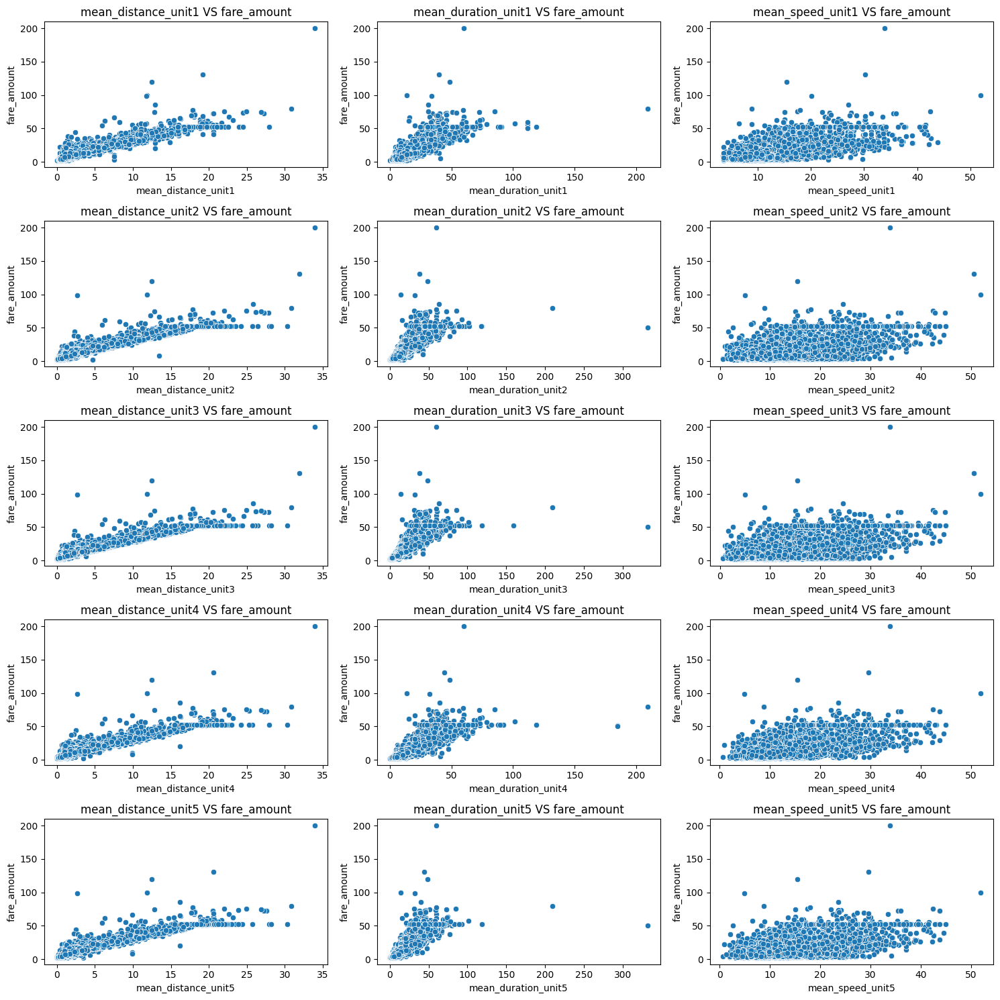

In [57]:
####################################################
#visualize the relationship between mean_duration,mean_distance,mean_speed  and fare_amount.
#all RatecodeID
####################################################
independent_var_list =['mean_distance_unit1','mean_duration_unit1','mean_speed_unit1',
                'mean_distance_unit2','mean_duration_unit2','mean_speed_unit2',
                'mean_distance_unit3','mean_duration_unit3','mean_speed_unit3',
                'mean_distance_unit4','mean_duration_unit4','mean_speed_unit4',
                'mean_distance_unit5','mean_duration_unit5','mean_speed_unit5',]
colNm=3
rowNum=np.ceil(len(independent_var_list)/colNm).astype(int)

fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*5,rowNum*3))
for var,ax in zip(independent_var_list,axs.ravel()):
    sns.scatterplot(data=sample_train, x=var, y="fare_amount",ax=ax)
    ax.set_title(f"{var} VS fare_amount")

plt.tight_layout()
plt.show()

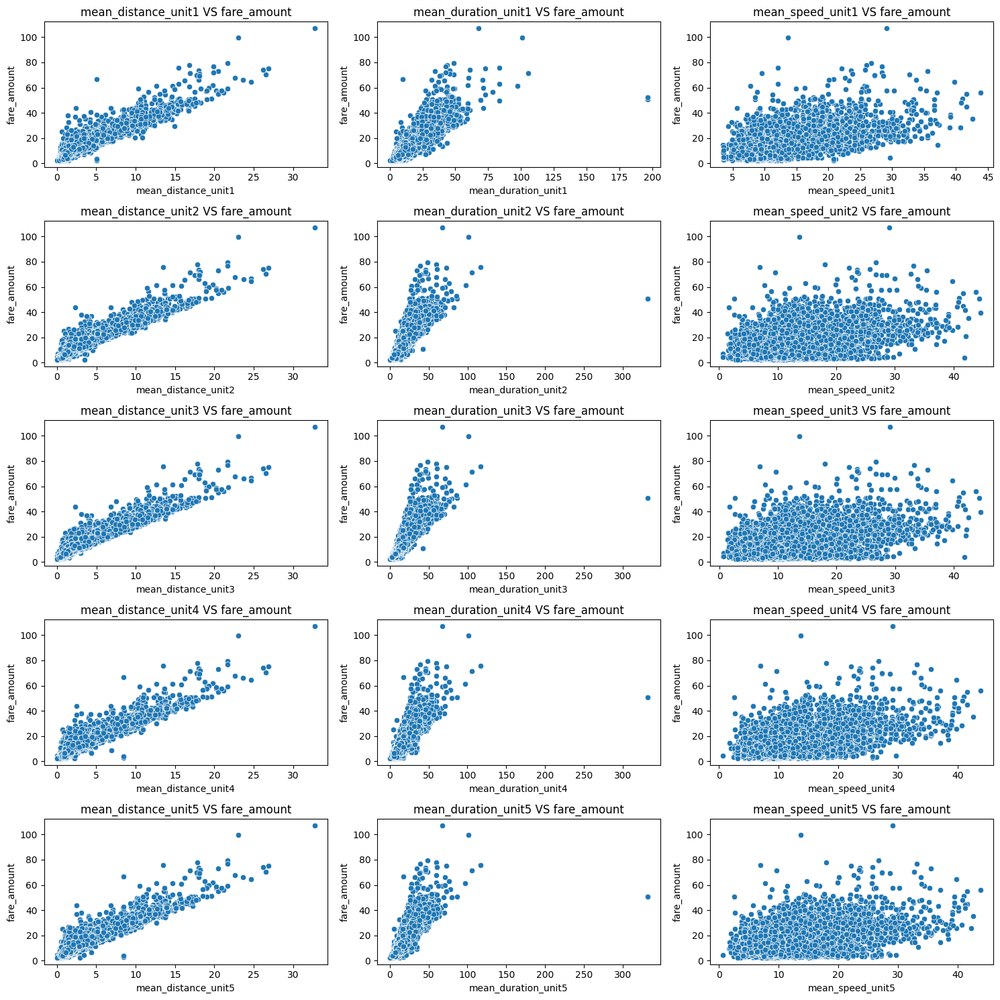

In [58]:
####################################################
#visualize the relationship between mean_duration,mean_distance,mean_speed  and fare_amount.
#RatecodeID=1 or 3
####################################################
independent_var_list =['mean_distance_unit1','mean_duration_unit1','mean_speed_unit1',
                'mean_distance_unit2','mean_duration_unit2','mean_speed_unit2',
                'mean_distance_unit3','mean_duration_unit3','mean_speed_unit3',
                'mean_distance_unit4','mean_duration_unit4','mean_speed_unit4',
                'mean_distance_unit5','mean_duration_unit5','mean_speed_unit5',]
colNm=3
rowNum=np.ceil(len(independent_var_list)/colNm).astype(int)

fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*5,rowNum*3))
for var,ax in zip(independent_var_list,axs.ravel()):
    sns.scatterplot(data=sampleB_train, x=var, y="fare_amount",ax=ax)
    ax.set_title(f"{var} VS fare_amount")

plt.tight_layout()
plt.show()

In [59]:
##########################################
#all RatecodeID
##########################################
#create log-transformed data
sample_train['fare_amount_log']=np.log(sample_train['fare_amount'])
#create square root-transformed data
sample_train['fare_amount_sqrt']=np.sqrt(sample_train['fare_amount'])
#create square-transformed data
sample_train['fare_amount_square']=np.square(sample_train['fare_amount'])

##########################################
#RatecodeID=1 or 3
##########################################
#create log-transformed data
sampleB_train['fare_amount_log']=np.log(sampleB_train['fare_amount'])
#create square root-transformed data
sampleB_train['fare_amount_sqrt']=np.sqrt(sampleB_train['fare_amount'])
#create square-transformed data
sampleB_train['fare_amount_square']=np.square(sampleB_train['fare_amount'])

In [60]:
##############################################
#Identify correlations
#all RatecodeID
##############################################
target_col=['fare_amount', 'fare_amount_log','fare_amount_sqrt','fare_amount_square',
            'mean_distance_unit1','mean_duration_unit1','mean_speed_unit1',
            'mean_distance_unit2','mean_duration_unit2','mean_speed_unit2',
            'mean_distance_unit3','mean_duration_unit3','mean_speed_unit3',
            'mean_distance_unit4','mean_duration_unit4','mean_speed_unit4',
            'mean_distance_unit5','mean_duration_unit5','mean_speed_unit5',
           ]
df_corr_all=sample_train[target_col].corr(method='spearman')
df_corr_all

,fare_amount,fare_amount_log,fare_amount_sqrt,fare_amount_square,mean_distance_unit1,mean_duration_unit1,mean_speed_unit1,mean_distance_unit2,mean_duration_unit2,mean_speed_unit2,mean_distance_unit3,mean_duration_unit3,mean_speed_unit3,mean_distance_unit4,mean_duration_unit4,mean_speed_unit4,mean_distance_unit5,mean_duration_unit5,mean_speed_unit5
fare_amount,1.000000,1.000000,1.000000,1.000000,0.868180,0.867606,0.430394,0.911859,0.941046,0.247736,0.925653,0.963544,0.225279,0.884216,0.897539,0.311553,0.893733,0.913265,0.285239
fare_amount_log,1.000000,1.000000,1.000000,1.000000,0.868180,0.867606,0.430394,0.911859,0.941046,0.247736,0.925653,0.963544,0.225279,0.884216,0.897539,0.311553,0.893733,0.913265,0.285239
fare_amount_sqrt,1.000000,1.000000,1.000000,1.000000,0.868180,0.867606,0.430394,0.911859,0.941046,0.247736,0.925653,0.963544,0.225279,0.884216,0.897539,0.311553,0.893733,0.913265,0.285239
fare_amount_square,1.000000,1.000000,1.000000,1.000000,0.868180,0.867606,0.430394,0.911859,0.941046,0.247736,0.925653,0.963544,0.225279,0.884216,0.897539,0.311553,0.893733,0.913265,0.285239
mean_distance_unit1,0.868180,0.868180,0.868180,0.868180,1.000000,0.905625,0.608641,0.947206,0.796622,0.500299,0.935530,0.780583,0.490973,0.974458,0.841659,0.532701,0.963787,0.822663,0.519134
mean_duration_unit1,0.867606,0.867606,0.867606,0.867606,0.905625,1.000000,0.287592,0.861311,0.862846,0.267571,0.851290,0.842341,0.269158,0.884799,0.919849,0.272358,0.875646,0.895128,0.273564
mean_speed_unit1,0.430394,0.430394,0.430394,0.430394,0.608641,0.287592,1.000000,0.591257,0.282501,0.739010,0.587514,0.284129,0.709736,0.599561,0.281837,0.820349,0.595954,0.283263,0.777599
mean_distance_unit2,0.911859,0.911859,0.911859,0.911859,0.947206,0.861311,0.591257,1.000000,0.843012,0.509618,0.984088,0.823450,0.499788,0.968447,0.836245,0.531201,0.972112,0.829645,0.522210
mean_duration_unit2,0.941046,0.941046,0.941046,0.941046,0.796622,0.862846,0.282501,0.843012,1.000000,0.042493,0.830205,0.969509,0.054684,0.813263,0.930587,0.128798,0.817336,0.939100,0.109372
mean_speed_unit2,0.247736,0.247736,0.247736,0.247736,0.500299,0.267571,0.739010,0.509618,0.042493,1.000000,0.505953,0.051314,0.953236,0.506783,0.131214,0.886936,0.506532,0.105941,0.903358


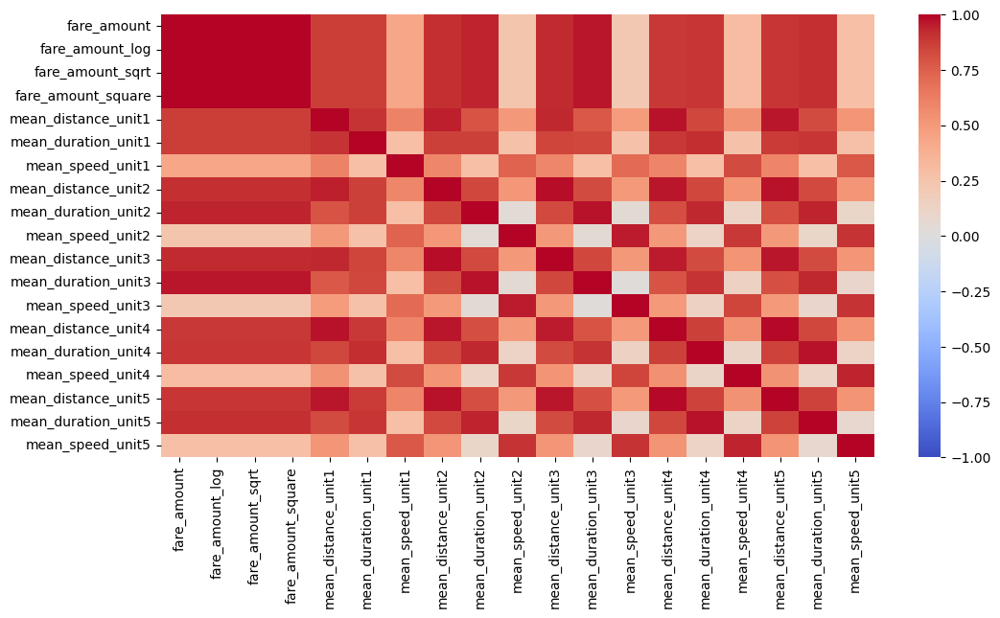

In [61]:
##############################################
# Create correlation heatmap
# all RatecodeID
##############################################
plt.figure(figsize=(12,6))
sns.heatmap(df_corr_all, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()

In [62]:
##############################################
#Identify correlations
#RatecodeID=1 or 3
##############################################
target_col=['fare_amount', 'fare_amount_log','fare_amount_sqrt','fare_amount_square',
            'mean_distance_unit1','mean_duration_unit1','mean_speed_unit1',
            'mean_distance_unit2','mean_duration_unit2','mean_speed_unit2',
            'mean_distance_unit3','mean_duration_unit3','mean_speed_unit3',
            'mean_distance_unit4','mean_duration_unit4','mean_speed_unit4',
            'mean_distance_unit5','mean_duration_unit5','mean_speed_unit5',
           ]
df_corrB_all=sampleB_train[target_col].corr(method='spearman')
df_corrB_all

,fare_amount,fare_amount_log,fare_amount_sqrt,fare_amount_square,mean_distance_unit1,mean_duration_unit1,mean_speed_unit1,mean_distance_unit2,mean_duration_unit2,mean_speed_unit2,mean_distance_unit3,mean_duration_unit3,mean_speed_unit3,mean_distance_unit4,mean_duration_unit4,mean_speed_unit4,mean_distance_unit5,mean_duration_unit5,mean_speed_unit5
fare_amount,1.000000,1.000000,1.000000,1.000000,0.861243,0.861761,0.383281,0.908106,0.937610,0.202228,0.922659,0.961679,0.175316,0.878368,0.892257,0.269206,0.889152,0.909056,0.238185
fare_amount_log,1.000000,1.000000,1.000000,1.000000,0.861243,0.861761,0.383281,0.908106,0.937610,0.202228,0.922659,0.961679,0.175316,0.878368,0.892257,0.269206,0.889152,0.909056,0.238185
fare_amount_sqrt,1.000000,1.000000,1.000000,1.000000,0.861243,0.861761,0.383281,0.908106,0.937610,0.202228,0.922659,0.961679,0.175316,0.878368,0.892257,0.269206,0.889152,0.909056,0.238185
fare_amount_square,1.000000,1.000000,1.000000,1.000000,0.861243,0.861761,0.383281,0.908106,0.937610,0.202228,0.922659,0.961679,0.175316,0.878368,0.892257,0.269206,0.889152,0.909056,0.238185
mean_distance_unit1,0.861243,0.861243,0.861243,0.861243,1.000000,0.902160,0.574898,0.944770,0.788255,0.468075,0.931706,0.769636,0.458067,0.973921,0.837711,0.502571,0.962730,0.815273,0.487853
mean_duration_unit1,0.861761,0.861761,0.861761,0.861761,0.902160,1.000000,0.231689,0.856606,0.858863,0.219173,0.845186,0.835673,0.222123,0.880974,0.920006,0.222846,0.870995,0.891952,0.224118
mean_speed_unit1,0.383281,0.383281,0.383281,0.383281,0.574898,0.231689,1.000000,0.554815,0.228186,0.734528,0.550705,0.229634,0.701163,0.565168,0.227814,0.820000,0.561831,0.228985,0.775530
mean_distance_unit2,0.908106,0.908106,0.908106,0.908106,0.944770,0.856606,0.554815,1.000000,0.837782,0.474925,0.983198,0.815860,0.464205,0.967009,0.831977,0.498349,0.970544,0.823510,0.486289
mean_duration_unit2,0.937610,0.937610,0.937610,0.937610,0.788255,0.858863,0.228186,0.837782,1.000000,-0.010806,0.823995,0.966838,0.002660,0.806040,0.926555,0.080503,0.810450,0.935722,0.057023
mean_speed_unit2,0.202228,0.202228,0.202228,0.202228,0.468075,0.219173,0.734528,0.474925,-0.010806,1.000000,0.471461,-0.001343,0.947681,0.473860,0.083972,0.881617,0.472133,0.055791,0.898164


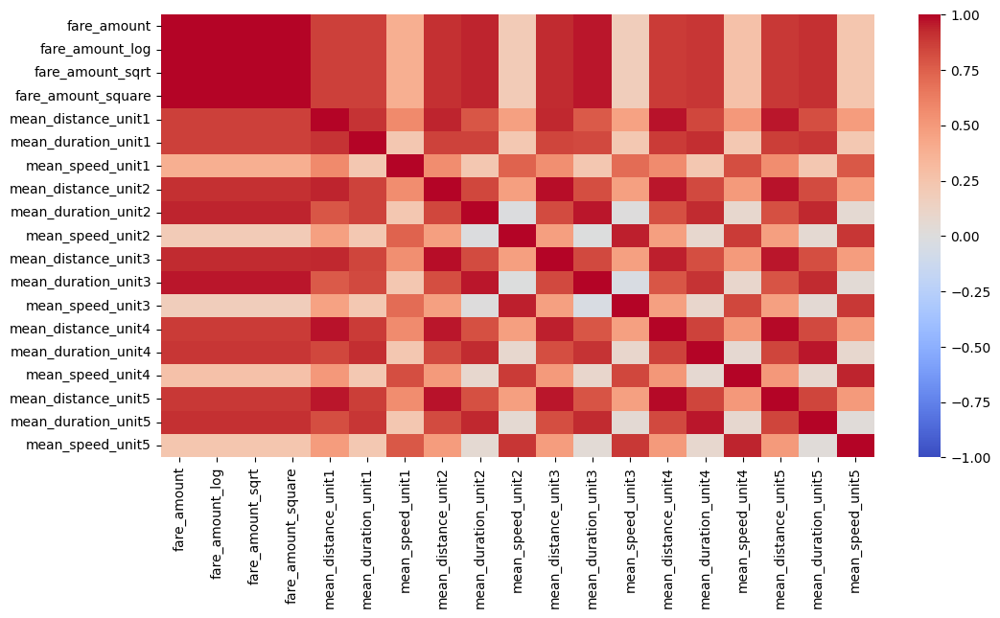

In [63]:
##############################################
# Create correlation heatmap
# RatecodeID=1 or 3
##############################################
plt.figure(figsize=(12,6))
sns.heatmap(df_corrB_all, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()

In [64]:
#model_list
############################################
# formula
############################################
ols_formula_list=[
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled  + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_speed_unit1_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount_log ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount_sqrt ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount_square ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled  + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_speed_unit2_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled  + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_speed_unit3_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled  + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_speed_unit4_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday  + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled + rush_hour + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled  + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_speed_unit5_scaled + RatecodeID_Nassau_or_Westchester + RatecodeID_Negotiated_fare + RatecodeID_Newark + RatecodeID_Standard_rate",
]

ols_formulaB_list=[
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday  +  RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled  + holiday  + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled  + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_speed_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit1_scaled + mean_speed_unit1_scaled + RatecodeID_Standard_rate",
 "fare_amount_log ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount_sqrt ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount_square ~ mean_distance_unit1_scaled + mean_duration_unit1_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday  +  RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled  + holiday  + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled  + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_speed_unit2_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_duration_unit2_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit2_scaled + mean_speed_unit2_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday  +  RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled  + holiday  + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled  + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_speed_unit3_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_duration_unit3_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit3_scaled + mean_speed_unit3_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday  +  RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled  + holiday  + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled  + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_speed_unit4_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_duration_unit4_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit4_scaled + mean_speed_unit4_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday  +  RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday + RatecodeID_Standard_rate + PU_hour_1 +PU_hour_2 +PU_hour_3 +PU_hour_4 +PU_hour_5 +PU_hour_6 +PU_hour_7 +PU_hour_8 +PU_hour_9 +PU_hour_10 +PU_hour_11 +PU_hour_12 +PU_hour_13 +PU_hour_14 +PU_hour_15 +PU_hour_16 +PU_hour_17 +PU_hour_18 +PU_hour_19 +PU_hour_20 +PU_hour_21 +PU_hour_22 +PU_hour_23",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled  + holiday  + RatecodeID_Standard_rate + PU_hour_class_daytime + PU_hour_class_nighttime + PU_hour_class_pm_rush",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate + PU_weekday_Monday + PU_weekday_Tuesday + PU_weekday_Wednesday + PU_weekday_Thursday + PU_weekday_Saturday + PU_weekday_Sunday",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled + rush_hour + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_duration_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled  + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_speed_unit5_scaled + holiday + nighttime + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_duration_unit5_scaled + RatecodeID_Standard_rate",
 "fare_amount ~ mean_distance_unit5_scaled + mean_speed_unit5_scaled + RatecodeID_Standard_rate",
]

#https://www.statsmodels.org/dev/_modules/statsmodels/regression/linear_model.html#RegressionResults.aic
#####################################
# calculate maximized log likelihood
#####################################
def calculate_log_likelihood(n,resid):
    nobs = float(n)
    nobs2 = nobs / 2.0
    ssr = np.sum((resid)**2)
    llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / n) - nobs2
    return llf

#####################################
# calculate AIC for regression
#####################################
def calculate_aic(n, resid, num_params):
    llf=calculate_log_likelihood(n,resid)
    aic=-2*llf+2*num_params
    return aic

#####################################
# calculate BIC for regression
#####################################
def calculate_bic(n, resid, num_params):
    llf=calculate_log_likelihood(n,resid)
    bic=-2*llf + np.log(n) * num_params
    return bic

#####################################
# calculate Adjusted R-Squared 
#####################################
def calculate_adjR2(r2,observations_num, predictor_num):
    adjusted_R2=1 - (1-r2)*(observations_num-1)/(observations_num-predictor_num)
    return adjusted_R2

In [65]:
##########################################
#all RatecodeID
##########################################
#store fit results(training data)
model_train_result_list=[]

for i in range(len(ols_formula_list)):
    # Define the OLS formula.
    
    ols_formula=ols_formula_list[i]
    ols_data =sample_train

    # Fit the model.
    model=ols(formula=ols_formula, data=ols_data)
    result=model.fit()
    model_train_result_list.append(result)

In [66]:
##########################################
#RatecodeID=1 or 3
##########################################
#store fit results(training data)
modelB_train_result_list=[]

for i in range(len(ols_formulaB_list)):
    # Define the OLS formula.
    
    ols_formula=ols_formulaB_list[i]
    ols_data =sampleB_train

    # Fit the model.
    model=ols(formula=ols_formula, data=ols_data)
    result=model.fit()
    modelB_train_result_list.append(result)

In [67]:
##########################################
#display the parameters of the models
#all RatecodeID
##########################################

col_list=[]
model_list=[]
coef_list=[]
pvalue_list=[]
gt_sig_level_list=[]
ci_list=[]
significance_level=0.05


for i in range(len(model_train_result_list)):
    result=model_train_result_list[i]
    param_list=result.params.index.to_list()
    for param in param_list:
        model_list.append(i)
        col_list.append(param)
        coef_list.append(result.params[param])
        pvalue_list.append(result.pvalues[param])
        if result.pvalues[param] >=significance_level:
            gt_sig_level_list.append("Y")
        else:
            gt_sig_level_list.append(" ")
        ci_lower=result.conf_int(alpha=0.05).loc[param][0]
        ci_upper=result.conf_int(alpha=0.05).loc[param][1]
        ci_list.append([ci_lower,ci_upper])


model_trans_corr=pd.DataFrame(data={
    "model":model_list,
    "variable":col_list,
    "coef":coef_list,
    "convidence interval": ci_list,
    "p-value":pvalue_list,
    "p-value>0.05":gt_sig_level_list,
})


model_trans_corr[model_trans_corr['p-value>0.05']=='Y']

,model,variable,coef,convidence interval,p-value,p-value>0.05
3,0,mean_speed_unit1_scaled,-0.004339,"[-0.11987521403323836, 0.11119686145409985]",0.941316,Y
10,0,PU_weekday_Tuesday,-0.144046,"[-0.31913183565555125, 0.0310391048710838]",0.106844,Y
11,0,PU_weekday_Wednesday,-0.106244,"[-0.2788026772588206, 0.06631423274114148]",0.227507,Y
12,0,PU_weekday_Thursday,0.014387,"[-0.15813408662259762, 0.18690818374661336]",0.870157,Y
13,0,PU_weekday_Saturday,0.034990,"[-0.3005922191115866, 0.3705728707618896]",0.838060,Y
...,...,...,...,...,...,...
920,63,holiday,-0.004495,"[-0.265832292447834, 0.2568430883897006]",0.973108,Y
927,63,PU_weekday_Tuesday,-0.017079,"[-0.16900569243710653, 0.13484731352027354]",0.825599,Y
928,63,PU_weekday_Wednesday,-0.054948,"[-0.20464230601199165, 0.09474648340015265]",0.471843,Y
929,63,PU_weekday_Thursday,0.015525,"[-0.1342017206627841, 0.16525169275614868]",0.838947,Y


In [68]:
model_train_result_list[0].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            fare_amount   R-squared:                       0.930
Model:                            OLS   Adj. R-squared:                  0.930
Method:                 Least Squares   F-statistic:                     4737.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        10:04:21   Log-Likelihood:                -31941.
No. Observations:               13153   AIC:                         6.396e+04
Df Residuals:                   13115   BIC:                         6.424e+04
Df Model:                          37                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            8.2694      0.293     28.190      0.000       7.694       8.844
mean_distance_unit1_scaled           7.5517      0.117     64.692      0.000       7.323       7.780
mean_duration_unit1_scaled           2.7599      0.072     38.159      0.000       2.618       2.902
mean_speed_unit1_scaled             -0.0043      0.059     -0.074      0.941      -0.120       0.111
holiday                             -0.4580      0.151     -3.042      0.002      -0.753      -0.163
RatecodeID_Nassau_or_Westchester    36.4434      1.387     26.266      0.000      33.724      39.163
RatecodeID_Negotiated_fare          49.6649      0.853     58.250      0.000      47.994      51.336
RatecodeID_Newark                   22.4384      0.757     29.659      0.000      20.955      23.921
RatecodeID_Standard_rate             4.0636      0.258     15.758      0.000       3.558       4.569
PU_weekday_Monday                   -0.5707      0.093     -6.154      0.000      -0.752      -0.389
PU_weekday_Tuesday                  -0.1440      0.089     -1.613      0.107      -0.319       0.031
PU_weekday_Wednesday                -0.1062      0.088     -1.207      0.228      -0.279       0.066
PU_weekday_Thursday                  0.0144      0.088      0.163      0.870      -0.158       0.187
PU_weekday_Saturday                  0.0350      0.171      0.204      0.838      -0.301       0.371
PU_weekday_Sunday                   -0.2782      0.173     -1.606      0.108      -0.618       0.061
PU_hour_1                           -0.2293      0.210     -1.091      0.275      -0.641       0.182
PU_hour_2                           -0.3428      0.227     -1.511      0.131      -0.788       0.102
PU_hour_3                           -0.1399      0.248     -0.563      0.573      -0.627       0.347
PU_hour_4                           -0.2790      0.278     -1.002      0.316      -0.825       0.267
PU_hour_5                           -0.8760      0.277     -3.158      0.002      -1.420      -0.332
PU_hour_6                           -0.8221      0.211     -3.897      0.000      -1.236      -0.409
PU_hour_7                            0.0422      0.183      0.231      0.817      -0.315       0.400
PU_hour_8                            0.8960      0.178      5.030      0.000       0.547       1.245
PU_hour_9                            1.2341      0.174      7.095      0.000       0.893       1.575
PU_hour_10                           1.0773      0.176      6.130      0.000       0.733       1.422
PU_hour_11                           1.2677      0.174      7.297      0.000       0.927       1.608
PU_hour_12                           1.1447      0.174      6.587      0.000       0.804       1.485
PU_hour_13                           1.2710      0.17

In [69]:
model_train_result_list[1].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            fare_amount   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                 1.016e+04
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        10:04:22   Log-Likelihood:                -32041.
No. Observations:               13153   AIC:                         6.412e+04
Df Residuals:                   13135   BIC:                         6.425e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            8.7743      0.267     32.892      0.000       8.251       9.297
mean_distance_unit1_scaled           7.6059      0.117     64.840      0.000       7.376       7.836
mean_duration_unit1_scaled           2.7454      0.073     37.758      0.000       2.603       2.888
mean_speed_unit1_scaled             -0.0671      0.059     -1.136      0.256      -0.183       0.049
holiday                             -0.4859      0.151     -3.210      0.001      -0.783      -0.189
RatecodeID_Nassau_or_Westchester    36.6675      1.396     26.263      0.000      33.931      39.404
RatecodeID_Negotiated_fare          49.8135      0.858     58.075      0.000      48.132      51.495
RatecodeID_Newark                   22.4574      0.761     29.500      0.000      20.965      23.950
RatecodeID_Standard_rate             4.0961      0.259     15.794      0.000       3.588       4.604
PU_weekday_Monday                   -0.5655      0.093     -6.064      0.000      -0.748      -0.383
PU_weekday_Tuesday                  -0.1296      0.090     -1.443      0.149      -0.306       0.046
PU_weekday_Wednesday                -0.0971      0.088     -1.098      0.272      -0.271       0.076
PU_weekday_Thursday                  0.0159      0.089      0.180      0.857      -0.158       0.189
PU_weekday_Saturday                  0.0616      0.172      0.358      0.721      -0.276       0.399
PU_weekday_Sunday                   -0.2404      0.174     -1.381      0.167      -0.582       0.101
PU_hour_class_daytime                0.6502      0.076      8.562      0.000       0.501       0.799
PU_hour_class_nighttime             -0.5405      0.076     -7.141      0.000      -0.689      -0.392
PU_hour_class_pm_rush                0.3533      0.079      4.447      0.000       0.198       0.509
==============================================================================
Omnibus:                     7692.063   Durbin-Watson:                   2.002
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1421895.654
Skew:                           1.743   Prob(JB):                         0.00
Kurtosis:                      53.817   Cond. No.                         91.8
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [70]:
model_train_result_list[12].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            fare_amount   R-squared:                       0.926
Model:                            OLS   Adj. R-squared:                  0.926
Method:                 Least Squares   F-statistic:                 2.759e+04
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        10:04:22   Log-Likelihood:                -32305.
No. Observations:               13153   AIC:                         6.462e+04
Df Residuals:                   13146   BIC:                         6.468e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
Intercept                            9.1449      0.234     39.057      0.000       8.686       9.604
mean_distance_unit1_scaled           7.3245      0.058    126.755      0.000       7.211       7.438
mean_duration_unit1_scaled           2.9158      0.050     58.096      0.000       2.817       3.014
RatecodeID_Nassau_or_Westchester    36.9667      1.423     25.984      0.000      34.178      39.755
RatecodeID_Negotiated_fare          49.6248      0.871     56.967      0.000      47.917      51.332
RatecodeID_Newark                   22.6761      0.776     29.237      0.000      21.156      24.196
RatecodeID_Standard_rate             3.5449      0.238     14.920      0.000       3.079       4.011
==============================================================================
Omnibus:                     7739.356   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1371534.441
Skew:                           1.773   Prob(JB):                         0.00
Kurtosis:                      52.900   Cond. No.                         82.1
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [71]:
##########################################
#display the parameters of the models
#RatecodeID=1 or 3
##########################################

col_list=[]
modelB_list=[]
coef_list=[]
pvalue_list=[]
gt_sig_level_list=[]
ci_list=[]
significance_level=0.05


for i in range(len(modelB_train_result_list)):
    result=modelB_train_result_list[i]
    param_list=result.params.index.to_list()
    for param in param_list:
        modelB_list.append(i)
        col_list.append(param)
        coef_list.append(result.params[param])
        pvalue_list.append(result.pvalues[param])
        if result.pvalues[param] >=significance_level:
            gt_sig_level_list.append("Y")
        else:
            gt_sig_level_list.append(" ")
        ci_lower=result.conf_int(alpha=0.05).loc[param][0]
        ci_upper=result.conf_int(alpha=0.05).loc[param][1]
        ci_list.append([ci_lower,ci_upper])


modelB_trans_corr=pd.DataFrame(data={
    "modelB":modelB_list,
    "variable":col_list,
    "coef":coef_list,
    "convidence interval": ci_list,
    "p-value":pvalue_list,
    "p-value>0.05":gt_sig_level_list,
})


modelB_trans_corr[modelB_trans_corr['p-value>0.05']=='Y']

,modelB,variable,coef,convidence interval,p-value,p-value>0.05
8,0,PU_weekday_Wednesday,-0.062654,"[-0.21760457011227885, 0.09229656670666658]",0.428036,Y
9,0,PU_weekday_Thursday,0.116195,"[-0.04041557906891308, 0.2728061032207959]",0.145886,Y
10,0,PU_weekday_Saturday,-0.028265,"[-0.3413463206606161, 0.2848164657392187]",0.859541,Y
13,0,PU_hour_2,-0.396809,"[-0.8026387236212258, 0.009021357236302041]",0.055314,Y
14,0,PU_hour_3,-0.145402,"[-0.5826151189614284, 0.2918108087190581]",0.514491,Y
...,...,...,...,...,...,...
725,62,PU_hour_class_pm_rush,-0.066173,"[-0.17741691895868034, 0.04507045071965282]",0.243639,Y
731,63,holiday,0.088197,"[-0.12898947456110932, 0.3053840451507993]",0.426049,Y
736,63,PU_weekday_Wednesday,-0.011445,"[-0.13081821626115148, 0.10792859608994104]",0.850937,Y
737,63,PU_weekday_Thursday,0.083015,"[-0.037708916968877446, 0.2037387543031316]",0.177720,Y


In [72]:
modelB_train_result_list[3].summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            fare_amount   R-squared:                       0.914
Model:                            OLS   Adj. R-squared:                  0.914
Method:                 Least Squares   F-statistic:                 1.715e+04
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        10:04:24   Log-Likelihood:                -30189.
No. Observations:               12878   AIC:                         6.040e+04
Df Residuals:                   12869   BIC:                         6.046e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                     29.8699      0.642     46.498      0.000      28.611      31.129
mean_distance_unit1_scaled     6.0757      0.083     73.118      0.000       5.913       6.239
mean_duration_unit1_scaled     2.5229      0.057     43.957      0.000       2.410       2.635
mean_speed_unit1_scaled       -0.2816      0.050     -5.650      0.000      -0.379      -0.184
holiday                       -0.4853      0.049     -9.902      0.000      -0.581      -0.389
RatecodeID_Standard_rate     -17.9187      0.641    -27.963      0.000     -19.175     -16.663
PU_hour_class_daytime          0.6520      0.070      9.253      0.000       0.514       0.790
PU_hour_class_nighttime       -0.4766      0.070     -6.831      0.000      -0.613      -0.340
PU_hour_class_pm_rush          0.4002      0.074      5.438      0.000       0.256       0.544
==============================================================================
Omnibus:                     6240.295   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           443644.017
Skew:                           1.482   Prob(JB):                         0.00
Kurtosis:                      31.601   Cond. No.                         62.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Evaluate model

#### All RatecodeID

In [73]:
# Evaluate the model performance on the training data
from sklearn.metrics import mean_absolute_error, mean_squared_error,r2_score

rsquared_list=[]
#Adjusted R-squared.
rsquared_adj_list=[]
pvalue_list=[]
mse_list=[]
mae_list=[]
aic_list=[]
bic_list=[]


for row in range(len(model_train_result_list)):
    model=model_train_result_list[row]
    num_params = len(model.params)
    predicted_values =model.get_prediction(X_dummy_train_scaled).predicted_mean
    #get model formula
    model_formula=ols_formula_list[row]
    #get dependent variable from formula
    dependent_var=model_formula.split('~')[0].strip()
    observed_value=sample_train[dependent_var]
    #compute R-squared
    r_squared=r2_score(observed_value,predicted_values)
    rsquared_list.append(r_squared)
    #Adjusted R-squared
    predictor_num=model.df_model
    adj_rsquared=calculate_adjR2(r_squared,len(observed_value), predictor_num)
    rsquared_adj_list.append(adj_rsquared)
    #rsquared_adj_list.append(model.rsquared_adj)
    #compute MSE
    mse=mean_squared_error(observed_value,predicted_values)
    mse_list.append(mse)
    #compute MAE
    mae=mean_absolute_error(observed_value,predicted_values)
    mae_list.append(mae)
    #resid=model.resid
    resid=predicted_values-observed_value
    #compute AIC
    aic=calculate_aic(len(observed_value), resid, num_params)
    aic_list.append(aic)
    #compute BIC
    bic=calculate_bic(len(observed_value), resid, num_params)
    bic_list.append(bic)
    


result_length=len(model_train_result_list)
train_result_evaluation_metrics=pd.DataFrame(data={
    "model":range(len(model_train_result_list)),
    #"parameters":ols_data,
    #"data":["train"]*len(model_sales_train_list)+["train,label encoding"]*len(model_sales_trans_train_list),
    "R-squred":rsquared_list,
    "Rdj.R-squred":rsquared_adj_list,
    "MSE":mse_list,
    "MAE":mae_list,
    "AIC":aic_list,
    "BIC":bic_list,
})

train_result_evaluation_metrics.to_csv('ml_planA_train_score.csv', index=False)
train_result_evaluation_metrics.head(50)

,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
0,0,0.930383,0.930192,7.530058,1.721954,63957.224426,64241.631822
1,1,0.929315,0.929229,7.645514,1.736368,64117.364549,64252.083842
2,2,0.930032,0.929872,7.567983,1.725463,64011.303178,64250.804143
3,3,0.928967,0.928913,7.683149,1.739789,64169.952576,64259.765438
4,4,0.929043,0.928962,7.674925,1.741077,64165.865980,64293.100868
5,5,0.928707,0.928658,7.711343,1.744146,64216.129690,64298.458146
6,6,0.928574,0.928531,7.725650,1.745745,64238.510435,64313.354487
7,7,0.928559,0.928521,7.727302,1.745252,64239.322903,64306.682549
8,8,0.920901,0.920859,8.555672,1.908530,65578.753933,65646.113579
9,9,0.905803,0.905753,10.188695,2.005238,67876.376905,67943.736552


In [74]:
train_result_evaluation_metrics.tail(30)

,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
43,43,0.967648,0.967636,3.499278,0.771422,53815.474297,53867.865133
44,44,0.954275,0.954258,4.945748,1.239339,58366.038469,58418.429305
45,45,0.943772,0.943618,6.081804,1.400558,61147.726367,61432.133763
46,46,0.943242,0.943173,6.139159,1.403387,61231.184775,61365.904068
47,47,0.943553,0.943424,6.105537,1.401545,61186.952696,61426.453661
48,48,0.943026,0.942983,6.162508,1.403202,61269.115000,61358.927862
49,49,0.943224,0.943159,6.141078,1.403470,61233.295622,61360.530509
50,50,0.943012,0.942973,6.164045,1.403346,61270.394335,61352.722791
51,51,0.942986,0.942951,6.166861,1.403882,61274.401663,61349.245714
52,52,0.942863,0.942832,6.180165,1.408033,61300.746683,61368.106330


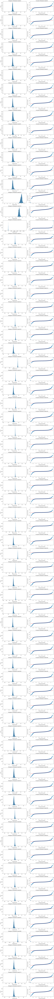

In [75]:
##################################################
#Normality
##################################################
colNm=2
rowNum=len(model_train_result_list)

fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*6,rowNum*3))
for row in range(len(model_train_result_list)):
    # Calculate the residuals.
    residuals = model_train_result_list[row].resid

    # Create a histogram with the residuals. 
    sns.histplot(residuals, ax=axs[row][0])

    # Set the x label of the residual plot.
    axs[row][0].set_xlabel("Residual Value")

    # Set the title of the residual plot.
    axs[row][0].set_title(f"Histogram of Residuals (model:{row})")

    # Create a Q-Q plot of the residuals.
    sm.qqplot(residuals,norm, line = 'r',fit=True,ax=axs[row][1])

    # Set the title of the Q-Q plot.
    axs[row][1].set_title(f"Q-Q plot of Residuals (model:{row})")

# Use matplotlib's tight_layout() function to add space between plots for a cleaner appearance.
plt.tight_layout()

# Show the plot.
plt.show()

#=>QQ plot din't look like normal

In [76]:
#$𝐻_0$:Sample was drawn from a normal distribution
#$𝐻_A$:Sample was not drawn from a normal distribution.
#significance level=0.05

from scipy.stats import shapiro

significance_level=0.05
model_list=[]
data_type_list=[]
statistic_list=[]
pvalue_list=[]
#p-value which less than 0.05
pvalue_lt=[]


for row,result in zip(range(len(model_train_result_list)),model_train_result_list):
    model_list.append(row)
    statistic,pvalue = shapiro(result.resid)
    statistic_list.append(statistic)
    pvalue_list.append(pvalue)
    if pvalue < significance_level:
        pvalue_lt.append('Y')
    else:
        pvalue_lt.append(' ')




normal_check_results=pd.DataFrame(data={
    "model": model_list,
    "statistic":statistic_list,
    "pvalue":pvalue_list,
    "pvalue<0.05":pvalue_lt,
})

normal_check_results
#=>all reject H0

,model,statistic,pvalue,pvalue<0.05
0,0,0.794627,1.899521e-83,Y
1,1,0.796483,3.051063e-83,Y
2,2,0.794798,1.983901e-83,Y
3,3,0.796582,3.129603e-83,Y
4,4,0.797580,4.043576e-83,Y
...,...,...,...,...
68,68,0.643363,1.913424e-96,Y
69,69,0.662596,4.272005e-95,Y
70,70,0.767092,2.512913e-86,Y
71,71,0.658485,2.171688e-95,Y


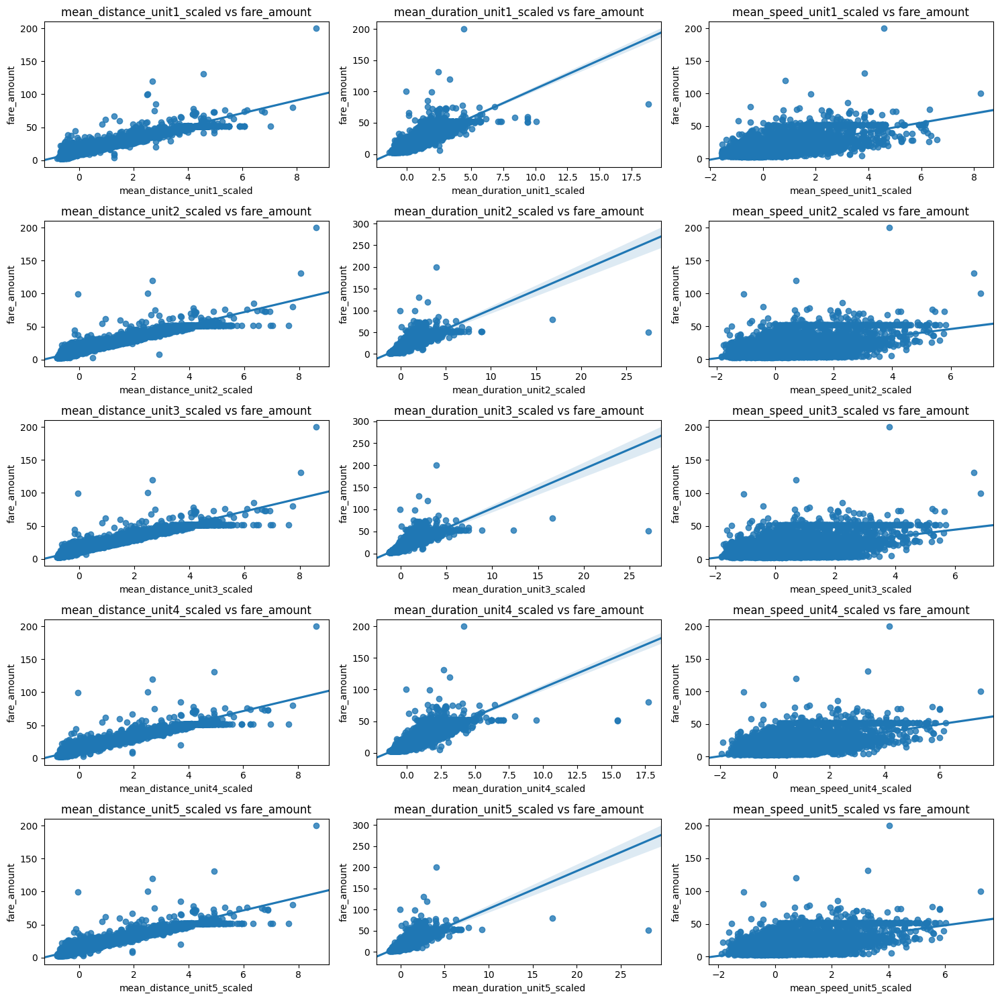

In [77]:
##################################################
#Linearity
##################################################

predictor_list=[
 'mean_distance_unit1_scaled',
 'mean_duration_unit1_scaled',
 'mean_speed_unit1_scaled',
 'mean_distance_unit2_scaled',
 'mean_duration_unit2_scaled',
 'mean_speed_unit2_scaled',
 'mean_distance_unit3_scaled',
 'mean_duration_unit3_scaled',
 'mean_speed_unit3_scaled',
 'mean_distance_unit4_scaled',
 'mean_duration_unit4_scaled',
 'mean_speed_unit4_scaled',
 'mean_distance_unit5_scaled',
 'mean_duration_unit5_scaled',
 'mean_speed_unit5_scaled', ]

colNm=3
rowNum=np.ceil(len(predictor_list)/colNm).astype(int)

fig,axs = plt.subplots(rowNum,colNm,figsize=(colNm*5,rowNum*3))
for predictor,ax in zip(predictor_list,axs.ravel()):
    sns.regplot(x=predictor, y='fare_amount', data=sample_train, 
            ci=95, truncate=False, ax=ax)
    ax.set_title(f"{predictor} vs fare_amount")

plt.tight_layout()
plt.show()

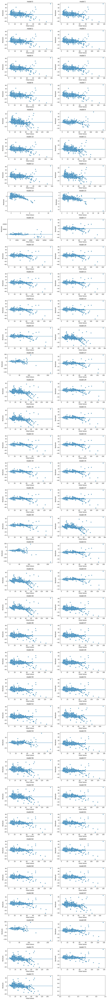

In [78]:
##################################################
#Independence
##################################################
#Skip(Assume Independent)


##################################################
#Constant variance
##################################################
colNm=2
rowNum=np.ceil(len(model_train_result_list)/2).astype(int)
fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*6,rowNum*3))

for row, ax in zip(range(len(model_train_result_list)),axs.ravel()):
    model=model_train_result_list[row]
    residuals = model.resid
    fitted_values =model.get_prediction().predicted_mean
    sns.scatterplot(x=fitted_values, y=residuals,ax=ax)
    ax.set_xlabel("Fitted Values")
    ax.set_ylabel("Residuals")
    ax.set_title(f"model:{row}")
    ax.axhline(0)

plt.tight_layout()
#=>None of them meet homoscedasticity assumptions

####  [Breusch-Pagan Test](https://www.statsmodels.org/dev/generated/statsmodels.stats.diagnostic.het_breuschpagan.html)
* if residuals are normally distributed, this test would be powerful

* $𝐻_0$:Homoscedasticity is present.
* $𝐻_A$:Homoscedasticity is not present

In [79]:
#####################################
#Breusch-Pagan Test
#####################################
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.compat import lzip


significance_level=0.05
model_list=[]
#Lagrange multiplier statistic
lm_statistic_list=[]
#p-value of lagrange multiplier test
lm_pvalue_list=[]
#f-statistic of the hypothesis that the error variance does not depend on x
f_statistic_list=[]
#p-value for the f-statistic
f_pvalue_list=[]

#p-value which less than 0.05
lm_pvalue_lt=[]


#check sales models(all data)
for row,result in zip(range(len(model_train_result_list)),model_train_result_list):
    model_list.append(row)
    lm_statistic,lm_pvalue,f_statistic,f_pvalue = het_breuschpagan(result.resid, result.model.exog)
    lm_statistic_list.append(lm_statistic)
    lm_pvalue_list.append(lm_pvalue)
    f_statistic_list.append(f_statistic)
    f_pvalue_list.append(f_pvalue)
    if lm_pvalue < significance_level:
        lm_pvalue_lt.append('Y')
    else:
        lm_pvalue_lt.append(' ')


bptest_check_results=pd.DataFrame(data={
    "model": model_list,
    "Lagrange multiplier statistic":lm_statistic_list,
    "Lagrange multiplier pvalue":lm_pvalue_list,
    "f-statistic":f_statistic_list,
    "f-pvalue":f_pvalue_list,
    "lm pvalue<0.05":lm_pvalue_lt,
})

bptest_check_results
#=>all reject H0

,model,Lagrange multiplier statistic,Lagrange multiplier pvalue,f-statistic,f-pvalue,lm pvalue<0.05
0,0,4047.861597,0.0,157.581661,0.0,Y
1,1,4022.618275,0.0,340.409007,0.0,Y
2,2,4020.523819,0.0,186.337100,0.0,Y
3,3,3995.080625,0.0,521.152065,0.0,Y
4,4,4031.357534,0.0,362.845238,0.0,Y
...,...,...,...,...,...,...
68,68,1618.749277,0.0,230.583254,0.0,Y
69,69,3934.680701,0.0,701.286230,0.0,Y
70,70,5096.881046,0.0,1039.480128,0.0,Y
71,71,3862.769472,0.0,910.992239,0.0,Y


#### [White’s Lagrange Multiplier Test](https://www.statsmodels.org/dev/generated/statsmodels.stats.diagnostic.het_white.html)

* $𝐻_0$:Homoscedasticity is present.
* $𝐻_A$:Homoscedasticity is not present

In [80]:
#####################################
#The White Test
#####################################
from statsmodels.stats.diagnostic import het_white
from statsmodels.compat import lzip


significance_level=0.05
model_list=[]
#Lagrange multiplier statistic
lm_statistic_list=[]
#p-value of lagrange multiplier test
lm_pvalue_list=[]
#f-statistic of the hypothesis that the error variance does not depend on x
f_statistic_list=[]
#p-value for the f-statistic
f_pvalue_list=[]

#p-value which less than 0.05
lm_pvalue_lt=[]


#check sales models(all data)
for row,result in zip(range(len(model_train_result_list)),model_train_result_list):
    model_list.append(row)
    lm_statistic,lm_pvalue,f_statistic,f_pvalue = het_white(result.resid, result.model.exog)
    lm_statistic_list.append(lm_statistic)
    lm_pvalue_list.append(lm_pvalue)
    f_statistic_list.append(f_statistic)
    f_pvalue_list.append(f_pvalue)
    if lm_pvalue < significance_level:
        lm_pvalue_lt.append('Y')
    else:
        lm_pvalue_lt.append(' ')




whitetest_check_results=pd.DataFrame(data={
    "model": model_list,
    "Lagrange multiplier statistic":lm_statistic_list,
    "Lagrange multiplier pvalue":lm_pvalue_list,
    "f-statistic":f_statistic_list,
    "f-pvalue":f_pvalue_list,
    "lm pvalue<0.05":lm_pvalue_lt,
})

whitetest_check_results
#=>all reject H0

,model,Lagrange multiplier statistic,Lagrange multiplier pvalue,f-statistic,f-pvalue,lm pvalue<0.05
0,0,10000.602595,0.0,114.689604,0.0,Y
1,1,9796.732487,0.0,336.814300,0.0,Y
2,2,9927.555503,0.0,216.924163,0.0,Y
3,3,9160.649469,0.0,556.555945,0.0,Y
4,4,9759.519172,0.0,383.089770,0.0,Y
...,...,...,...,...,...,...
68,68,11790.303002,0.0,3784.464589,0.0,Y
69,69,10868.153671,0.0,2080.547105,0.0,Y
70,70,7758.103765,0.0,629.000900,0.0,Y
71,71,10817.944631,0.0,3579.552422,0.0,Y


In [81]:
##################################################
#No multicollinearity
##################################################

#************************************************#
#Create independent variable list for each model
#************************************************#
independent_list=[]

for ols_formula in ols_formula_list:
    #get dependent variable from formula
    dependent_var=ols_formula.split('~')[0].strip()
    
    #drop dependent variable
    drop_dependent=ols_formula.replace(f"{dependent_var} ~ ", "")
    
    #split independent variable
    independent_vars=drop_dependent.split('+')
    
    #trim space
    independent_vars = [x.strip() for x in independent_vars]
    independent_list.append(independent_vars)
    #print(independent_list)

#************************************************#
#Calculate the variance inflation factor
#************************************************#
from statsmodels.stats.outliers_influence import variance_inflation_factor

#model number list
modelNo_list=[]
#compare independent variables
compare_list=[]
feature_list=[]
vif_list=[]
vif_gt5=[]

for modelNo,independent_vars in zip(range(len(ols_formula_list)),independent_list):
    X = sample_train[independent_vars]
    # VIF dataframe
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns

    # calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                              for i in range(len(X.columns))]
    
    #organize results
    for row in range(vif_data.shape[0]):
        modelNo_list.append(modelNo)
        compare_list.append(independent_vars)
        feature_list.append(vif_data.loc[row,'feature'])
        vif_list.append(vif_data.loc[row,'VIF'])
        if vif_data.loc[row,'VIF'] >=5:
            vif_gt5.append('Y')
        else:
            vif_gt5.append(' ')

df_vif_results=pd.DataFrame(data={
    "Model No": modelNo_list,
    "compare variables": compare_list,
    "feature": feature_list,
    "VIF": vif_list,
    "VIF>=5": vif_gt5
})
df_vif_results[df_vif_results['VIF>=5']=='Y']

,Model No,compare variables,feature,VIF,VIF>=5
0,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,17.446037,Y
1,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.854521,Y
2,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,5.266817,Y
3,0,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,12.181864,Y
7,0,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,28.383399,Y
...,...,...,...,...,...
867,63,"[mean_distance_unit5_scaled, mean_duration_uni...",PU_weekday_Sunday,6.727078,Y
868,64,"[mean_distance_unit5_scaled, mean_duration_uni...",mean_distance_unit5_scaled,9.705592,Y
869,64,"[mean_distance_unit5_scaled, mean_duration_uni...",mean_duration_unit5_scaled,5.278296,Y
878,65,"[mean_distance_unit5_scaled, mean_duration_uni...",mean_distance_unit5_scaled,9.669084,Y


In [82]:
df_vif_results[df_vif_results['Model No']==0]

,Model No,compare variables,feature,VIF,VIF>=5
0,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,17.446037,Y
1,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.854521,Y
2,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,5.266817,Y
3,0,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,12.181864,Y
4,0,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Nassau_or_Westchester,1.010896,
5,0,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Negotiated_fare,1.018568,
6,0,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Newark,1.040383,
7,0,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,28.383399,Y
8,0,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Monday,1.950621,
9,0,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Tuesday,1.925890,


In [83]:
df_vif_results[df_vif_results['Model No']==1]

,Model No,compare variables,feature,VIF,VIF>=5
37,1,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,15.913609,Y
38,1,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.513411,Y
39,1,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,4.976838,
40,1,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,12.155888,Y
41,1,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Nassau_or_Westchester,1.007351,
42,1,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Negotiated_fare,1.011228,
43,1,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Newark,1.033962,
44,1,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,11.052005,Y
45,1,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Monday,1.928948,
46,1,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Tuesday,1.904265,


In [84]:
df_vif_results[df_vif_results['Model No']==2]

,Model No,compare variables,feature,VIF,VIF>=5
54,2,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,17.249345,Y
55,2,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.811214,Y
56,2,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,5.240237,Y
57,2,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,1.513013,
58,2,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Nassau_or_Westchester,1.010644,
59,2,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Negotiated_fare,1.018057,
60,2,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Newark,1.038982,
61,2,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,25.733689,Y
62,2,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_1,1.555534,
63,2,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_2,1.432247,


#### RatecodeID=1 or RatecodeID=3

In [85]:
# Evaluate the modelB performance on the training data

rsquared_list=[]
#Adjusted R-squared.
rsquared_adj_list=[]
pvalue_list=[]
mse_list=[]
mae_list=[]
aic_list=[]
bic_list=[]


for row in range(len(modelB_train_result_list)):
    modelB=modelB_train_result_list[row]
    num_params = len(modelB.params)
    predicted_values =modelB.get_prediction(X_dummyB_train_scaled).predicted_mean
    #get modelB formula
    modelB_formula=ols_formulaB_list[row]
    #get dependent variable from formula
    dependent_var=modelB_formula.split('~')[0].strip()
    observed_value=sampleB_train[dependent_var]
    #compute R-squared
    r_squared=r2_score(observed_value,predicted_values)
    rsquared_list.append(r_squared)
    #Adjusted R-squared
    predictor_num=modelB.df_model
    adj_rsquared=calculate_adjR2(r_squared,len(observed_value), predictor_num)
    rsquared_adj_list.append(adj_rsquared)
    #rsquared_adj_list.append(modelB.rsquared_adj)
    #compute MSE
    mse=mean_squared_error(observed_value,predicted_values)
    mse_list.append(mse)
    #compute MAE
    mae=mean_absolute_error(observed_value,predicted_values)
    mae_list.append(mae)
    #resid=modelB.resid
    resid=predicted_values-observed_value
    #compute AIC
    aic=calculate_aic(len(observed_value), resid, num_params)
    aic_list.append(aic)
    #compute BIC
    bic=calculate_bic(len(observed_value), resid, num_params)
    bic_list.append(bic)
    

trainB_result_evaluation_metrics=pd.DataFrame(data={
    "model":range(len(modelB_train_result_list)),
    "R-squred":rsquared_list,
    "Rdj.R-squred":rsquared_adj_list,
    "MSE":mse_list,
    "MAE":mae_list,
    "AIC":aic_list,
    "BIC":bic_list,
})

trainB_result_evaluation_metrics.to_csv('ml_planB_train_score.csv', index=False)
trainB_result_evaluation_metrics.head(50)

,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
0,0,0.916430,0.916216,6.202785,1.667461,60118.510827,60379.725477
1,1,0.914955,0.914869,6.312274,1.680238,60303.844212,60415.793347
2,2,0.915750,0.915573,6.253274,1.674516,60210.908925,60427.343921
3,3,0.914261,0.914214,6.363792,1.687626,60396.523015,60463.692496
4,4,0.914531,0.914452,6.343723,1.685480,60365.845323,60470.331183
5,5,0.913856,0.913816,6.393835,1.692596,60455.175151,60514.881357
6,6,0.913689,0.913655,6.406271,1.692924,60478.197815,60530.440745
7,7,0.913443,0.913416,6.424511,1.689557,60512.813815,60557.593469
8,8,0.900846,0.900815,7.359530,1.871224,62262.617901,62307.397555
9,9,0.877822,0.877784,9.068401,1.967740,64951.543126,64996.322780


In [86]:
trainB_result_evaluation_metrics.tail(30)

,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
43,43,0.981955,0.981953,1.339329,0.529219,40316.734526,40346.587629
44,44,0.957199,0.957193,3.176780,1.136124,51439.452130,51469.305233
45,45,0.940131,0.939977,4.443676,1.313339,55823.485573,56084.700223
46,46,0.939374,0.939313,4.499852,1.315789,55945.265049,56057.214185
47,47,0.939736,0.939609,4.472980,1.315440,55896.129869,56112.564864
48,48,0.938976,0.938943,4.529363,1.317980,56017.447212,56084.616693
49,49,0.939365,0.939309,4.500491,1.316216,55945.094524,56049.580384
50,50,0.938972,0.938943,4.529698,1.318110,56016.399085,56076.105291
51,51,0.938938,0.938914,4.532216,1.318860,56021.556002,56073.798932
52,52,0.937886,0.937866,4.610305,1.312691,56239.551552,56284.331206


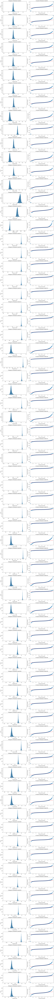

In [87]:
##################################################
#Normality
##################################################
colNm=2
rowNum=len(modelB_train_result_list)

fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*6,rowNum*3))
for row in range(len(modelB_train_result_list)):
    # Calculate the residuals.
    residuals = modelB_train_result_list[row].resid

    # Create a histogram with the residuals. 
    sns.histplot(residuals, ax=axs[row][0])


    # Set the x label of the residual plot.
    axs[row][0].set_xlabel("Residual Value")

    # Set the title of the residual plot.
    axs[row][0].set_title(f"Histogram of Residuals (model:{row})")

    # Create a Q-Q plot of the residuals.
    sm.qqplot(residuals,norm, line = 'r',fit=True,ax=axs[row][1])


    # Set the title of the Q-Q plot.
    axs[row][1].set_title(f"Q-Q plot of Residuals (model:{row})")

# Use matplotlib's tight_layout() function to add space between plots for a cleaner appearance.
plt.tight_layout()

# Show the plot.
plt.show()

In [88]:
#$𝐻_0$:Sample was drawn from a normal distribution
#$𝐻_A$:Sample was not drawn from a normal distribution.
#significance level=0.05

from scipy.stats import shapiro

significance_level=0.05
model_list=[]
data_type_list=[]
statistic_list=[]
pvalue_list=[]
#p-value which less than 0.05
pvalue_lt=[]


for row,result in zip(range(len(modelB_train_result_list)),modelB_train_result_list):
    model_list.append(row)
    statistic,pvalue = shapiro(result.resid)
    statistic_list.append(statistic)
    pvalue_list.append(pvalue)
    if pvalue < significance_level:
        pvalue_lt.append('Y')
    else:
        pvalue_lt.append(' ')


normal_check_resultsB=pd.DataFrame(data={
    "model": model_list,
    "statistic":statistic_list,
    "pvalue":pvalue_list,
    "pvalue<0.05":pvalue_lt,
})

normal_check_resultsB
#=>all reject H0

,model,statistic,pvalue,pvalue<0.05
0,0,0.864422,7.688625e-74,Y
1,1,0.864906,9.162178e-74,Y
2,2,0.863999,6.598773e-74,Y
3,3,0.864376,7.562087e-74,Y
4,4,0.865600,1.179057e-73,Y
...,...,...,...,...
68,68,0.662682,1.480151e-94,Y
69,69,0.737141,1.254367e-88,Y
70,70,0.862139,3.387349e-74,Y
71,71,0.732254,4.647812e-89,Y


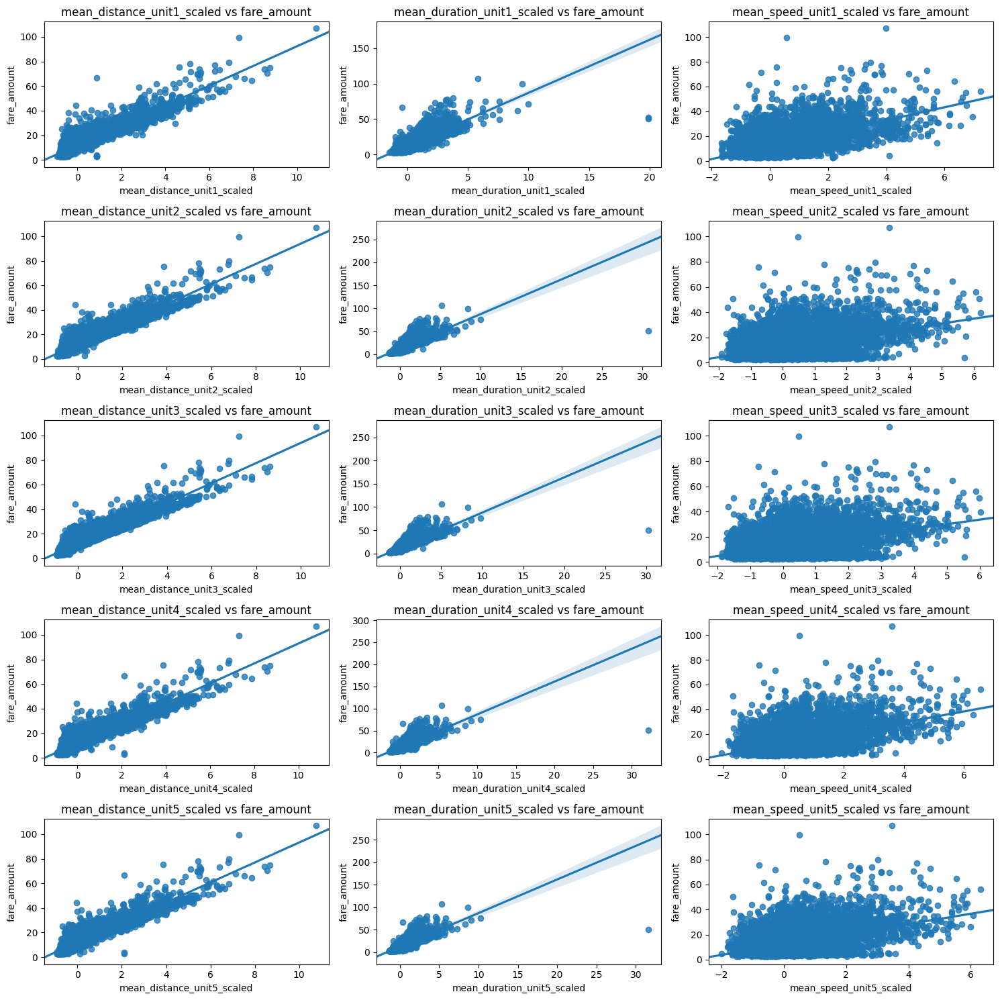

In [89]:
##################################################
#Linearity
##################################################

predictor_list=[
 'mean_distance_unit1_scaled',
 'mean_duration_unit1_scaled',
 'mean_speed_unit1_scaled',
 'mean_distance_unit2_scaled',
 'mean_duration_unit2_scaled',
 'mean_speed_unit2_scaled',
 'mean_distance_unit3_scaled',
 'mean_duration_unit3_scaled',
 'mean_speed_unit3_scaled',
 'mean_distance_unit4_scaled',
 'mean_duration_unit4_scaled',
 'mean_speed_unit4_scaled',
 'mean_distance_unit5_scaled',
 'mean_duration_unit5_scaled',
 'mean_speed_unit5_scaled',]

colNm=3
rowNum=np.ceil(len(predictor_list)/colNm).astype(int)

fig,axs = plt.subplots(rowNum,colNm,figsize=(colNm*5,rowNum*3))
for predictor,ax in zip(predictor_list,axs.ravel()):
    sns.regplot(x=predictor, y='fare_amount', data=sampleB_train, 
            ci=95, truncate=False, ax=ax)
    ax.set_title(f"{predictor} vs fare_amount")

plt.tight_layout()
plt.show()

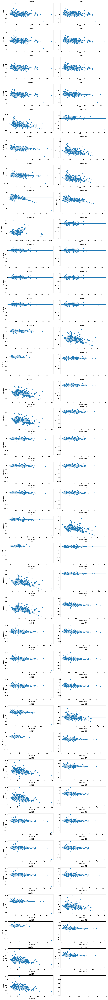

In [90]:
##################################################
#Independence
##################################################
#Skip(Assume Independent)


##################################################
#Constant variance
##################################################
colNm=2
rowNum=np.ceil(len(modelB_train_result_list)/2).astype(int)
fig, axs=plt.subplots(rowNum,colNm,figsize=(colNm*6,rowNum*3))

for row, ax in zip(range(len(modelB_train_result_list)),axs.ravel()):
    model=modelB_train_result_list[row]
    residuals = model.resid
    fitted_values =model.get_prediction().predicted_mean
    sns.scatterplot(x=fitted_values, y=residuals,ax=ax)
    ax.set_xlabel("Fitted Values")
    ax.set_ylabel("Residuals")
    ax.set_title(f"model:{row}")
    ax.axhline(0)

plt.tight_layout()
#=>None of them meet homoscedasticity assumptions

####  [Breusch-Pagan Test](https://www.statsmodels.org/dev/generated/statsmodels.stats.diagnostic.het_breuschpagan.html)
* if residuals are normally distributed, this test would be powerful

* $𝐻_0$:Homoscedasticity is present.
* $𝐻_A$:Homoscedasticity is not present

In [91]:
#####################################
#Breusch-Pagan Test
#####################################
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.compat import lzip


significance_level=0.05
model_list=[]
#Lagrange multiplier statistic
lm_statistic_list=[]
#p-value of lagrange multiplier test
lm_pvalue_list=[]
#f-statistic of the hypothesis that the error variance does not depend on x
f_statistic_list=[]
#p-value for the f-statistic
f_pvalue_list=[]

#p-value which less than 0.05
lm_pvalue_lt=[]


#check sales models(all data)
for row,result in zip(range(len(modelB_train_result_list)),modelB_train_result_list):
    model_list.append(row)
    lm_statistic,lm_pvalue,f_statistic,f_pvalue = het_breuschpagan(result.resid, result.model.exog)
    lm_statistic_list.append(lm_statistic)
    lm_pvalue_list.append(lm_pvalue)
    f_statistic_list.append(f_statistic)
    f_pvalue_list.append(f_pvalue)
    if lm_pvalue < significance_level:
        lm_pvalue_lt.append('Y')
    else:
        lm_pvalue_lt.append(' ')


bptest_check_resultsB=pd.DataFrame(data={
    "model": model_list,
    "Lagrange multiplier statistic":lm_statistic_list,
    "Lagrange multiplier pvalue":lm_pvalue_list,
    "f-statistic":f_statistic_list,
    "f-pvalue":f_pvalue_list,
    "lm pvalue<0.05":lm_pvalue_lt,
})
print(bptest_check_resultsB[bptest_check_resultsB['lm pvalue<0.05']=='N']['model'].count())
bptest_check_resultsB
#=>all reject H0

0


,model,Lagrange multiplier statistic,Lagrange multiplier pvalue,f-statistic,f-pvalue,lm pvalue<0.05
0,0,1174.567448,8.686445e-225,37.909868,1.836830e-236,Y
1,1,1152.128175,3.377357e-237,90.275497,8.411541e-249,Y
2,2,1203.380545,1.087109e-235,47.301134,4.162401e-248,Y
3,3,1182.068895,7.176195e-250,162.578384,3.079301e-262,Y
4,4,1142.817553,3.535924e-236,96.365091,1.318461e-247,Y
...,...,...,...,...,...,...
68,68,1161.118622,7.754435e-249,255.117696,8.180630e-261,Y
69,69,2092.261865,0.000000e+00,499.392705,0.000000e+00,Y
70,70,466.298278,1.496998e-98,96.718267,2.209697e-100,Y
71,71,2031.388708,0.000000e+00,803.694890,0.000000e+00,Y


#### [White’s Lagrange Multiplier Test](https://www.statsmodels.org/dev/generated/statsmodels.stats.diagnostic.het_white.html)

* $𝐻_0$:Homoscedasticity is present.
* $𝐻_A$:Homoscedasticity is not present

In [92]:
#####################################
#The White Test
#####################################
from statsmodels.stats.diagnostic import het_white
from statsmodels.compat import lzip


significance_level=0.05
model_list=[]
#Lagrange multiplier statistic
lm_statistic_list=[]
#p-value of lagrange multiplier test
lm_pvalue_list=[]
#f-statistic of the hypothesis that the error variance does not depend on x
f_statistic_list=[]
#p-value for the f-statistic
f_pvalue_list=[]

#p-value which less than 0.05
lm_pvalue_lt=[]


#check sales models(all data)
for row,result in zip(range(len(modelB_train_result_list)),modelB_train_result_list):
    model_list.append(row)
    lm_statistic,lm_pvalue,f_statistic,f_pvalue = het_white(result.resid, result.model.exog)
    lm_statistic_list.append(lm_statistic)
    lm_pvalue_list.append(lm_pvalue)
    f_statistic_list.append(f_statistic)
    f_pvalue_list.append(f_pvalue)
    if lm_pvalue < significance_level:
        lm_pvalue_lt.append('Y')
    else:
        lm_pvalue_lt.append(' ')




whitetest_check_resultsB=pd.DataFrame(data={
    "model": model_list,
    "Lagrange multiplier statistic":lm_statistic_list,
    "Lagrange multiplier pvalue":lm_pvalue_list,
    "f-statistic":f_statistic_list,
    "f-pvalue":f_pvalue_list,
    "lm pvalue<0.05":lm_pvalue_lt,
})

print(whitetest_check_resultsB[whitetest_check_resultsB['lm pvalue<0.05']=='N']['model'].count())
whitetest_check_resultsB
#=>all reject H0

0


,model,Lagrange multiplier statistic,Lagrange multiplier pvalue,f-statistic,f-pvalue,lm pvalue<0.05
0,0,3617.728251,0.000000e+00,15.889854,0.000000e+00,Y
1,1,3319.964009,0.000000e+00,51.661946,0.000000e+00,Y
2,2,3578.937270,0.000000e+00,34.031662,0.000000e+00,Y
3,3,3385.954255,0.000000e+00,127.238227,0.000000e+00,Y
4,4,3277.091597,0.000000e+00,61.564648,0.000000e+00,Y
...,...,...,...,...,...,...
68,68,12193.162452,0.000000e+00,13468.550023,0.000000e+00,Y
69,69,11420.159092,0.000000e+00,5925.896590,0.000000e+00,Y
70,70,855.813546,5.728427e-171,53.850253,3.638948e-177,Y
71,71,11449.753903,0.000000e+00,12895.789041,0.000000e+00,Y


In [93]:
##################################################
#No multicollinearity
##################################################

#************************************************#
#Create independent variable list for each model
#************************************************#
independent_list=[]

for ols_formula in ols_formulaB_list:
    #get dependent variable from formula
    dependent_var=ols_formula.split('~')[0].strip()
    
    #drop dependent variable
    drop_dependent=ols_formula.replace(f"{dependent_var} ~ ", "")
    
    #split independent variable
    independent_vars=drop_dependent.split('+')
    
    #trim space
    independent_vars = [x.strip() for x in independent_vars]
    independent_list.append(independent_vars)
    #print(independent_list)

#************************************************#
#Calculate the variance inflation factor
#************************************************#
from statsmodels.stats.outliers_influence import variance_inflation_factor

#model number list
modelNo_list=[]
#compare independent variables
compare_list=[]
feature_list=[]
vif_list=[]
vif_gt5=[]

for modelNo,independent_vars in zip(range(len(ols_formulaB_list)),independent_list):
    X = sample_train[independent_vars]
    # VIF dataframe
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns

    # calculating VIF for each feature
    vif_data["VIF"] = [variance_inflation_factor(X.values, i)
                              for i in range(len(X.columns))]
    
    #organize results
    for row in range(vif_data.shape[0]):
        modelNo_list.append(modelNo)
        compare_list.append(independent_vars)
        feature_list.append(vif_data.loc[row,'feature'])
        vif_list.append(vif_data.loc[row,'VIF'])
        if vif_data.loc[row,'VIF'] >=5:
            vif_gt5.append('Y')
        else:
            vif_gt5.append(' ')

df_vif_resultsB=pd.DataFrame(data={
    "Model No": modelNo_list,
    "compare variables": compare_list,
    "feature": feature_list,
    "VIF": vif_list,
    "VIF>=5": vif_gt5
})
print(df_vif_resultsB[df_vif_resultsB['VIF>=5']=='Y']['Model No'].unique())
df_vif_resultsB[df_vif_resultsB['VIF>=5']=='Y']

[ 0  1  2  3  4  5  6 17 18 19 20 21 22 23 31 32 33 34 35 36 37 45 46 47
 48 49 50 51 59 60 61 62 63 64 65]


,Model No,compare variables,feature,VIF,VIF>=5
0,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,17.319636,Y
1,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.808181,Y
2,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,5.257127,Y
3,0,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,12.173516,Y
4,0,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,27.885350,Y
...,...,...,...,...,...
675,63,"[mean_distance_unit5_scaled, mean_duration_uni...",PU_weekday_Sunday,6.726174,Y
676,64,"[mean_distance_unit5_scaled, mean_duration_uni...",mean_distance_unit5_scaled,9.563426,Y
677,64,"[mean_distance_unit5_scaled, mean_duration_uni...",mean_duration_unit5_scaled,5.243408,Y
683,65,"[mean_distance_unit5_scaled, mean_duration_uni...",mean_distance_unit5_scaled,9.524189,Y


In [94]:
df_vif_resultsB[df_vif_resultsB['Model No']==0]

,Model No,compare variables,feature,VIF,VIF>=5
0,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,17.319636,Y
1,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.808181,Y
2,0,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,5.257127,Y
3,0,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,12.173516,Y
4,0,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,27.885350,Y
5,0,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Monday,1.949755,
6,0,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Tuesday,1.924362,
7,0,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Wednesday,1.987537,
8,0,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Thursday,1.967593,
9,0,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Saturday,7.663792,Y


In [95]:
df_vif_resultsB[df_vif_resultsB['Model No']==1]

,Model No,compare variables,feature,VIF,VIF>=5
34,1,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,15.697243,Y
35,1,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.442120,Y
36,1,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,4.962813,
37,1,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,12.148457,Y
38,1,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,10.995735,Y
39,1,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Monday,1.926845,
40,1,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Tuesday,1.901319,
41,1,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Wednesday,1.962380,
42,1,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Thursday,1.945020,
43,1,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Saturday,7.643681,Y


In [96]:
df_vif_resultsB[df_vif_resultsB['Model No']==2]

,Model No,compare variables,feature,VIF,VIF>=5
48,2,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,17.114763,Y
49,2,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.762739,Y
50,2,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,5.230195,Y
51,2,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,1.512636,
52,2,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,25.301625,Y
53,2,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_1,1.546382,
54,2,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_2,1.425344,
55,2,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_3,1.338938,
56,2,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_4,1.232092,
57,2,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_5,1.236832,


In [97]:
df_vif_resultsB[df_vif_resultsB['Model No']==3]

,Model No,compare variables,feature,VIF,VIF>=5
76,3,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,15.302436,Y
77,3,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.355612,Y
78,3,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,4.910672,
79,3,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,1.473586,
80,3,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,6.320632,Y
81,3,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_class_daytime,2.846683,
82,3,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_class_nighttime,2.970852,
83,3,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_hour_class_pm_rush,2.430511,


In [98]:
df_vif_resultsB[df_vif_resultsB['Model No']==4]

,Model No,compare variables,feature,VIF,VIF>=5
84,4,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_distance_unit1_scaled,15.379445,Y
85,4,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_duration_unit1_scaled,7.405914,Y
86,4,"[mean_distance_unit1_scaled, mean_duration_uni...",mean_speed_unit1_scaled,4.876542,
87,4,"[mean_distance_unit1_scaled, mean_duration_uni...",rush_hour,2.081762,
88,4,"[mean_distance_unit1_scaled, mean_duration_uni...",holiday,12.528250,Y
89,4,"[mean_distance_unit1_scaled, mean_duration_uni...",nighttime,1.835191,
90,4,"[mean_distance_unit1_scaled, mean_duration_uni...",RatecodeID_Standard_rate,8.813150,Y
91,4,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Monday,1.925291,
92,4,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Tuesday,1.898437,
93,4,"[mean_distance_unit1_scaled, mean_duration_uni...",PU_weekday_Wednesday,1.959799,


### Validation set

* Alreay know linear regression didn't meet assumptions, check see validation score

In [99]:
# Scale the X_valdata


#columns needs to standardize
transform_cols =['mean_distance_unit1','mean_duration_unit1','mean_speed_unit1',
                'mean_distance_unit2','mean_duration_unit2','mean_speed_unit2',
                'mean_distance_unit3','mean_duration_unit3','mean_speed_unit3',
                'mean_distance_unit4','mean_duration_unit4','mean_speed_unit4',
                'mean_distance_unit5','mean_duration_unit5','mean_speed_unit5',]
#standardized column names, add '_scaled' to original column name
scaled_cols=[x + '_scaled' for x in transform_cols]

##########################################
#all RatecodeID
##########################################
X_dummy_val_scaled_continuous =scaler.transform(X_dummy_val[transform_cols])

# Convert the scaled data back to a dataframe
X_dummy_val_scaled_continuous_df = pd.DataFrame(X_dummy_val_scaled_continuous, columns=transform_cols)
X_dummy_val_scaled=X_dummy_val.copy()
X_dummy_val_scaled.reset_index(drop=True, inplace=True)

X_dummy_val_scaled[scaled_cols]=X_dummy_val_scaled_continuous_df[transform_cols]
display(X_dummy_val_scaled.head())

##########################################
#RatecodeID=1 or 3
##########################################
X_dummyB_val_scaled_continuous =scaler.transform(X_dummyB_val[transform_cols])

# Convert the scaled data back to a dataframe
X_dummyB_val_scaled_continuous_df = pd.DataFrame(X_dummyB_val_scaled_continuous, columns=transform_cols)
X_dummyB_val_scaled=X_dummyB_val.copy()
X_dummyB_val_scaled.reset_index(drop=True, inplace=True)

X_dummyB_val_scaled[scaled_cols]=X_dummyB_val_scaled_continuous_df[transform_cols]
display(X_dummyB_val_scaled.head())

,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Nassau_or_Westchester,RatecodeID_Negotiated_fare,RatecodeID_Newark,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled
0,3.40,28.967,7.042578,1,0,0,1,229_158,229_158_18,229_158_Sunday_18,229_158_pm_rush,229_158_1_pm_rush,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,6.20,15.933,23.347280,0,0,0,1,140_209,140_209_13,140_209_Tuesday_13,140_209_daytime,140_209_0_daytime,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1.25,10.117,7.413509,0,1,0,1,142_237,142_237_17,142_237_Monday_17,142_237_pm_rush,142_237_0_pm_rush,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1.4220,NaN,NaN,1.620000,1.833333,10.61335,NaN,NaN,13.220000,17.100000,9.420058,NaN,NaN,8.074745,6.448980,-0.411315,-0.358514,-0.368459,NaN,NaN,NaN,NaN,NaN,NaN,-0.353832,-0.101026,-0.582425,-0.293824,0.244829,-0.853827
3,11.50,39.733,17.365772,1,0,0,1,138_230,138_230_15,138_230_Saturday_15,138_230_daytime,138_230_1_daytime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,11.0255,11.216667,NaN,11.074444,12.616667,44.79745,59.183333,NaN,48.914889,50.044667,16.626248,12.041017,NaN,14.187606,15.211949,2.282245,2.937678,1.092800,2.310688,3.866707,0.138691,NaN,NaN,NaN,2.283399,3.143563,0.543404,2.708977,3.158171,0.708799
4,2.77,18.967,8.762742,1,0,0,1,148_68,148_68_13,148_68_Saturday_13,148_68_daytime,148_68_1_daytime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,3.6000,NaN,NaN,NaN,NaN,29.70000,NaN,NaN,NaN,NaN,7.272727,NaN,NaN,NaN,NaN,0.199564,1.481911,-0.803891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled
0,1.26,7.750,9.754839,0,1,0,1,162_107,162_107_19,162_107_Thursday_19,162_107_pm_rush,162_107_0_pm_rush,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1.506667,1.16,NaN,1.334286,1.225,8.640722,5.067,NaN,6.030857,5.97075,11.793125,13.736842,NaN,13.593927,12.553921,-0.387568,-0.548724,0.112747,-0.479575,-0.798691,0.431259,NaN,NaN,NaN,-0.433529,-0.754504,0.434063,-0.463225,-0.739345,0.234815
1,1.50,10.033,8.970100,1,0,0,1,232_79,232_79_13,232_79_Saturday_13,232_79_daytime,232_79_1_daytime,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.050000,NaN,NaN,NaN,NaN,6.508500,NaN,NaN,NaN,NaN,9.889701,NaN,NaN,NaN,NaN,-0.515652,-0.754323,-0.273226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3.91,13.367,17.551122,0,1,0,1,161_74,161_74_19,161_74_Monday_19,161_74_pm_rush,161_74_0_pm_rush,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.250000,NaN,NaN,NaN,NaN,15.541500,NaN,NaN,NaN,NaN,16.411195,NaN,NaN,NaN,NaN,0.381874,0.116682,1.049191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3.19,16.450,11.635258,0,1,0,1,211_161,211_161_7,211_161_Thursday_7,211_161_am_rush,211_161_0_am_rush,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2.10,19.833,6.352941,0,0,1,1,43_100,43_100_23,43_100_Friday_23,43_100_nighttime,43_100_0_nighttime,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,3.105000,NaN,NaN,NaN,NaN,24.258500,NaN,NaN,NaN,NaN,7.964585,NaN,NaN,NaN,NaN,0.060728,0.957216,-0.663598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


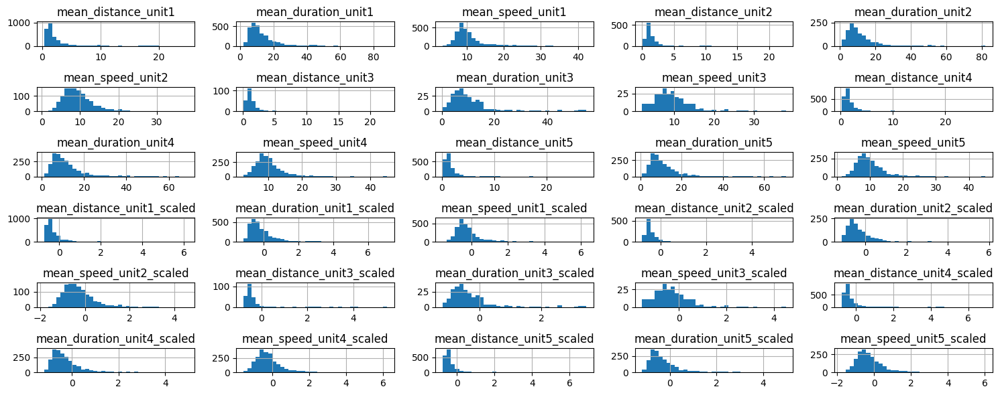

In [100]:
##########################################
#all RatecodeID
##########################################
X_dummy_val_scaled[transform_cols+scaled_cols].hist(bins=35, figsize=(15, 6))
plt.tight_layout()
plt.show()

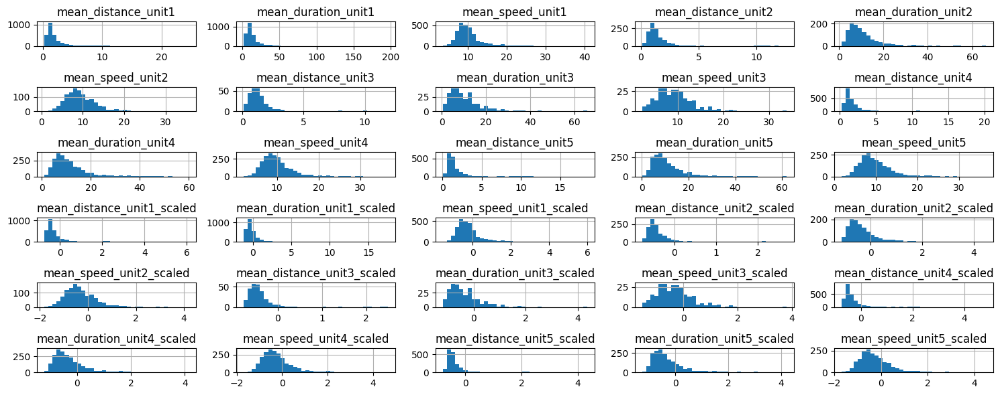

In [101]:
##########################################
#RatecodeID=1 or 3
##########################################
X_dummyB_val_scaled[transform_cols+scaled_cols].hist(bins=35, figsize=(15, 6))
plt.tight_layout()
plt.show()

In [102]:
##########################################
#all RatecodeID
##########################################
y_dummy_val_noindex=y_dummy_val.copy()
y_dummy_val_noindex=y_dummy_val_noindex.reset_index(drop=True)

sample_val = pd.merge(X_dummy_val_scaled, y_dummy_val_noindex, how="left",left_index=True, right_index=True)
sample_val.info()
sample_val.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3289 entries, 0 to 3288
Data columns (total 79 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   trip_distance                     3289 non-null   float64
 1   duration                          3289 non-null   float64
 2   avg_speed                         3289 non-null   float64
 3   holiday                           3289 non-null   int64  
 4   rush_hour                         3289 non-null   int64  
 5   nighttime                         3289 non-null   int64  
 6   ratecodeid                        3289 non-null   int64  
 7   gpb_unit1                         3289 non-null   object 
 8   gpb_unit2                         3289 non-null   object 
 9   gpb_unit3                         3289 non-null   object 
 10  gpb_unit4                         3289 non-null   object 
 11  gpb_unit5                         3289 non-null   object 
 12  Rateco

,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Nassau_or_Westchester,RatecodeID_Negotiated_fare,RatecodeID_Newark,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled,fare_amount
0,3.40,28.967,7.042578,1,0,0,1,229_158,229_158_18,229_158_Sunday_18,229_158_pm_rush,229_158_1_pm_rush,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.0
1,6.20,15.933,23.347280,0,0,0,1,140_209,140_209_13,140_209_Tuesday_13,140_209_daytime,140_209_0_daytime,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.0
2,1.25,10.117,7.413509,0,1,0,1,142_237,142_237_17,142_237_Monday_17,142_237_pm_rush,142_237_0_pm_rush,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1.4220,NaN,NaN,1.620000,1.833333,10.61335,NaN,NaN,13.220000,17.100000,9.420058,NaN,NaN,8.074745,6.448980,-0.411315,-0.358514,-0.368459,NaN,NaN,NaN,NaN,NaN,NaN,-0.353832,-0.101026,-0.582425,-0.293824,0.244829,-0.853827,8.0
3,11.50,39.733,17.365772,1,0,0,1,138_230,138_230_15,138_230_Saturday_15,138_230_daytime,138_230_1_daytime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,11.0255,11.216667,NaN,11.074444,12.616667,44.79745,59.183333,NaN,48.914889,50.044667,16.626248,12.041017,NaN,14.187606,15.211949,2.282245,2.937678,1.092800,2.310688,3.866707,0.138691,NaN,NaN,NaN,2.283399,3.143563,0.543404,2.708977,3.158171,0.708799,35.0
4,2.77,18.967,8.762742,1,0,0,1,148_68,148_68_13,148_68_Saturday_13,148_68_daytime,148_68_1_daytime,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,3.6000,NaN,NaN,NaN,NaN,29.70000,NaN,NaN,NaN,NaN,7.272727,NaN,NaN,NaN,NaN,0.199564,1.481911,-0.803891,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.5


In [103]:
##########################################
#RatecodeID=1 or 3
##########################################
y_dummyB_val_noindex=y_dummyB_val.copy()
y_dummyB_val_noindex=y_dummyB_val_noindex.reset_index(drop=True)

sampleB_val = pd.merge(X_dummyB_val_scaled, y_dummyB_val_noindex, how="left",left_index=True, right_index=True)
sampleB_val.info()
sampleB_val.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3220 entries, 0 to 3219
Data columns (total 76 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   trip_distance               3220 non-null   float64
 1   duration                    3220 non-null   float64
 2   avg_speed                   3220 non-null   float64
 3   holiday                     3220 non-null   int64  
 4   rush_hour                   3220 non-null   int64  
 5   nighttime                   3220 non-null   int64  
 6   ratecodeid                  3220 non-null   int64  
 7   gpb_unit1                   3220 non-null   object 
 8   gpb_unit2                   3220 non-null   object 
 9   gpb_unit3                   3220 non-null   object 
 10  gpb_unit4                   3220 non-null   object 
 11  gpb_unit5                   3220 non-null   object 
 12  RatecodeID_Standard_rate    3220 non-null   int64  
 13  PU_weekday_Monday           3220 

,trip_distance,duration,avg_speed,holiday,rush_hour,nighttime,ratecodeid,gpb_unit1,gpb_unit2,gpb_unit3,gpb_unit4,gpb_unit5,RatecodeID_Standard_rate,PU_weekday_Monday,PU_weekday_Saturday,PU_weekday_Sunday,PU_weekday_Thursday,PU_weekday_Tuesday,PU_weekday_Wednesday,PU_hour_1,PU_hour_10,PU_hour_11,PU_hour_12,PU_hour_13,PU_hour_14,PU_hour_15,PU_hour_16,PU_hour_17,PU_hour_18,PU_hour_19,PU_hour_2,PU_hour_20,PU_hour_21,PU_hour_22,PU_hour_23,PU_hour_3,PU_hour_4,PU_hour_5,PU_hour_6,PU_hour_7,PU_hour_8,PU_hour_9,PU_hour_class_daytime,PU_hour_class_nighttime,PU_hour_class_pm_rush,mean_distance_unit1,mean_distance_unit2,mean_distance_unit3,mean_distance_unit4,mean_distance_unit5,mean_duration_unit1,mean_duration_unit2,mean_duration_unit3,mean_duration_unit4,mean_duration_unit5,mean_speed_unit1,mean_speed_unit2,mean_speed_unit3,mean_speed_unit4,mean_speed_unit5,mean_distance_unit1_scaled,mean_duration_unit1_scaled,mean_speed_unit1_scaled,mean_distance_unit2_scaled,mean_duration_unit2_scaled,mean_speed_unit2_scaled,mean_distance_unit3_scaled,mean_duration_unit3_scaled,mean_speed_unit3_scaled,mean_distance_unit4_scaled,mean_duration_unit4_scaled,mean_speed_unit4_scaled,mean_distance_unit5_scaled,mean_duration_unit5_scaled,mean_speed_unit5_scaled,fare_amount
0,1.26,7.750,9.754839,0,1,0,1,162_107,162_107_19,162_107_Thursday_19,162_107_pm_rush,162_107_0_pm_rush,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1.506667,1.16,NaN,1.334286,1.225,8.640722,5.067,NaN,6.030857,5.97075,11.793125,13.736842,NaN,13.593927,12.553921,-0.387568,-0.548724,0.112747,-0.479575,-0.798691,0.431259,NaN,NaN,NaN,-0.433529,-0.754504,0.434063,-0.463225,-0.739345,0.234815,7.0
1,1.50,10.033,8.970100,1,0,0,1,232_79,232_79_13,232_79_Saturday_13,232_79_daytime,232_79_1_daytime,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1.050000,NaN,NaN,NaN,NaN,6.508500,NaN,NaN,NaN,NaN,9.889701,NaN,NaN,NaN,NaN,-0.515652,-0.754323,-0.273226,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.5
2,3.91,13.367,17.551122,0,1,0,1,161_74,161_74_19,161_74_Monday_19,161_74_pm_rush,161_74_0_pm_rush,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4.250000,NaN,NaN,NaN,NaN,15.541500,NaN,NaN,NaN,NaN,16.411195,NaN,NaN,NaN,NaN,0.381874,0.116682,1.049191,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.5
3,3.19,16.450,11.635258,0,1,0,1,211_161,211_161_7,211_161_Thursday_7,211_161_am_rush,211_161_0_am_rush,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.5
4,2.10,19.833,6.352941,0,0,1,1,43_100,43_100_23,43_100_Friday_23,43_100_nighttime,43_100_0_nighttime,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,3.105000,NaN,NaN,NaN,NaN,24.258500,NaN,NaN,NaN,NaN,7.964585,NaN,NaN,NaN,NaN,0.060728,0.957216,-0.663598,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13.5


In [104]:
##########################################
#all RatecodeID
##########################################
#create log-transformed data
sample_val['fare_amount_log']=np.log(sample_val['fare_amount'])
#create square root-transformed data
sample_val['fare_amount_sqrt']=np.sqrt(sample_val['fare_amount'])
#create square-transformed data
sample_val['fare_amount_square']=np.square(sample_val['fare_amount'])

##########################################
#RatecodeID=1 or 3
##########################################
#create log-transformed data
sampleB_val['fare_amount_log']=np.log(sampleB_val['fare_amount'])
#create square root-transformed data
sampleB_val['fare_amount_sqrt']=np.sqrt(sampleB_val['fare_amount'])
#create square-transformed data
sampleB_val['fare_amount_square']=np.square(sampleB_val['fare_amount'])

In [105]:
X_dummy_val_scaled.info()
sample_val.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3289 entries, 0 to 3288
Data columns (total 78 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   trip_distance                     3289 non-null   float64
 1   duration                          3289 non-null   float64
 2   avg_speed                         3289 non-null   float64
 3   holiday                           3289 non-null   int64  
 4   rush_hour                         3289 non-null   int64  
 5   nighttime                         3289 non-null   int64  
 6   ratecodeid                        3289 non-null   int64  
 7   gpb_unit1                         3289 non-null   object 
 8   gpb_unit2                         3289 non-null   object 
 9   gpb_unit3                         3289 non-null   object 
 10  gpb_unit4                         3289 non-null   object 
 11  gpb_unit5                         3289 non-null   object 
 12  Rateco

In [106]:
import re
def find_number(text, c):
    """
    Extract number after a sub string(c)from a tring(text)
    """
    temp = re.findall(r'%s(\d+)' % c, text)
    res = list(map(int, temp))
    return res

In [107]:
####################################################################################
# all RatecodeID
# Evaluate the model performance on the validation data
####################################################################################
rsquared_list=[]
#Adjusted R-squared.
rsquared_adj_list=[]
pvalue_list=[]
mse_list=[]
mae_list=[]
aic_list=[]
bic_list=[]


for row in range(len(model_train_result_list)):
    model=model_train_result_list[row]
    num_params = len(model.params)
    #get model formula
    model_formula=ols_formula_list[row]
    #get dependent variable from formula
    dependent_var=model_formula.split('~')[0].strip()
    groupby_unit_num=find_number(model_formula,'_unit')[0]
    
    #there's null in X_dummy_val_scaled
    mask=~X_dummy_val_scaled[f'mean_distance_unit{groupby_unit_num}'].isna()
    predicted_values =model.get_prediction(X_dummy_val_scaled[mask]).predicted_mean
    
    mask_notnull=~sample_val[f'mean_distance_unit{groupby_unit_num}'].isna()
    observed_value=sample_val[mask_notnull][dependent_var]
    resid=predicted_values-observed_value
    #compute R-squared
    r_squared=r2_score(observed_value,predicted_values)
    rsquared_list.append(r_squared)
    #Adjusted R-squared
    predictor_num=model.df_model
    adj_rsquared=calculate_adjR2(r_squared,len(observed_value), predictor_num)
    rsquared_adj_list.append(adj_rsquared)
    #compute MSE
    mse=mean_squared_error(observed_value,predicted_values)
    mse_list.append(mse)
    #compute MAE
    mae=mean_absolute_error(observed_value,predicted_values)
    mae_list.append(mae)
    #compute AIC
    aic=calculate_aic(len(observed_value), resid, num_params)
    aic_list.append(aic)
    #compute BIC
    bic=calculate_bic(len(observed_value), resid, num_params)
    bic_list.append(bic)

val_result_evaluation_metrics=pd.DataFrame(data={
    "model":range(len(model_train_result_list)),
    "R-squred":rsquared_list,
    "Rdj.R-squred":rsquared_adj_list,
    "MSE":mse_list,
    "MAE":mae_list,
    "AIC":aic_list,
    "BIC":bic_list,
})
val_result_evaluation_metrics.to_csv('ml_planA_val_score.csv', index=False)
val_result_evaluation_metrics.head(50)


,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
0,0,0.862421,0.860706,14.038765,2.240556,16104.121099,16331.400990
1,1,0.860415,0.859647,14.243509,2.257624,16106.471731,16214.130627
2,2,0.862331,0.860904,14.048027,2.241826,16094.050173,16285.443765
3,3,0.860328,0.859849,14.252393,2.258909,16096.295602,16168.068199
4,4,0.859759,0.859036,14.310424,2.268443,16118.181049,16219.858895
5,5,0.859690,0.859257,14.317453,2.268975,16107.617419,16173.408966
6,6,0.859524,0.859139,14.334406,2.270089,16109.078731,16168.889229
7,7,0.859903,0.859567,14.295782,2.268296,16099.186718,16153.016166
8,8,0.852874,0.852521,15.012965,2.329442,16242.364401,16296.193849
9,9,0.851358,0.851001,15.167703,2.432010,16272.357961,16326.187408


In [108]:
val_result_evaluation_metrics.tail(30)

,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
43,43,0.837525,0.834314,12.655798,2.321203,1406.382060,1431.279857
44,44,0.825189,0.821734,13.616727,2.450512,1425.336595,1450.234391
45,45,0.849491,0.847174,11.970248,2.189874,12717.035874,12936.416474
46,46,0.847345,0.846310,12.140908,2.204536,12710.671428,12814.588555
47,47,0.849039,0.847108,12.006191,2.196751,12712.159596,12896.901154
48,48,0.846910,0.846262,12.175531,2.211159,12705.437411,12774.715495
49,49,0.847271,0.846301,12.146756,2.204853,12709.815457,12807.959409
50,50,0.846858,0.846276,12.179604,2.211306,12704.232124,12767.737035
51,51,0.846768,0.846250,12.186821,2.211055,12703.639718,12761.371455
52,52,0.848213,0.847764,12.071868,2.204934,12679.121479,12731.080042


In [109]:
####################################################################################
# RatecodeID=1 or 3
# Evaluate the model performance on the validation data
####################################################################################
rsquared_list=[]
#Adjusted R-squared.
rsquared_adj_list=[]
pvalue_list=[]
mse_list=[]
mae_list=[]
aic_list=[]
bic_list=[]


for row in range(len(modelB_train_result_list)):
    modelB=modelB_train_result_list[row]
    num_params = len(modelB.params)
    
    #get model formula
    model_formula=ols_formulaB_list[row]
    #get dependent variable from formula
    dependent_var=model_formula.split('~')[0].strip()
    groupby_unit_num=find_number(model_formula,'_unit')[0]
    
    #there's null in X_dummy_val_scaled
    mask=~X_dummyB_val_scaled[f'mean_distance_unit{groupby_unit_num}'].isna()
    predicted_values =modelB.get_prediction(X_dummyB_val_scaled[mask]).predicted_mean
    
    mask_notnull=~sampleB_val[f'mean_distance_unit{groupby_unit_num}'].isna()
    observed_value=sampleB_val[mask][dependent_var]
    resid=predicted_values-observed_value
    #compute R-squared
    r_squared=r2_score(observed_value,predicted_values)
    rsquared_list.append(r_squared)
    #Adjusted R-squared
    predictor_num=model.df_model
    adj_rsquared=calculate_adjR2(r_squared,len(observed_value), predictor_num)
    rsquared_adj_list.append(adj_rsquared)
    #compute MSE
    mse=mean_squared_error(observed_value,predicted_values)
    mse_list.append(mse)
    #compute MAE
    mae=mean_absolute_error(observed_value,predicted_values)
    mae_list.append(mae)
    #compute AIC
    aic=calculate_aic(len(observed_value), resid, num_params)
    aic_list.append(aic)
    #compute BIC
    bic=calculate_bic(len(observed_value), resid, num_params)
    bic_list.append(bic)

valB_result_evaluation_metrics=pd.DataFrame(data={
    "model":range(len(modelB_train_result_list)),
    "R-squred":rsquared_list,
    "Rdj.R-squred":rsquared_adj_list,
    "MSE":mse_list,
    "MAE":mae_list,
    "AIC":aic_list,
    "BIC":bic_list,
})
valB_result_evaluation_metrics.to_csv('ml_planB_val_score.csv', index=False)
valB_result_evaluation_metrics.head(50)

,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
0,0,0.801672,0.801327,10.250999,2.143824,14966.587401,15175.430074
1,1,0.798715,0.798366,10.403821,2.162290,14969.264716,15058.768718
2,2,0.801143,0.800798,10.278328,2.144615,14962.265880,15135.306952
3,3,0.798240,0.797889,10.428410,2.160585,14964.073093,15017.775494
4,4,0.797292,0.796939,10.477414,2.172410,14987.593427,15071.130496
5,5,0.796839,0.796486,10.500813,2.171512,14982.026947,15029.762415
6,6,0.796442,0.796088,10.521335,2.175713,14985.657900,15027.426435
7,7,0.798317,0.797966,10.424436,2.154558,14956.973716,14992.775317
8,8,0.774993,0.774602,11.629983,2.369679,15272.580838,15308.382439
9,9,0.758866,0.758447,12.463515,2.237548,15472.208809,15508.010410


In [110]:
valB_result_evaluation_metrics.tail(30)

,model,R-squred,Rdj.R-squred,MSE,MAE,AIC,BIC
43,43,0.606657,0.599235,12.175124,2.265469,1454.400696,1468.809171
44,44,0.592634,0.584948,12.609157,2.522629,1463.893397,1478.301872
45,45,0.769701,0.769212,10.461737,2.142728,12313.205283,12515.044702
46,46,0.766482,0.765986,10.607964,2.162025,12305.977164,12392.479772
47,47,0.768382,0.767890,10.521653,2.148867,12314.688455,12481.926831
48,48,0.765139,0.764641,10.668958,2.166953,12307.513687,12359.415252
49,49,0.766169,0.765672,10.622191,2.162665,12307.141657,12387.877425
50,50,0.764884,0.764385,10.680566,2.167465,12308.081055,12354.215779
51,51,0.764556,0.764056,10.695452,2.169670,12309.369390,12349.737274
52,52,0.769224,0.768734,10.483382,2.135212,12260.085110,12294.686153


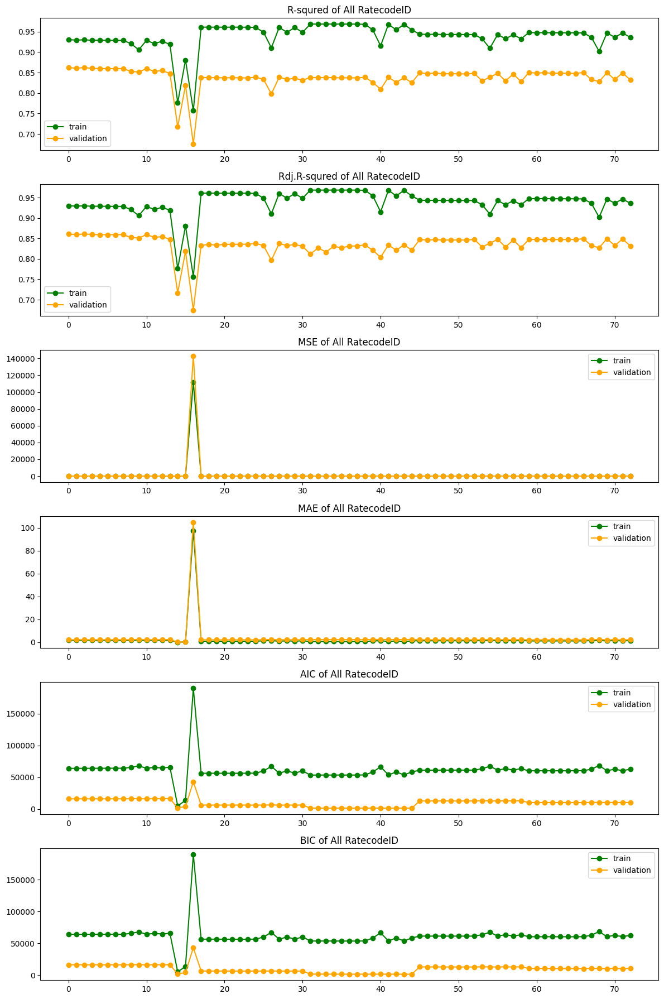

In [111]:
##############################################
#Visualize Results
#All RatecodeID
##############################################

fig, axs = plt.subplots(6, 1, figsize=(12,18))

metrics=['R-squred','Rdj.R-squred','MSE', 'MAE', 'AIC', 'BIC']

for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(train_result_evaluation_metrics['model'], train_result_evaluation_metrics[metric], marker='o',color='green', label='train')
    ax.plot(val_result_evaluation_metrics['model'], val_result_evaluation_metrics[metric], marker='o', color='orange', label='validation')
    
    ax.set_title(f'{metric} of All RatecodeID')
    ax.legend()
plt.tight_layout()
plt.show()

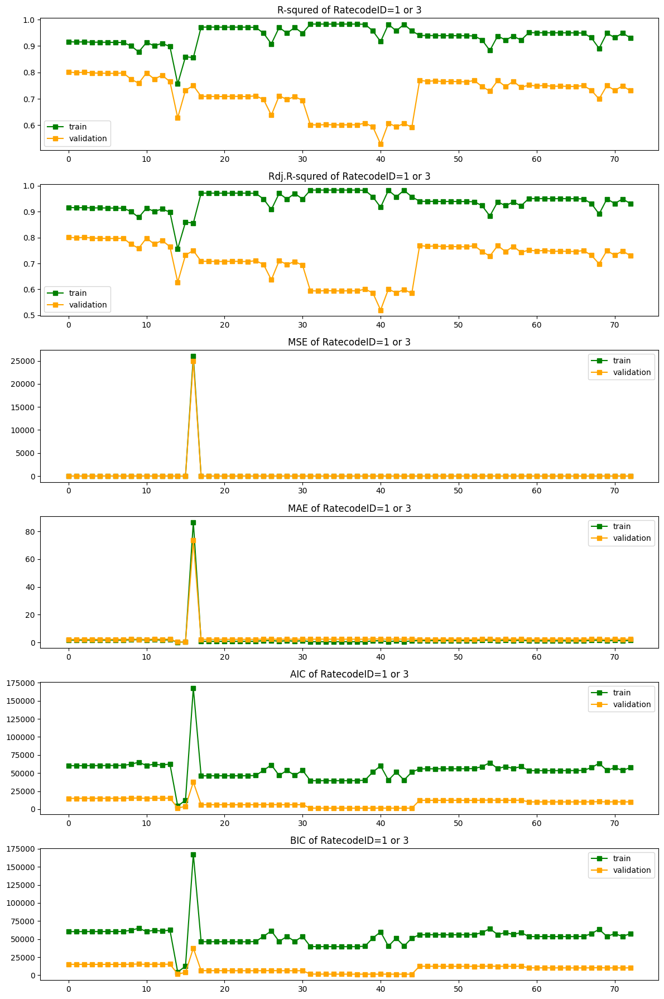

In [112]:
##############################################
#Visualize Results
#RatecodeID=1 or 3
##############################################

fig, axs = plt.subplots(6, 1, figsize=(12,18))

metrics=['R-squred','Rdj.R-squred','MSE', 'MAE', 'AIC', 'BIC']

for metric, ax in zip(metrics, axs.ravel()):
    ax.plot(trainB_result_evaluation_metrics['model'], trainB_result_evaluation_metrics[metric], marker='s',color='green', label='train')
    ax.plot(valB_result_evaluation_metrics['model'], valB_result_evaluation_metrics[metric], marker='s', color='orange', label='validation')
    
    ax.set_title(f'{metric} of RatecodeID=1 or 3')
    ax.legend()
plt.tight_layout()
plt.show()

### Conclusion

* Linier regression didn't meet assumptions, need to build other models